<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Mon Feb 19 20:22:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   29C    P0              48W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 8s, sys: 5.32 ms, total: 9min 8s
Wall time: 9min 10s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

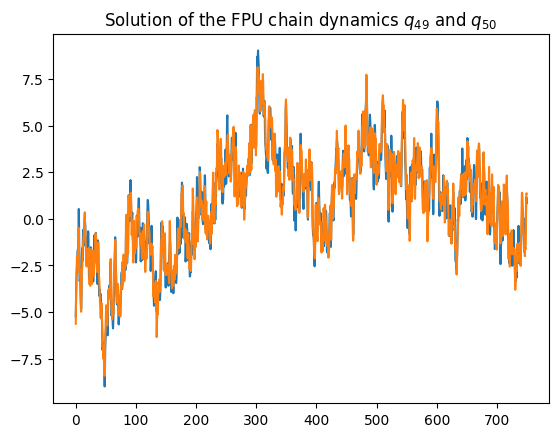

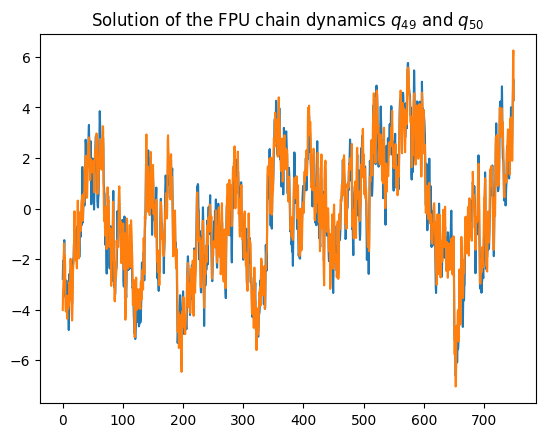

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


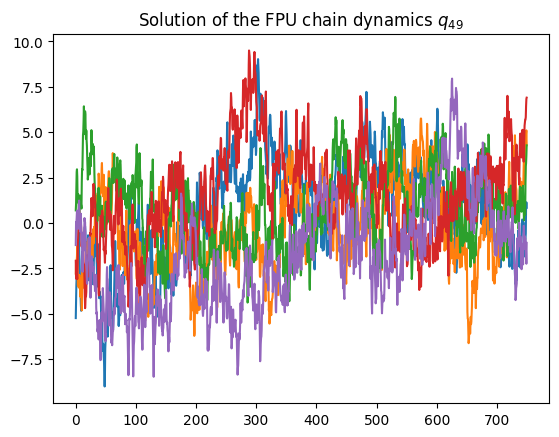

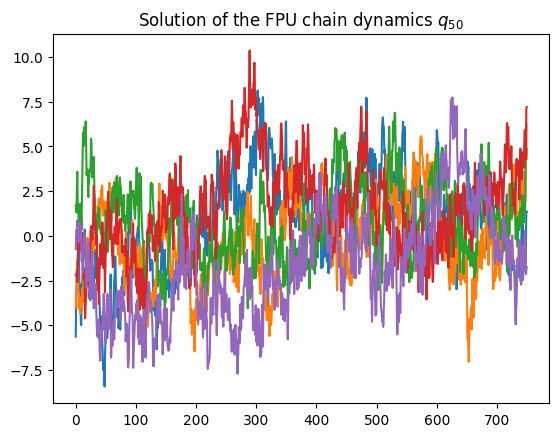

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


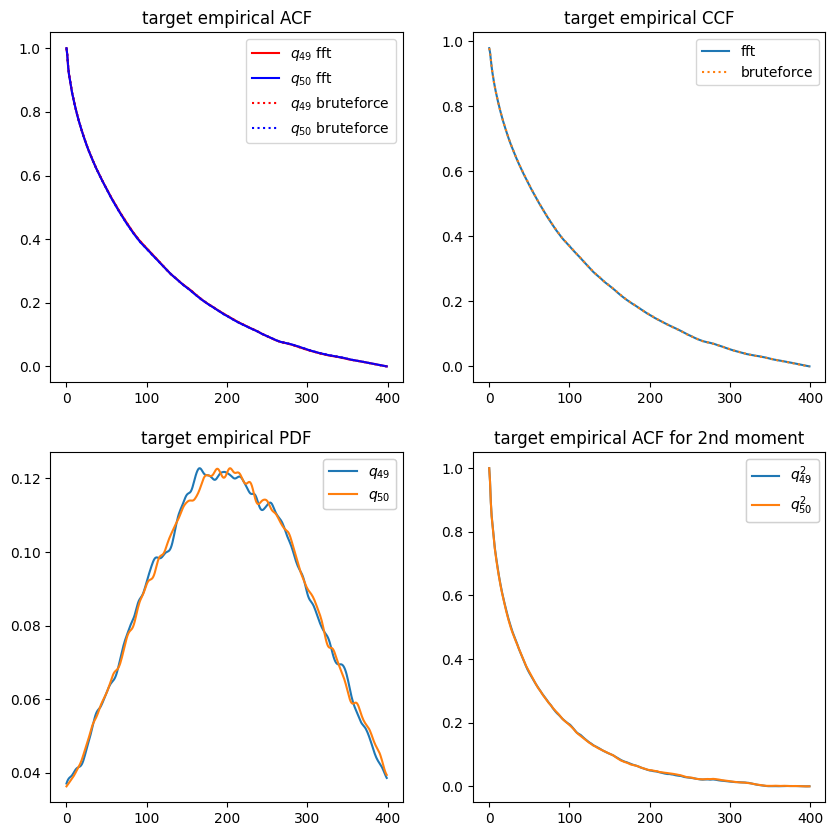

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

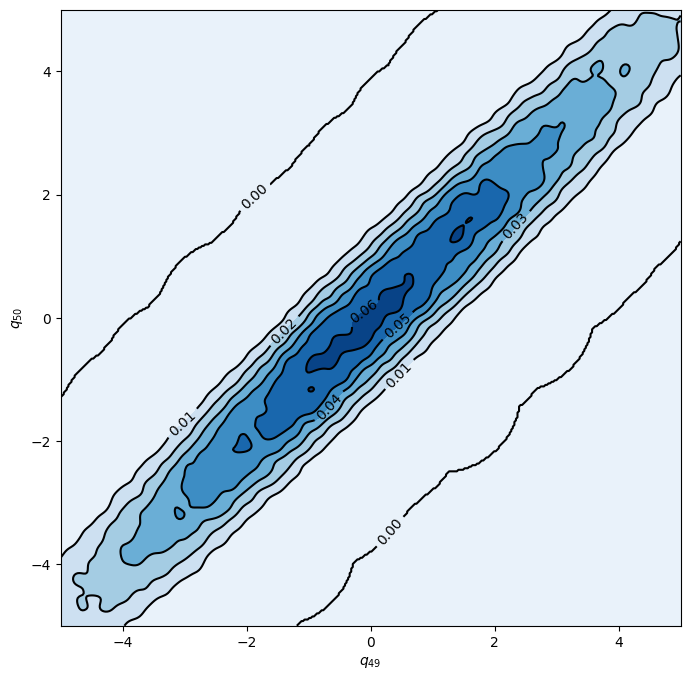

In [14]:
xmin, xmax = -5, 5
ymin, ymax = -5, 5

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

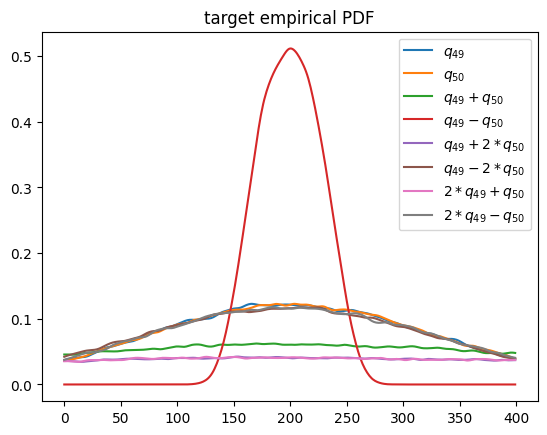

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(2.).float()
        self.x_pdf2_s = torch.tensor(2.).float()
        self.x_acf2_s = torch.tensor(2.).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8295, 0.8206, acf: 0.09796, ccf: 0.09777, pdf: 0.29325, pdf2: 0.29009, acf2: 0.04155
[50]-th step loss: 0.1774, 0.2010, acf: 0.02382, ccf: 0.02384, pdf: 0.09409, pdf2: 0.04894, acf2: 0.01034
[100]-th step loss: 0.0902, 0.0905, acf: 0.01810, ccf: 0.01807, pdf: 0.02753, pdf2: 0.01205, acf2: 0.01480
[150]-th step loss: 0.1591, 0.1291, acf: 0.01919, ccf: 0.01915, pdf: 0.05622, pdf2: 0.03103, acf2: 0.00352
[200]-th step loss: 0.0563, 0.0621, acf: 0.00396, ccf: 0.00392, pdf: 0.02762, pdf2: 0.01561, acf2: 0.01101
[250]-th step loss: 0.0318, 0.0418, acf: 0.00571, ccf: 0.00568, pdf: 0.01675, pdf2: 0.01247, acf2: 0.00115
[300]-th step loss: 0.0243, 0.0304, acf: 0.00244, ccf: 0.00246, pdf: 0.01171, pdf2: 0.00815, acf2: 0.00564
[350]-th step loss: 0.0551, 0.0413, acf: 0.00827, ccf: 0.00824, pdf: 0.01115, pdf2: 0.01158, acf2: 0.00203
[400]-th step loss: 0.0348, 0.0335, acf: 0.00055, ccf: 0.00053, pdf: 0.01651, pdf2: 0.01008, acf2: 0.00588
[450]-th step loss: 0.0137, 0.0136, acf:

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

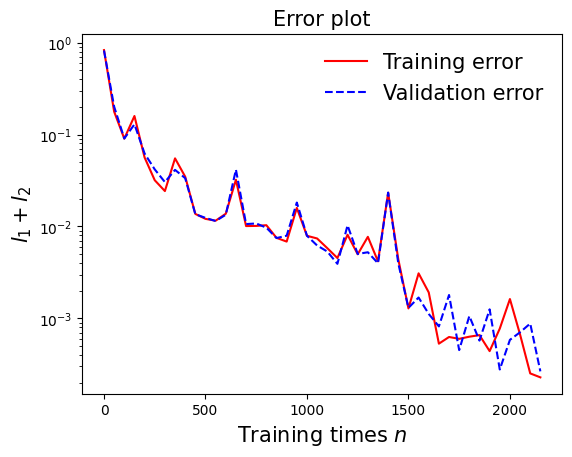

In [25]:
draw_loss(model)

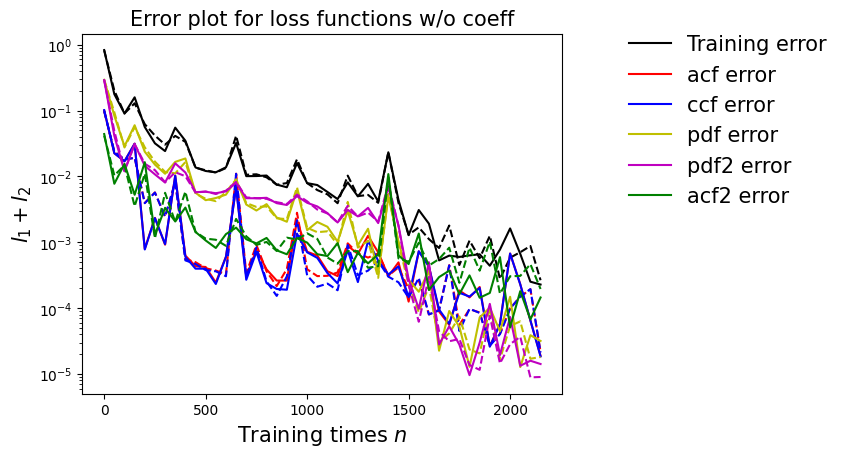

In [26]:
draw_errors(model)

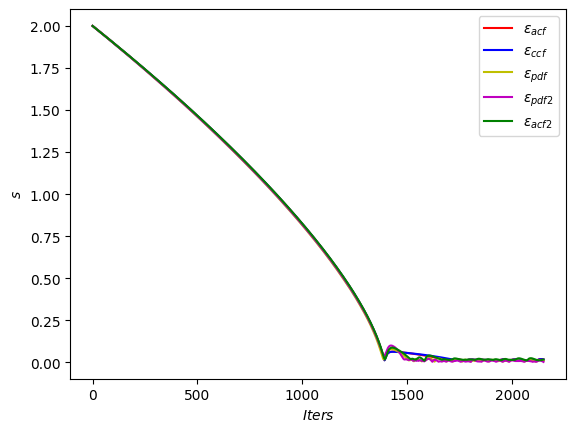

In [27]:
draw_adaptive_w(model)

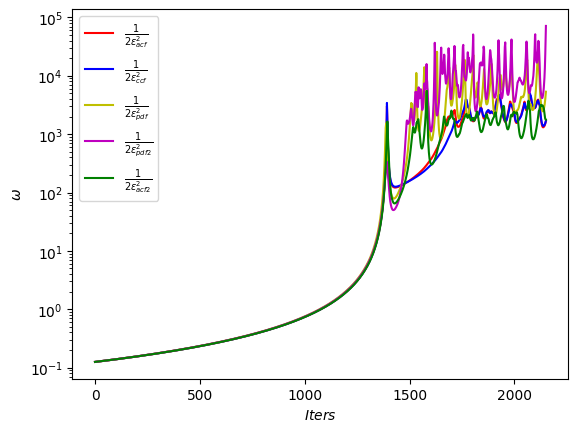

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

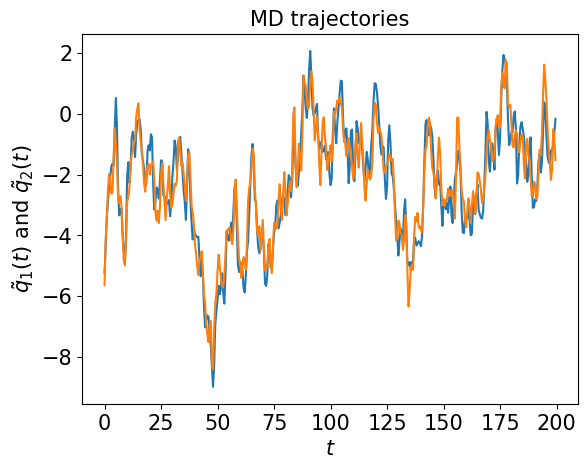

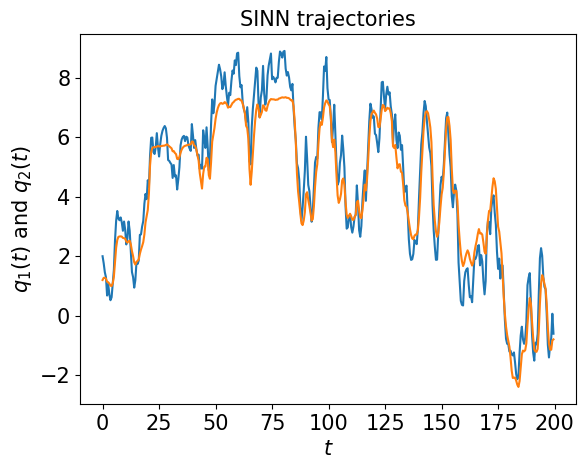

In [36]:
test1(model)

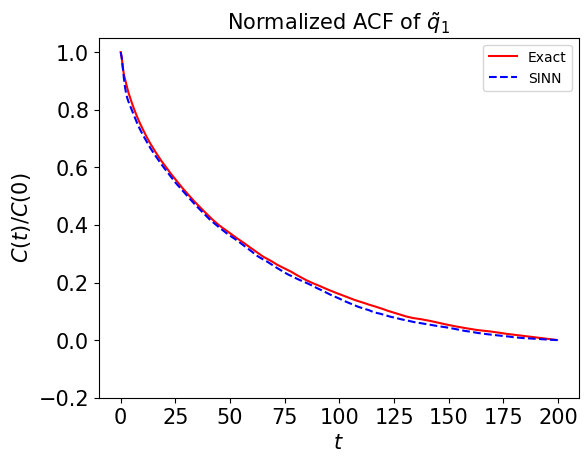

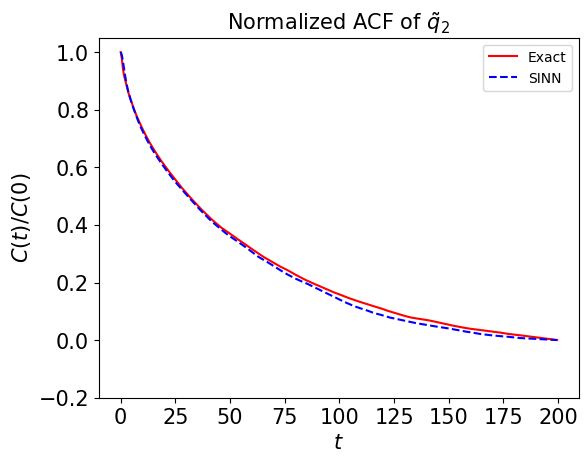

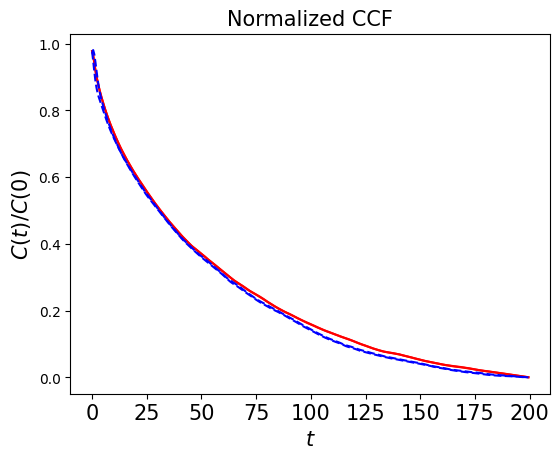

In [37]:
test2(model)

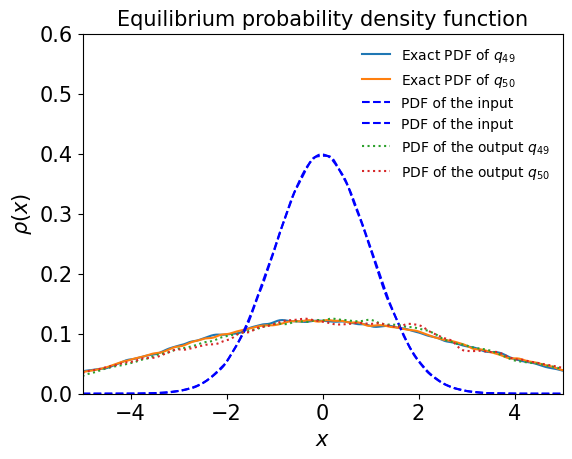

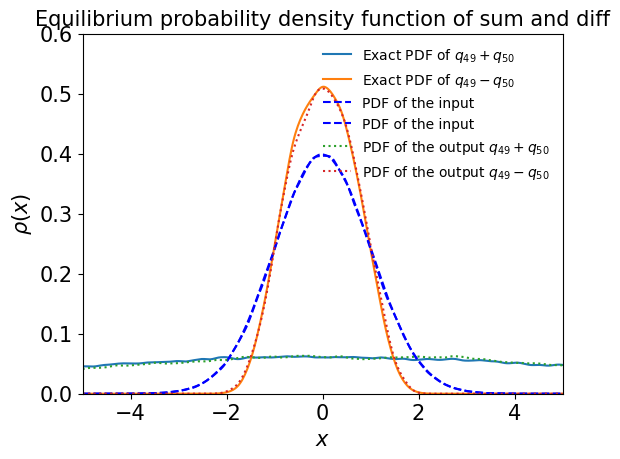

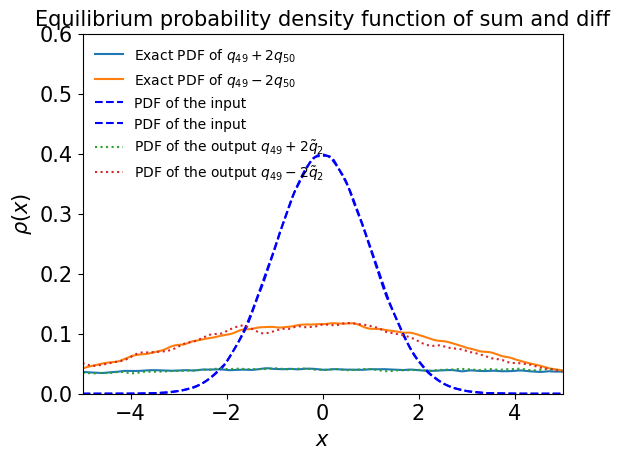

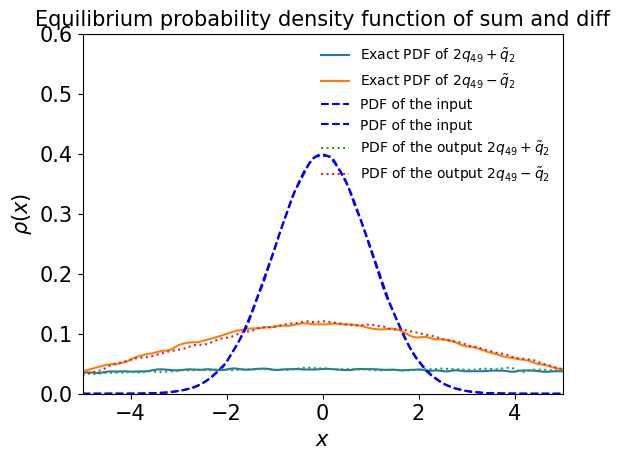

In [38]:
test3(model)

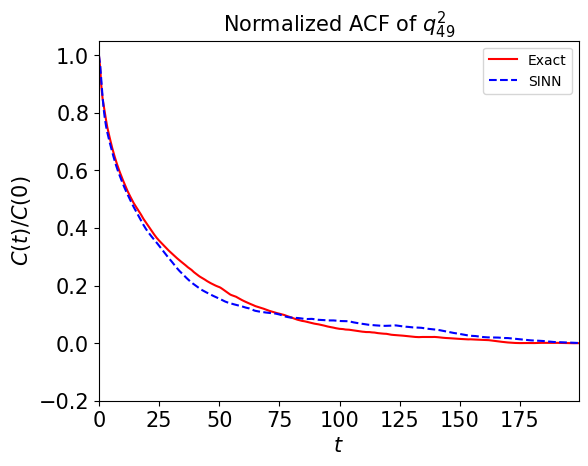

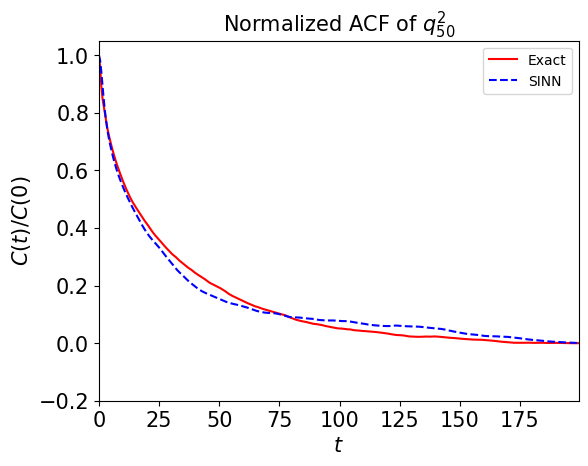

In [39]:
test4(model)

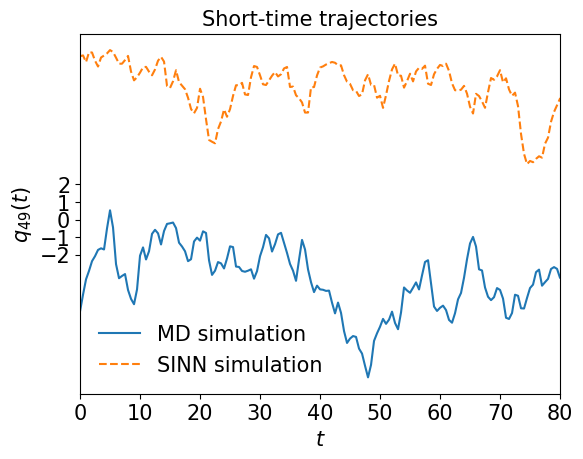

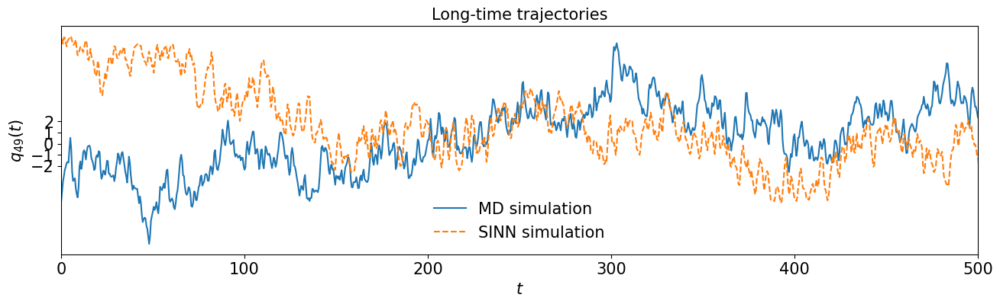

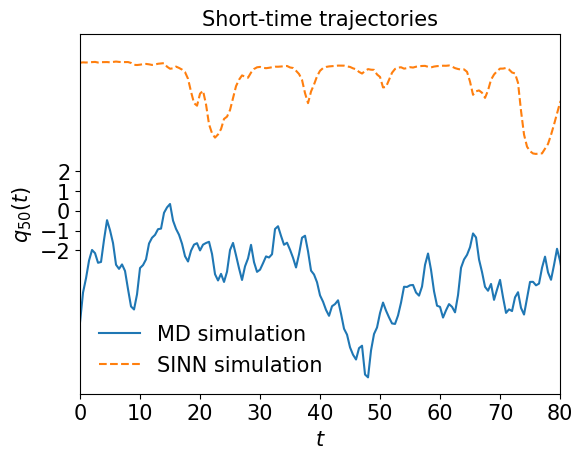

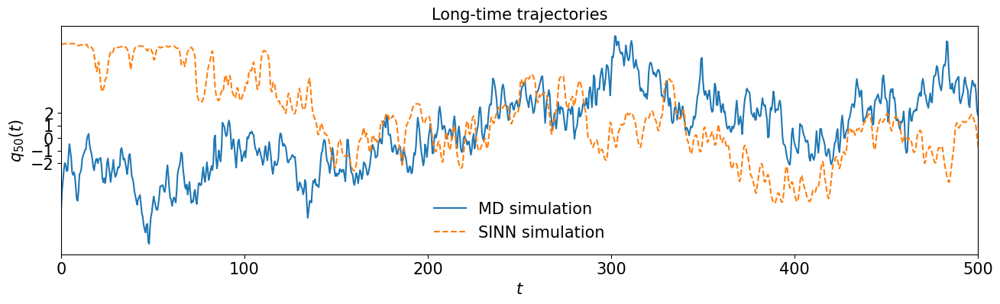

In [40]:
test5(model)

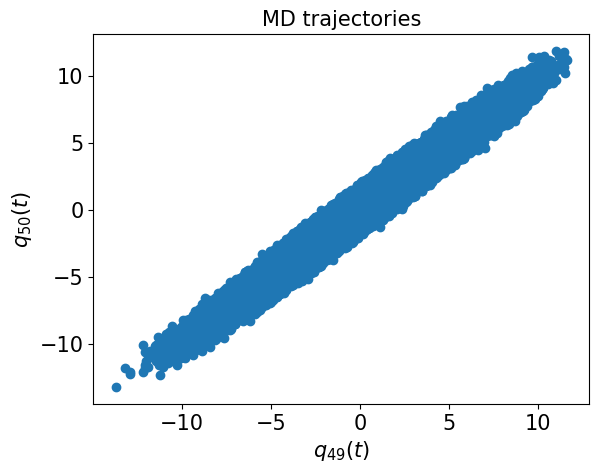

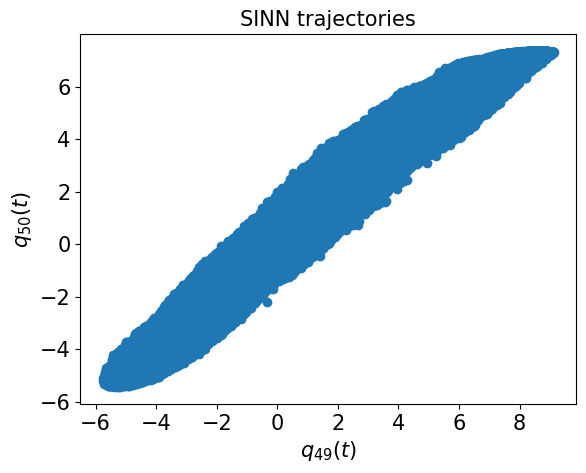

In [41]:
test6(model)

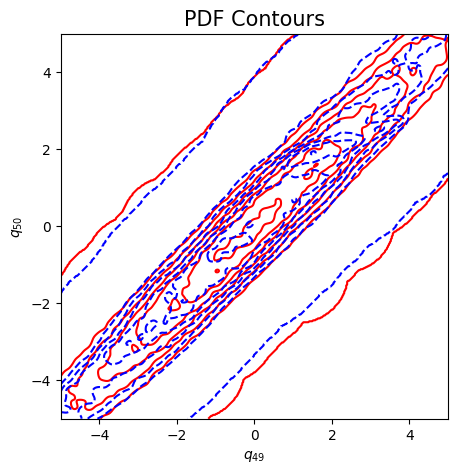

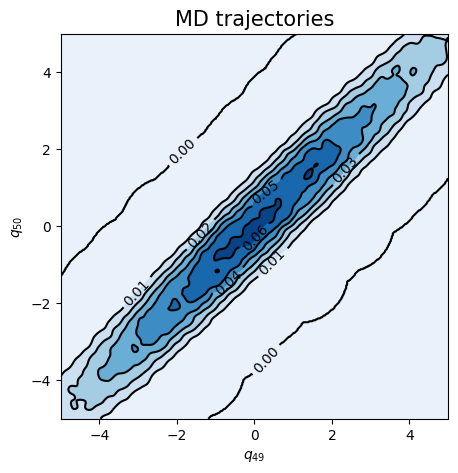

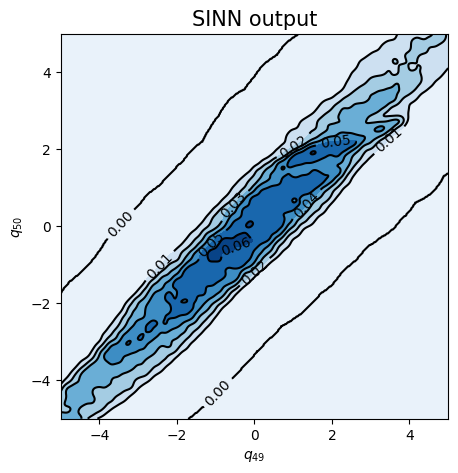

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8421, 0.8238, acf: 0.09913, ccf: 0.09894, pdf: 0.29311, pdf2: 0.29001, acf2: 0.04256
[50]-th step loss: 0.1461, 0.1699, acf: 0.02997, ccf: 0.02991, pdf: 0.05924, pdf2: 0.04514, acf2: 0.00565
[100]-th step loss: 0.0227, 0.0193, acf: 0.00237, ccf: 0.00237, pdf: 0.00619, pdf2: 0.00570, acf2: 0.00263
[150]-th step loss: 0.0101, 0.0151, acf: 0.00084, ccf: 0.00084, pdf: 0.00431, pdf2: 0.00428, acf2: 0.00481
[200]-th step loss: 0.0121, 0.0112, acf: 0.00114, ccf: 0.00114, pdf: 0.00337, pdf2: 0.00353, acf2: 0.00197
[250]-th step loss: 0.0090, 0.0064, acf: 0.00016, ccf: 0.00017, pdf: 0.00261, pdf2: 0.00230, acf2: 0.00113
[300]-th step loss: 0.0112, 0.0169, acf: 0.00097, ccf: 0.00100, pdf: 0.00366, pdf2: 0.00430, acf2: 0.00701
[350]-th step loss: 0.1825, 0.1747, acf: 0.06589, ccf: 0.06578, pdf: 0.00701, pdf2: 0.01527, acf2: 0.02071
[400]-th step loss: 0.1122, 0.1200, acf: 0.03393, ccf: 0.03392, pdf: 0.00820, pdf2: 0.04199, acf2: 0.00194
[450]-th step loss: 0.1016, 0.0443, acf:

[3850]-th step loss: 0.0658, 0.0690, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01583
[3900]-th step loss: 0.0714, 0.0684, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01533
[3950]-th step loss: 0.0681, 0.0674, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01437
[4000]-th step loss: 0.0712, 0.0698, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01667
[4050]-th step loss: 0.0676, 0.0669, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01380
[4100]-th step loss: 0.0681, 0.0691, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01601
[4150]-th step loss: 0.0655, 0.0680, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01494
[4200]-th step loss: 0.0662, 0.0692, acf: 0.00004, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01610
[4250]-th step loss: 0.0678, 0.0675, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01444
[4300]-th step loss: 0.0643,

[7650]-th step loss: 0.0681, 0.0675, acf: 0.00001, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01446
[7700]-th step loss: 0.0679, 0.0672, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01410
[7750]-th step loss: 0.0670, 0.0701, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01694
[7800]-th step loss: 0.0648, 0.0697, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01652
[7850]-th step loss: 0.0701, 0.0668, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01364
[7900]-th step loss: 0.0693, 0.0699, acf: 0.00006, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01676
[7950]-th step loss: 0.0704, 0.0693, acf: 0.00003, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01620
[8000]-th step loss: 0.0668, 0.0678, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01465
[8050]-th step loss: 0.0699, 0.0690, acf: 0.00003, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01589
[8100]-th step loss: 0.0687,

[11450]-th step loss: 0.0689, 0.0697, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01649
[11500]-th step loss: 0.0690, 0.0686, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01548
[11550]-th step loss: 0.0699, 0.0671, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01399
[11600]-th step loss: 0.0684, 0.0686, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01551
[11650]-th step loss: 0.0661, 0.0688, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01569
[11700]-th step loss: 0.0723, 0.0677, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01467
[11750]-th step loss: 0.0642, 0.0653, acf: 0.00019, ccf: 0.00019, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01183
[11800]-th step loss: 0.0700, 0.0688, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01570
[11850]-th step loss: 0.0645, 0.0651, acf: 0.00022, ccf: 0.00021, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01162
[11900]-th step los

[15250]-th step loss: 0.0658, 0.0673, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04473, acf2: 0.01423
[15300]-th step loss: 0.0659, 0.0685, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04473, acf2: 0.01548
[15350]-th step loss: 0.0678, 0.0660, acf: 0.00019, ccf: 0.00019, pdf: 0.00829, pdf2: 0.04473, acf2: 0.01262
[15400]-th step loss: 0.0700, 0.0674, acf: 0.00005, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04473, acf2: 0.01429
[15450]-th step loss: 0.0699, 0.0698, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04473, acf2: 0.01664
[15500]-th step loss: 0.0741, 0.0692, acf: 0.00003, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04472, acf2: 0.01609
[15550]-th step loss: 0.0690, 0.0681, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04472, acf2: 0.01502
[15600]-th step loss: 0.0647, 0.0702, acf: 0.00008, ccf: 0.00009, pdf: 0.00829, pdf2: 0.04472, acf2: 0.01699
[15650]-th step loss: 0.0697, 0.0683, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.04472, acf2: 0.01522
[15700]-th step los

[19050]-th step loss: 0.0710, 0.0662, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04358, acf2: 0.01430
[19100]-th step loss: 0.0709, 0.0671, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04347, acf2: 0.01530
[19150]-th step loss: 0.0632, 0.0670, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04323, acf2: 0.01541
[19200]-th step loss: 0.0648, 0.0664, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.04316, acf2: 0.01496
[19250]-th step loss: 0.0656, 0.0660, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04268, acf2: 0.01504
[19300]-th step loss: 0.0666, 0.0670, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04260, acf2: 0.01604
[19350]-th step loss: 0.0659, 0.0645, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04204, acf2: 0.01414
[19400]-th step loss: 0.0622, 0.0654, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04162, acf2: 0.01548
[19450]-th step loss: 0.0659, 0.0656, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04180, acf2: 0.01539
[19500]-th step los

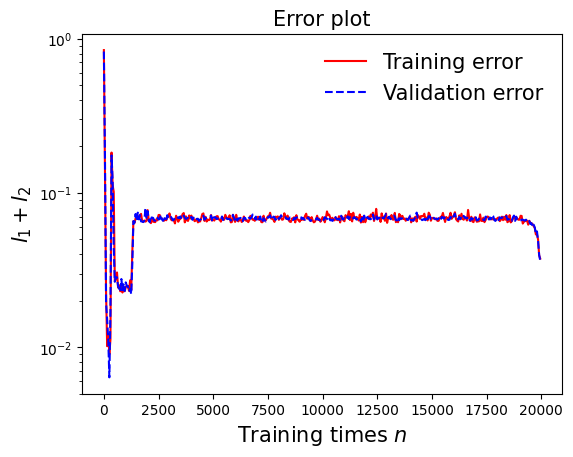

In [44]:
draw_loss(model1)

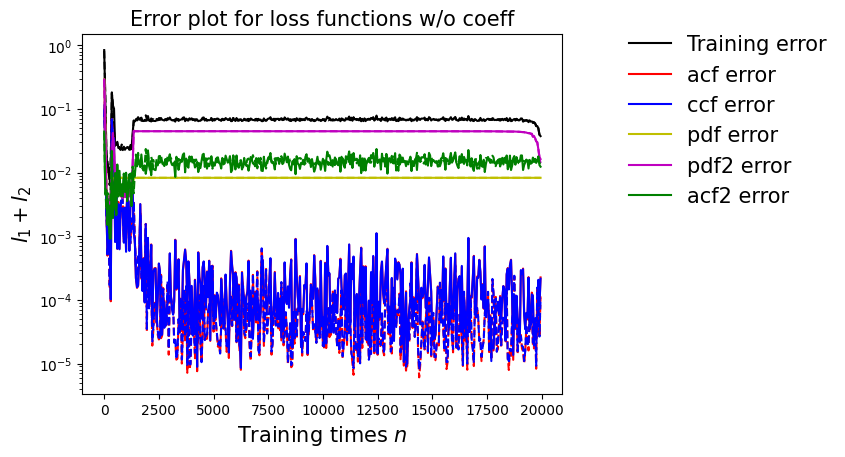

In [45]:
draw_errors(model1)

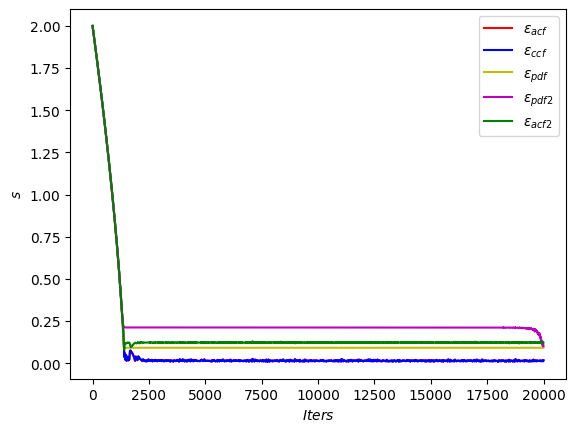

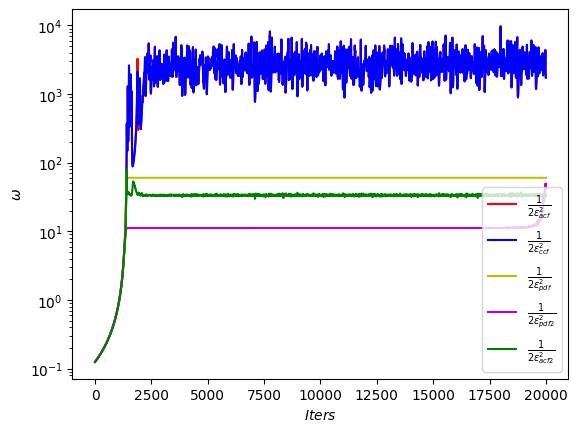

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

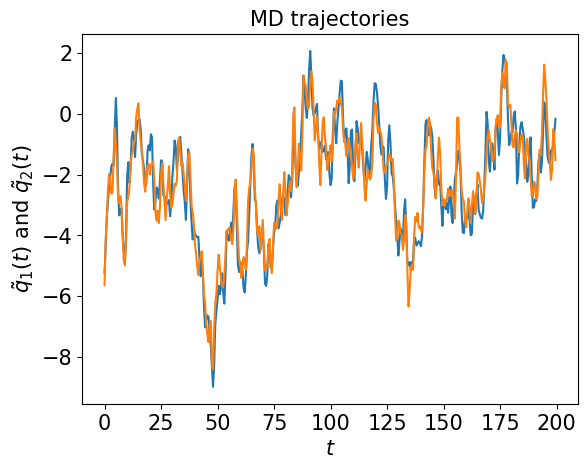

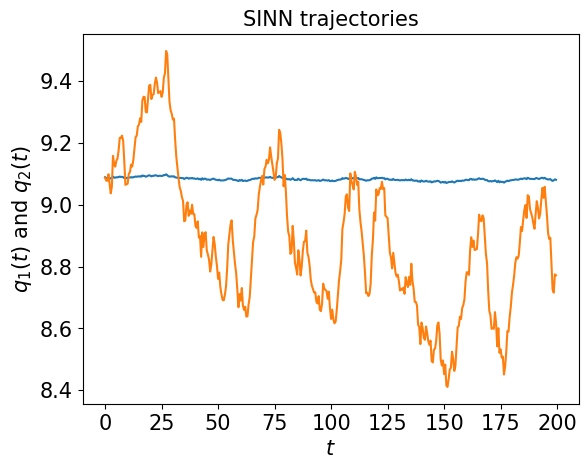

In [47]:
test1(model1)

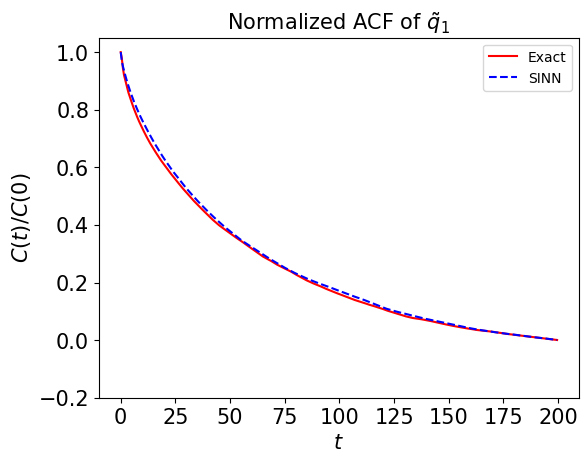

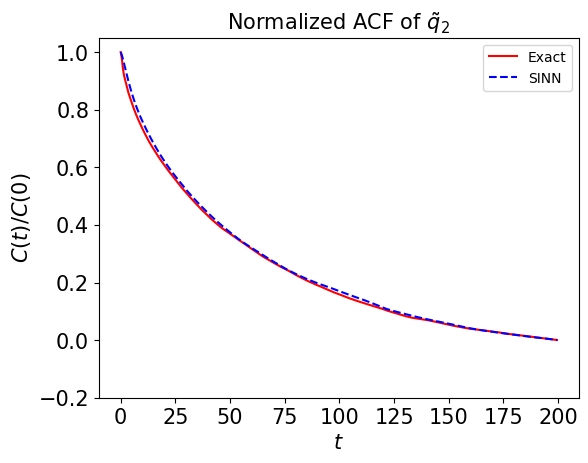

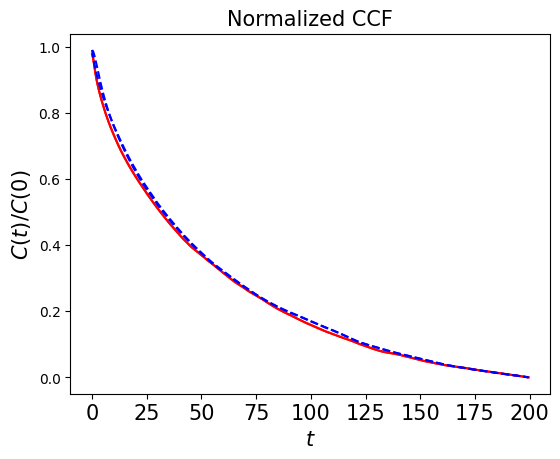

In [48]:
test2(model1)

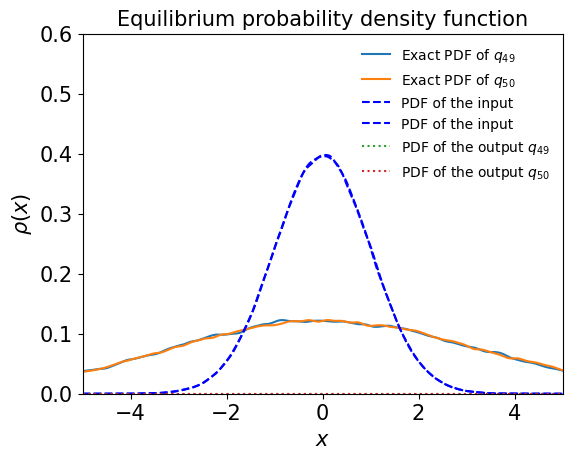

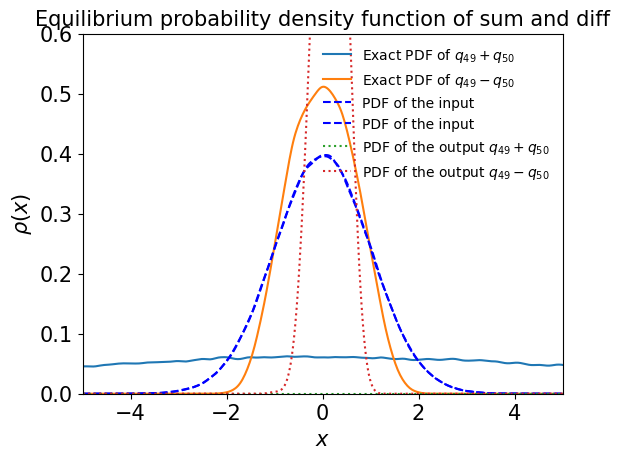

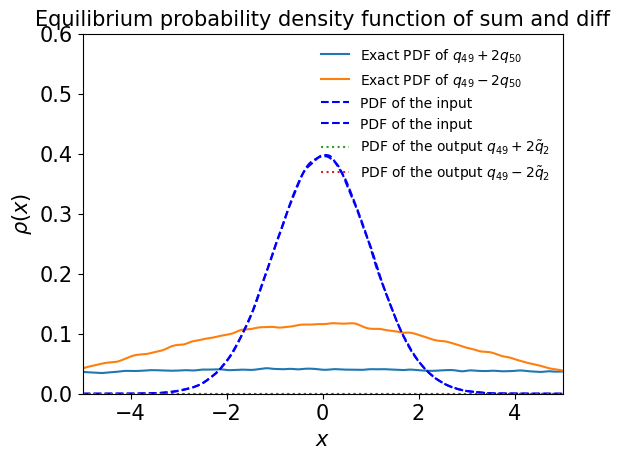

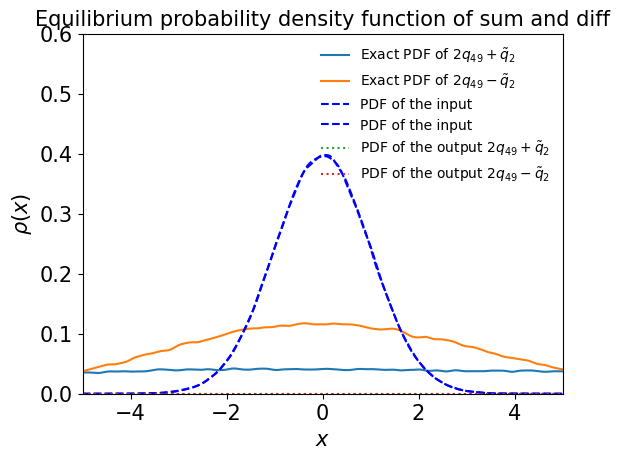

In [49]:
test3(model1)

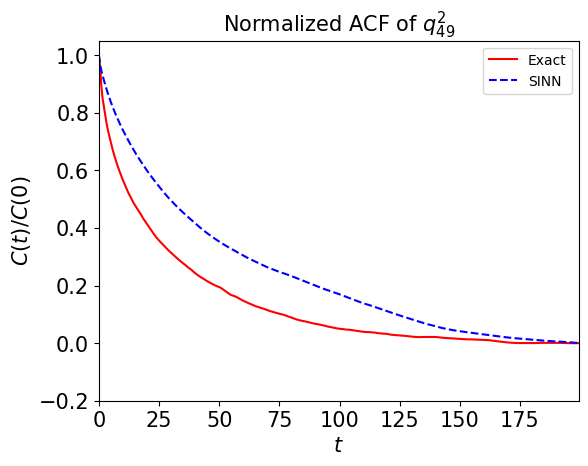

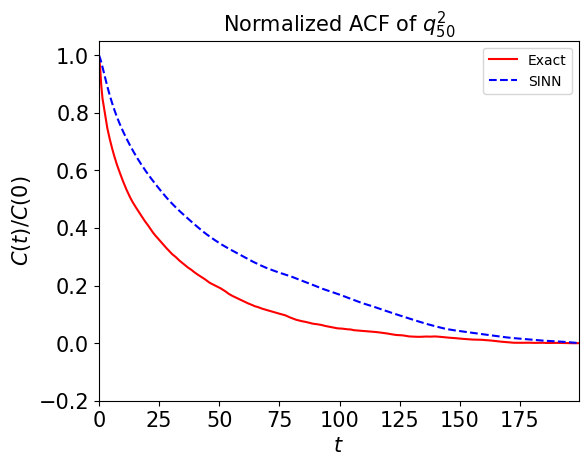

In [50]:
test4(model1)

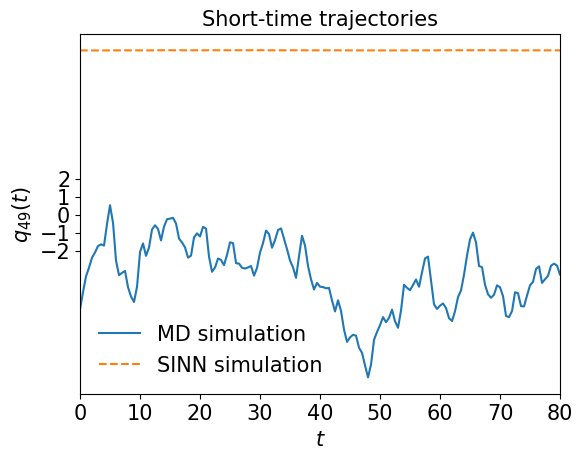

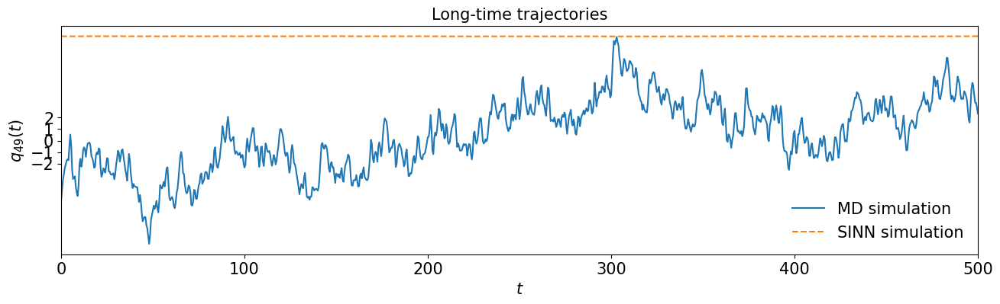

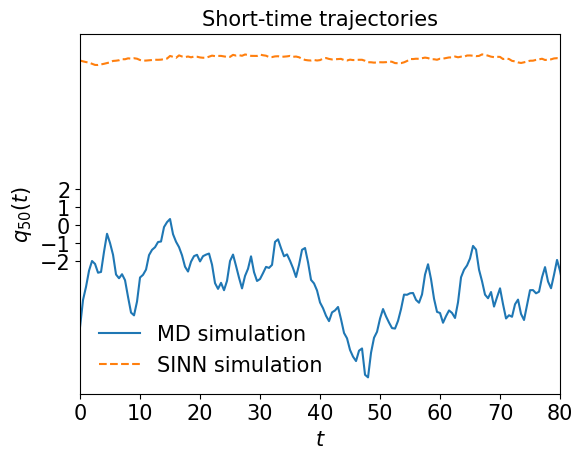

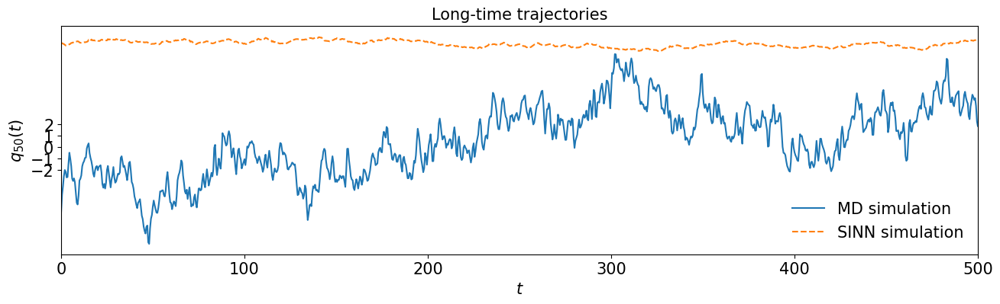

In [51]:
test5(model1)

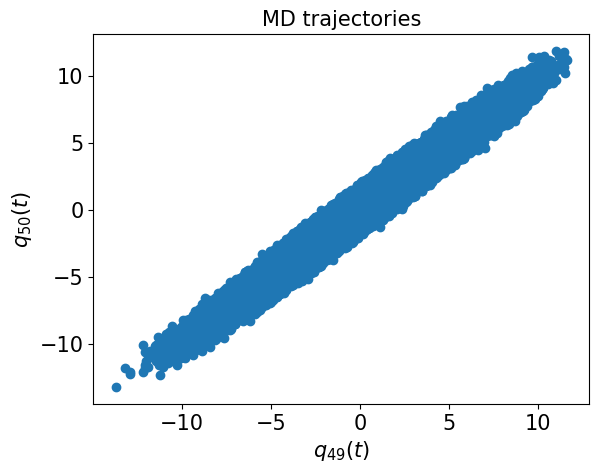

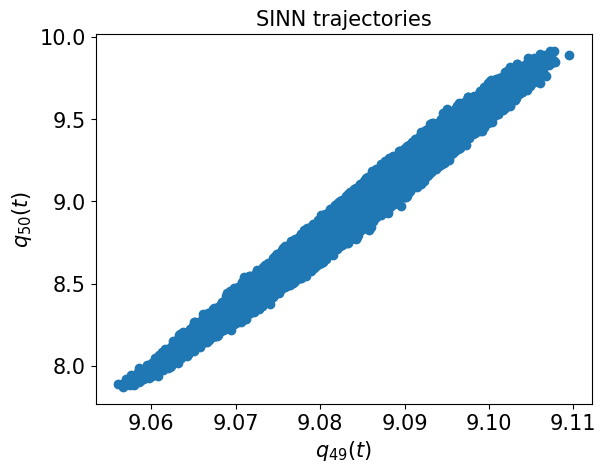

In [52]:
test6(model1)

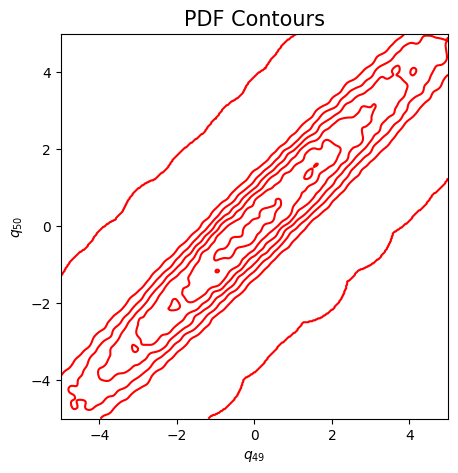

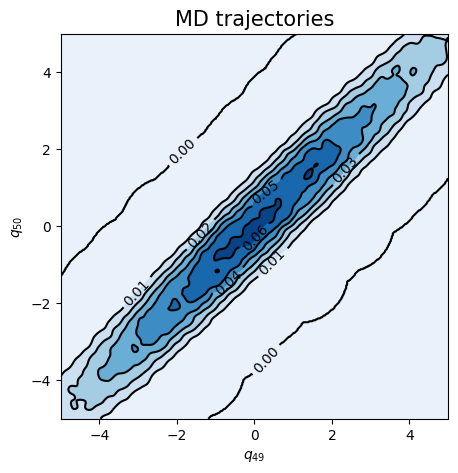

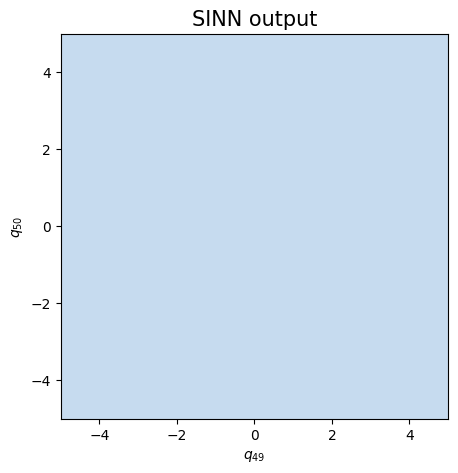

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8363, 0.8262, acf: 0.09994, ccf: 0.09978, pdf: 0.29310, pdf2: 0.28993, acf2: 0.04346
[50]-th step loss: 0.1382, 0.1230, acf: 0.01149, ccf: 0.01144, pdf: 0.05127, pdf2: 0.04234, acf2: 0.00647
[100]-th step loss: 0.0773, 0.0810, acf: 0.00172, ccf: 0.00161, pdf: 0.03760, pdf2: 0.03538, acf2: 0.00468
[150]-th step loss: 0.0234, 0.0265, acf: 0.00191, ccf: 0.00147, pdf: 0.01177, pdf2: 0.00842, acf2: 0.00292
[200]-th step loss: 0.1057, 0.0836, acf: 0.02392, ccf: 0.02386, pdf: 0.00787, pdf2: 0.00991, acf2: 0.01804
[250]-th step loss: 0.0225, 0.0234, acf: 0.00220, ccf: 0.00203, pdf: 0.00693, pdf2: 0.00562, acf2: 0.00664
[300]-th step loss: 0.0163, 0.0168, acf: 0.00170, ccf: 0.00149, pdf: 0.00576, pdf2: 0.00430, acf2: 0.00354
[350]-th step loss: 0.0143, 0.0126, acf: 0.00152, ccf: 0.00148, pdf: 0.00377, pdf2: 0.00286, acf2: 0.00294
[400]-th step loss: 0.0714, 0.0846, acf: 0.02375, ccf: 0.02344, pdf: 0.00625, pdf2: 0.00637, acf2: 0.02478
[450]-th step loss: 0.0159, 0.0122, acf:

[3850]-th step loss: 0.0327, 0.0367, acf: 0.00030, ccf: 0.00033, pdf: 0.00829, pdf2: 0.00542, acf2: 0.02238
[3900]-th step loss: 0.0311, 0.0302, acf: 0.00001, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00455, acf2: 0.01731
[3950]-th step loss: 0.0304, 0.0315, acf: 0.00003, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00435, acf2: 0.01878
[4000]-th step loss: 0.3055, 0.2997, acf: 0.07038, ccf: 0.06208, pdf: 0.01254, pdf2: 0.00833, acf2: 0.14642
[4050]-th step loss: 0.2253, 0.2330, acf: 0.05563, ccf: 0.04611, pdf: 0.00547, pdf2: 0.00254, acf2: 0.12325
[4100]-th step loss: 0.1898, 0.2027, acf: 0.04728, ccf: 0.03507, pdf: 0.00523, pdf2: 0.00236, acf2: 0.11273
[4150]-th step loss: 0.0619, 0.0849, acf: 0.03246, ccf: 0.03255, pdf: 0.00829, pdf2: 0.00390, acf2: 0.00773
[4200]-th step loss: 0.0315, 0.0394, acf: 0.00109, ccf: 0.00119, pdf: 0.00829, pdf2: 0.00502, acf2: 0.02386
[4250]-th step loss: 0.0275, 0.0360, acf: 0.00073, ccf: 0.00088, pdf: 0.00829, pdf2: 0.00433, acf2: 0.02176
[4300]-th step loss: 0.0258,

[7650]-th step loss: 0.0004, 0.0023, acf: 0.00098, ccf: 0.00095, pdf: 0.00006, pdf2: 0.00003, acf2: 0.00027
[7700]-th step loss: 0.0007, 0.0014, acf: 0.00060, ccf: 0.00057, pdf: 0.00005, pdf2: 0.00002, acf2: 0.00017
[7750]-th step loss: 0.0011, 0.0012, acf: 0.00047, ccf: 0.00045, pdf: 0.00006, pdf2: 0.00004, acf2: 0.00023
[7800]-th step loss: 0.0010, 0.0006, acf: 0.00024, ccf: 0.00022, pdf: 0.00005, pdf2: 0.00002, acf2: 0.00009
[7850]-th step loss: 0.0013, 0.0019, acf: 0.00046, ccf: 0.00043, pdf: 0.00029, pdf2: 0.00018, acf2: 0.00051
[7900]-th step loss: 0.0019, 0.0005, acf: 0.00007, ccf: 0.00007, pdf: 0.00003, pdf2: 0.00007, acf2: 0.00022
[7950]-th step loss: 0.0017, 0.0027, acf: 0.00101, ccf: 0.00099, pdf: 0.00015, pdf2: 0.00008, acf2: 0.00047
[8000]-th step loss: 0.0017, 0.0003, acf: 0.00009, ccf: 0.00008, pdf: 0.00004, pdf2: 0.00002, acf2: 0.00006
[8050]-th step loss: 0.0006, 0.0006, acf: 0.00018, ccf: 0.00016, pdf: 0.00006, pdf2: 0.00009, acf2: 0.00006
[8100]-th step loss: 0.0019,

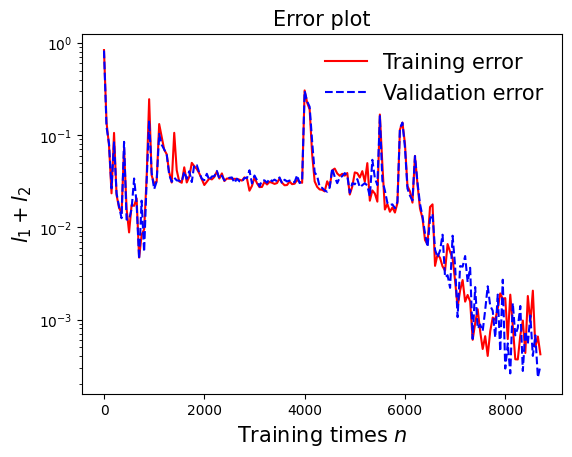

In [55]:
draw_loss(model2)

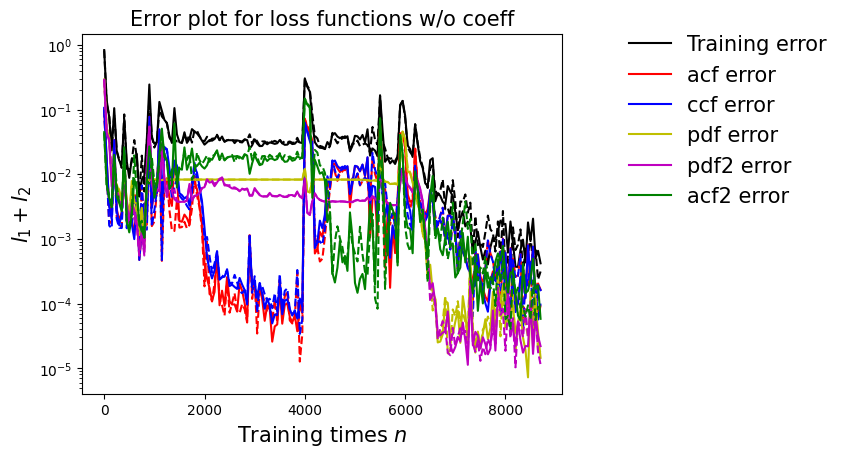

In [56]:
draw_errors(model2)

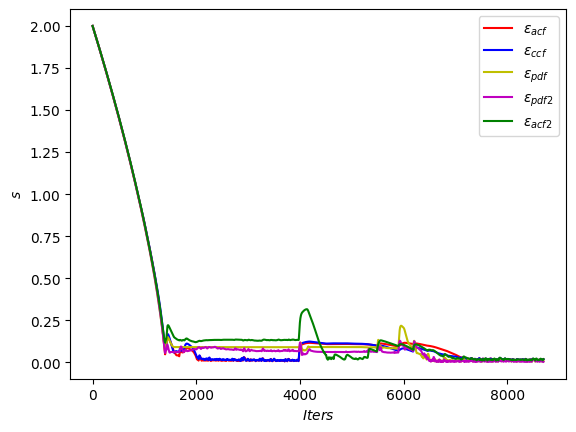

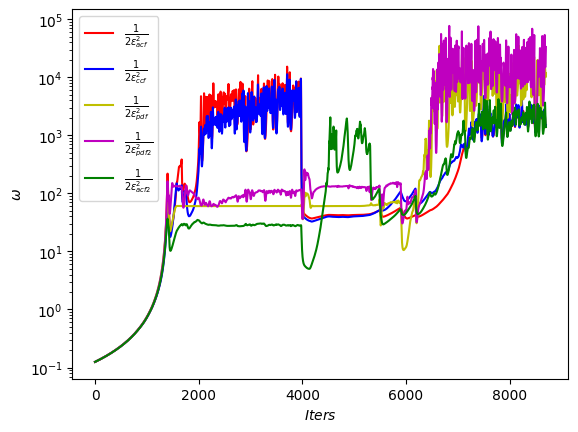

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

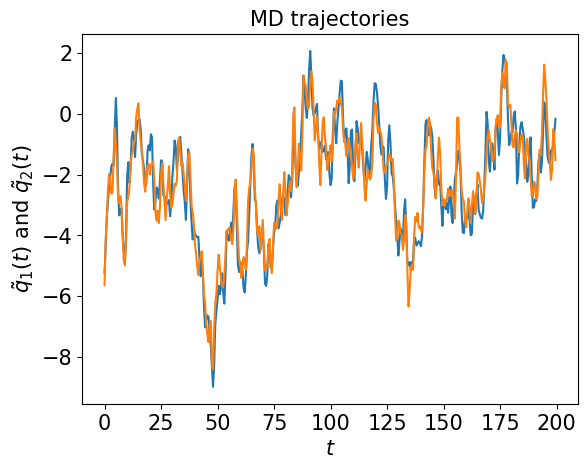

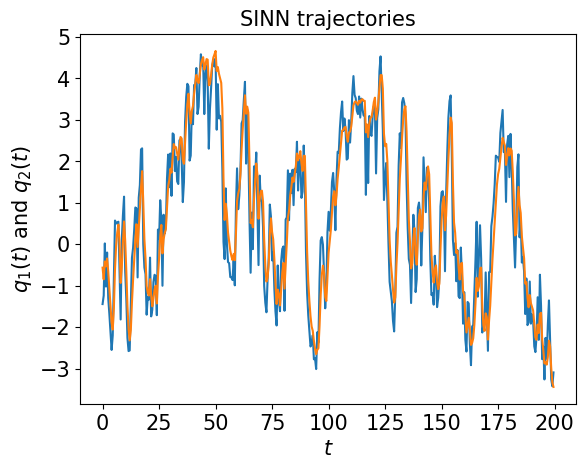

In [58]:
test1(model2)

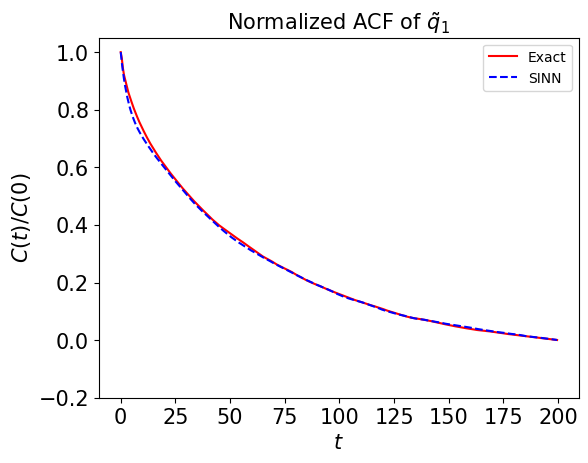

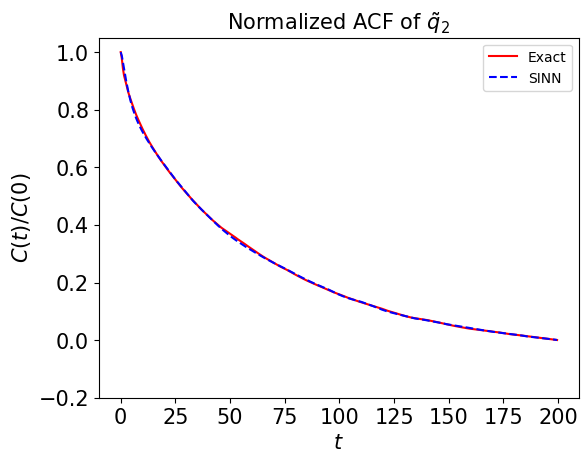

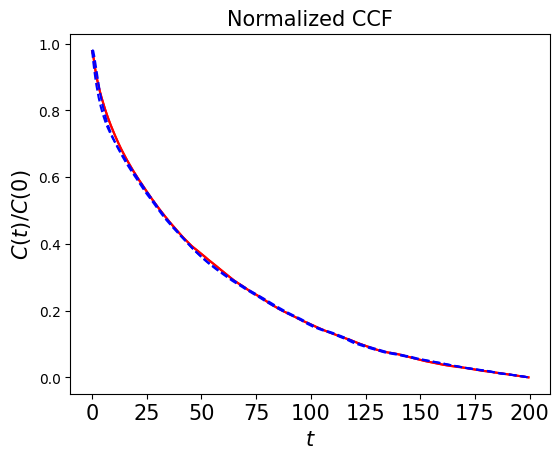

In [59]:
test2(model2)

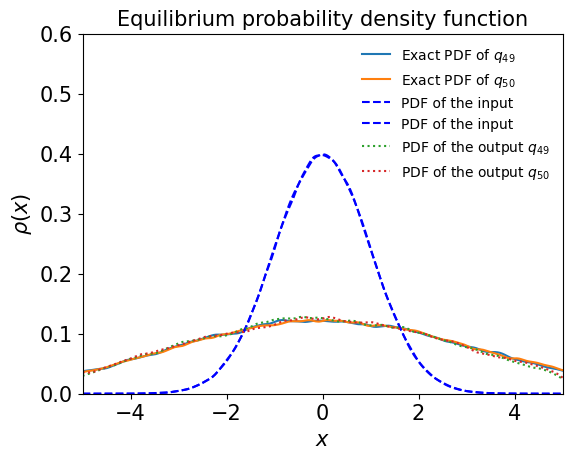

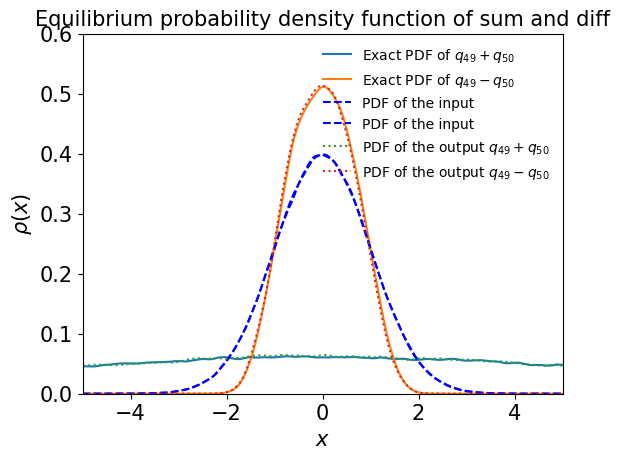

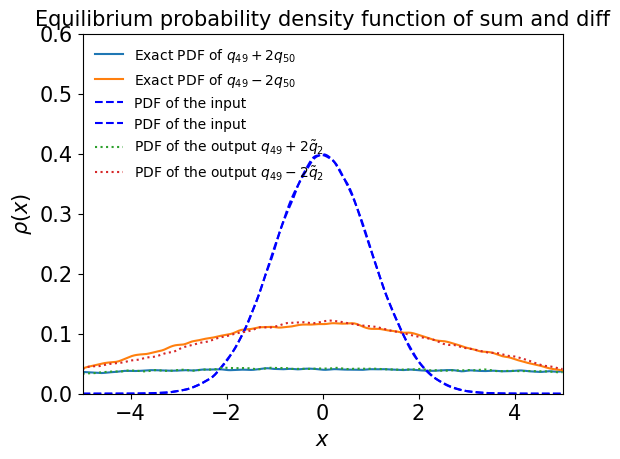

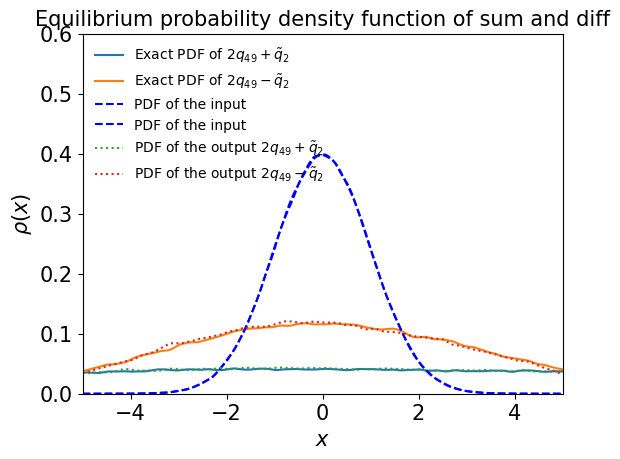

In [60]:
test3(model2)

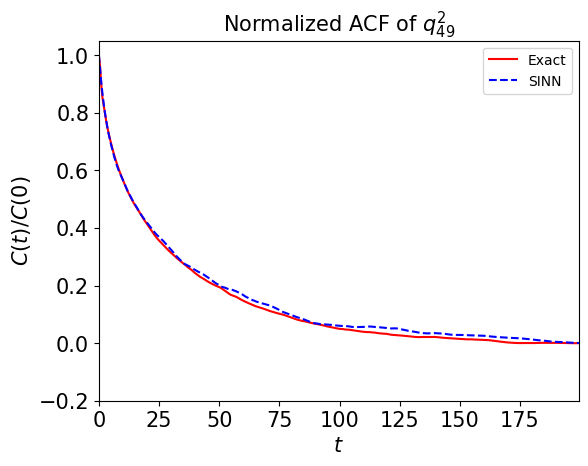

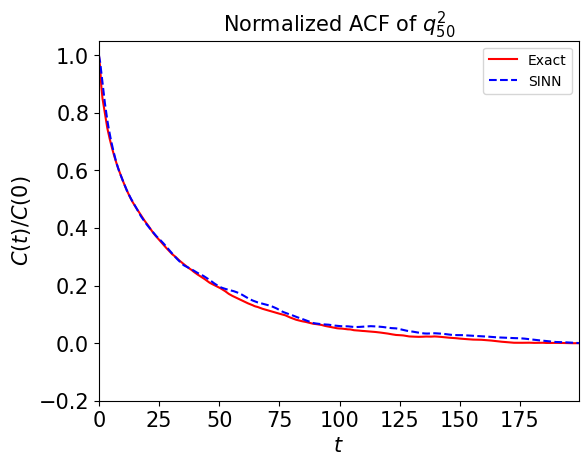

In [61]:
test4(model2)

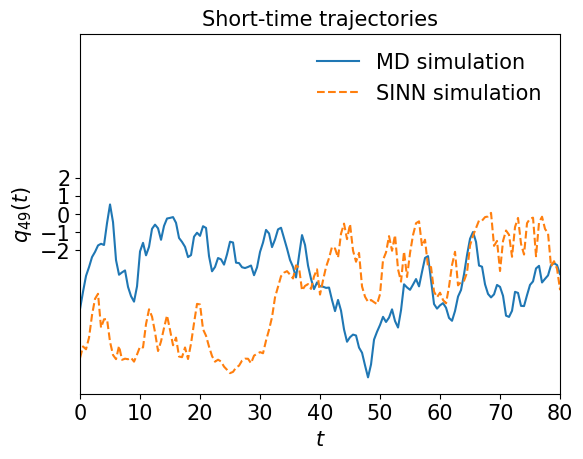

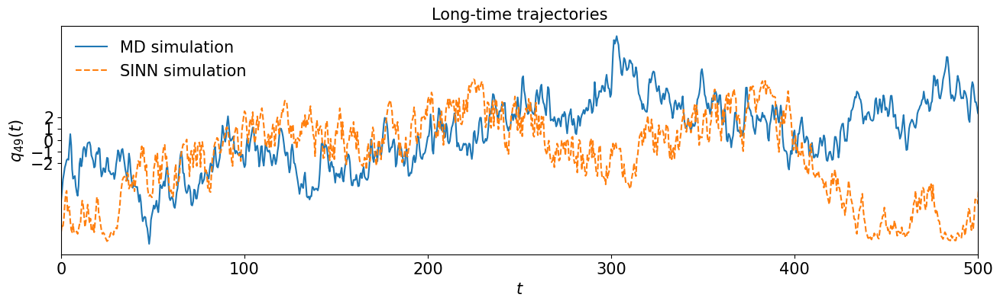

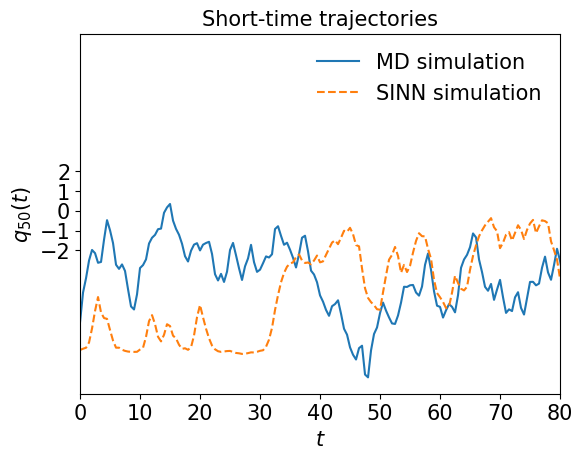

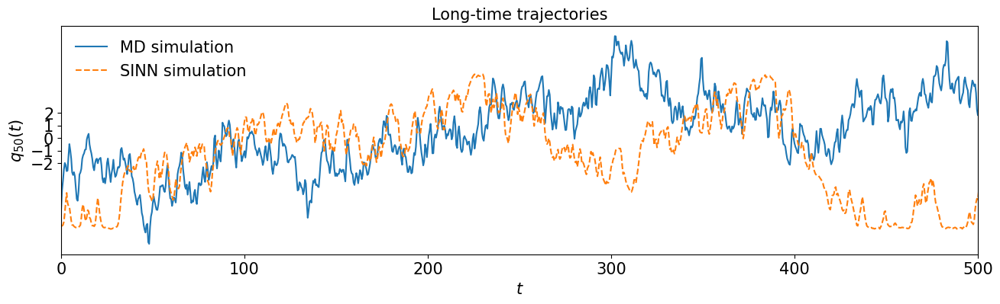

In [62]:
test5(model2)

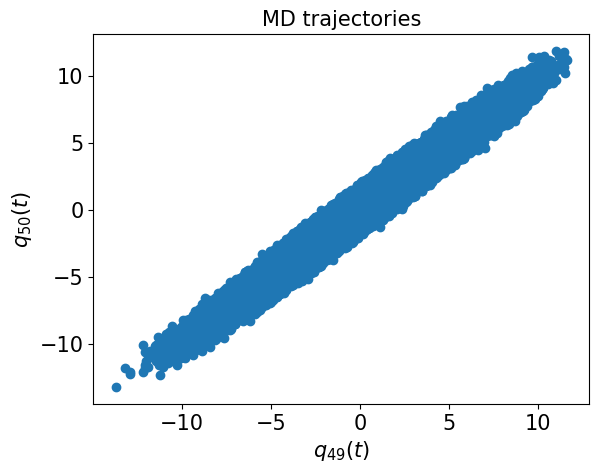

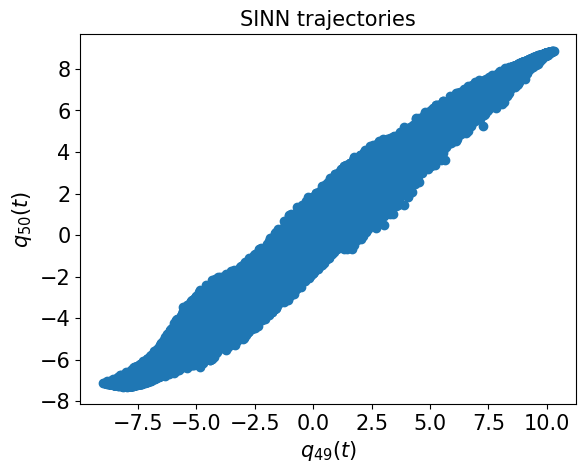

In [63]:
test6(model2)

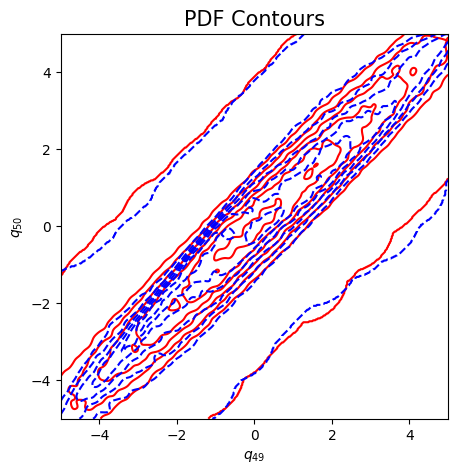

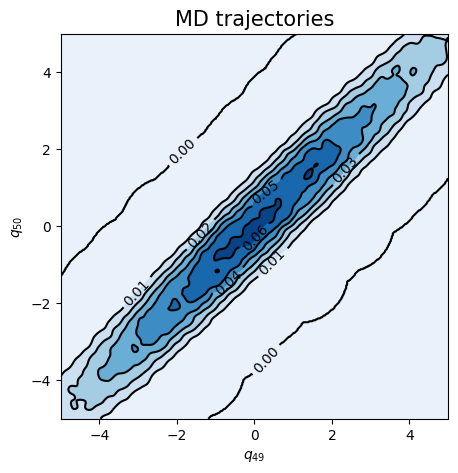

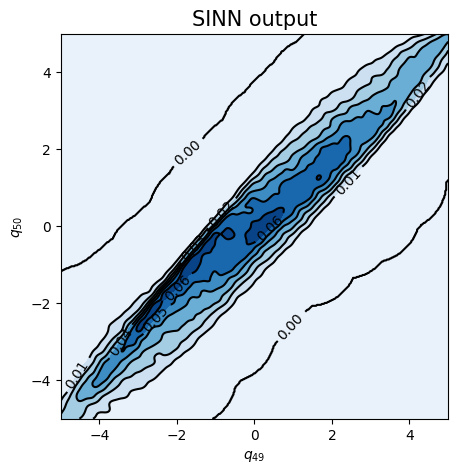

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8305, 0.8251, acf: 0.09924, ccf: 0.09988, pdf: 0.29318, pdf2: 0.28997, acf2: 0.04283
[50]-th step loss: 0.1159, 0.1052, acf: 0.01459, ccf: 0.01456, pdf: 0.04029, pdf2: 0.03322, acf2: 0.00255
[100]-th step loss: 0.0322, 0.0229, acf: 0.00239, ccf: 0.00239, pdf: 0.00868, pdf2: 0.00822, acf2: 0.00119
[150]-th step loss: 0.0114, 0.0127, acf: 0.00084, ccf: 0.00085, pdf: 0.00460, pdf2: 0.00429, acf2: 0.00210
[200]-th step loss: 0.0117, 0.0081, acf: 0.00051, ccf: 0.00052, pdf: 0.00323, pdf2: 0.00311, acf2: 0.00072
[250]-th step loss: 0.0309, 0.0168, acf: 0.00308, ccf: 0.00307, pdf: 0.00384, pdf2: 0.00332, acf2: 0.00351
[300]-th step loss: 0.0063, 0.0077, acf: 0.00026, ccf: 0.00027, pdf: 0.00294, pdf2: 0.00313, acf2: 0.00109
[350]-th step loss: 0.0527, 0.0595, acf: 0.01741, ccf: 0.01734, pdf: 0.00900, pdf2: 0.01153, acf2: 0.00424
[400]-th step loss: 0.0035, 0.0048, acf: 0.00051, ccf: 0.00052, pdf: 0.00104, pdf2: 0.00114, acf2: 0.00154
[450]-th step loss: 0.0548, 0.0525, acf:

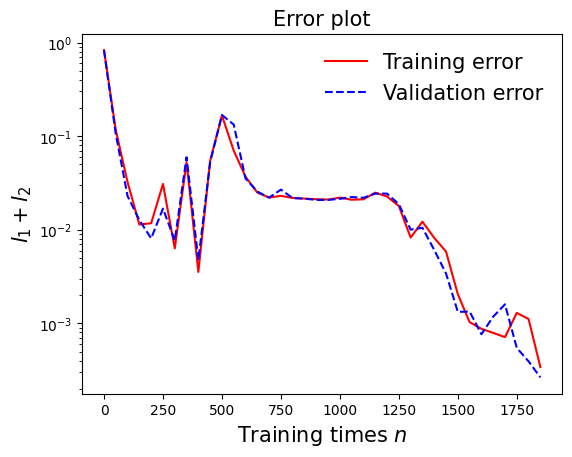

In [66]:
draw_loss(model3)

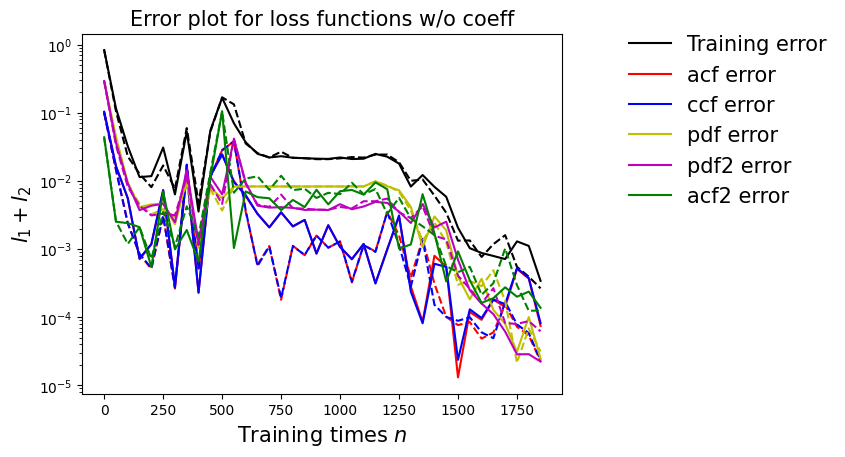

In [67]:
draw_errors(model3)

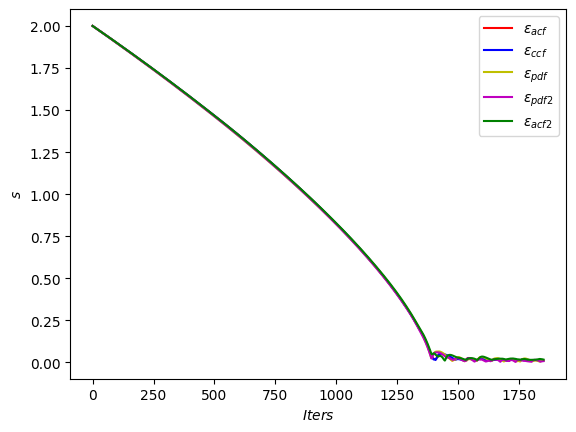

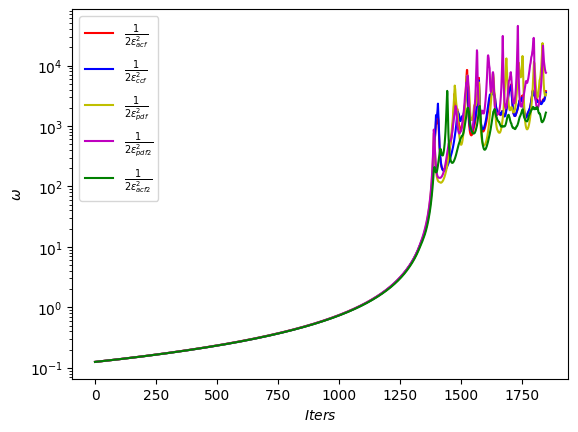

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

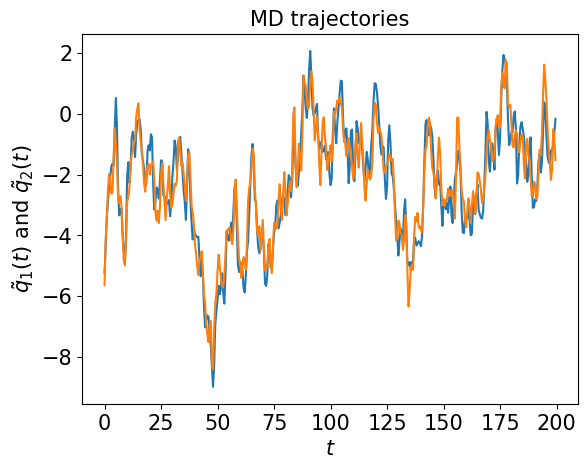

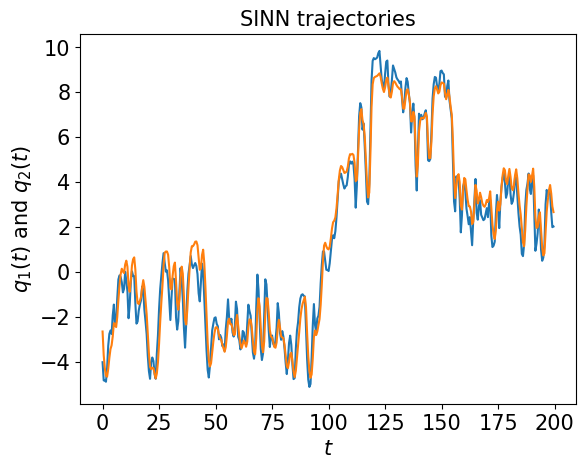

In [69]:
test1(model3)

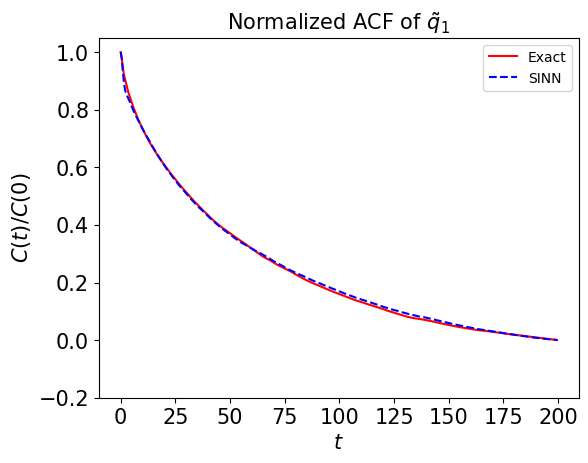

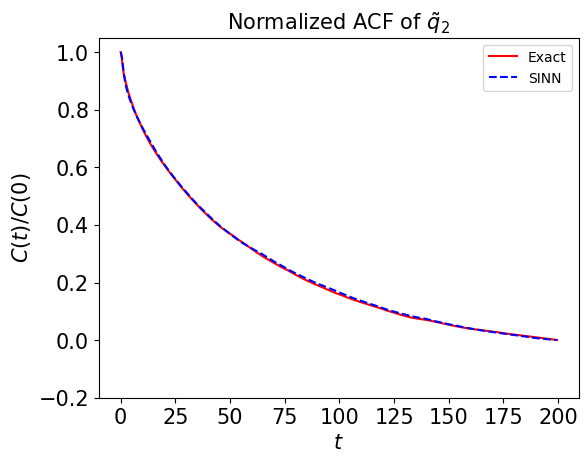

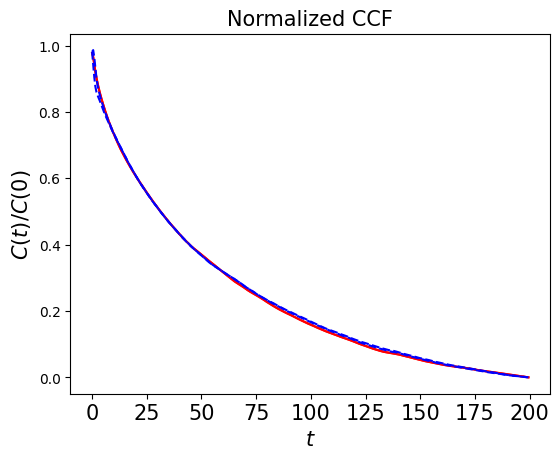

In [70]:
test2(model3)

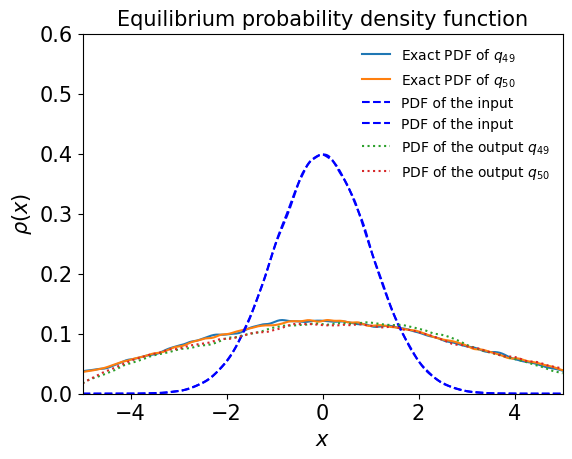

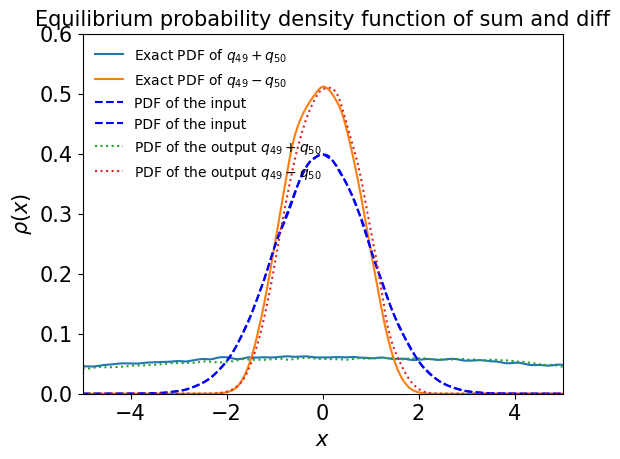

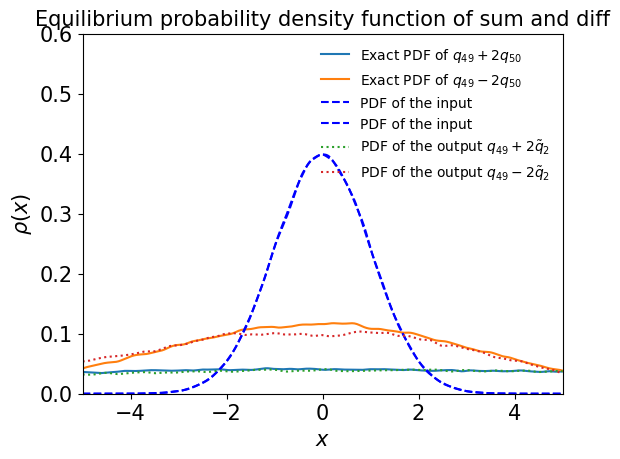

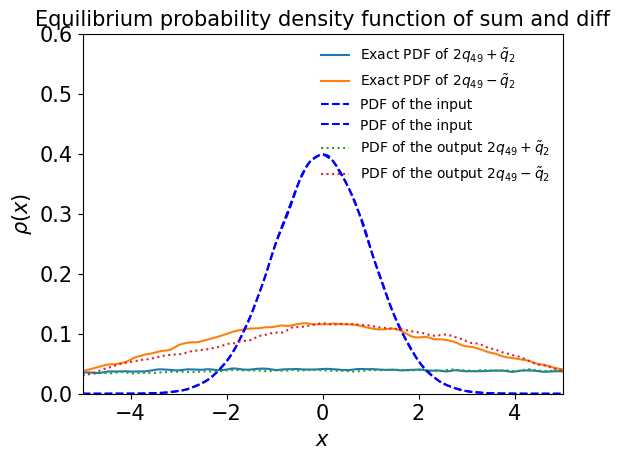

In [71]:
test3(model3)

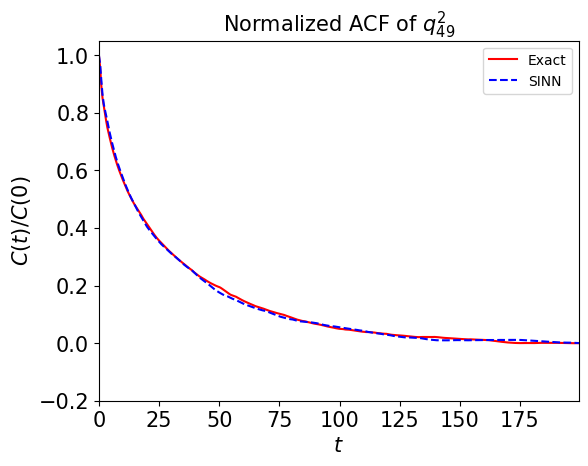

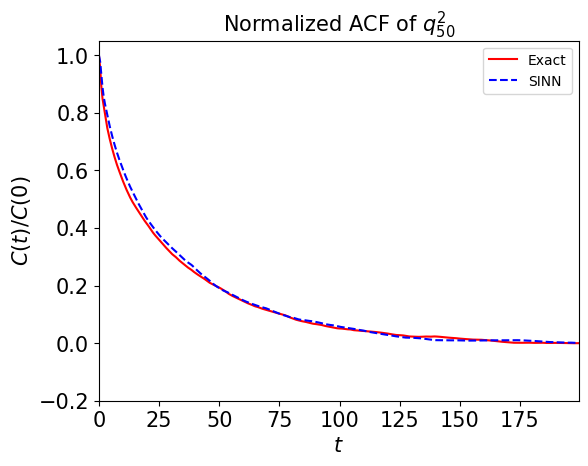

In [72]:
test4(model3)

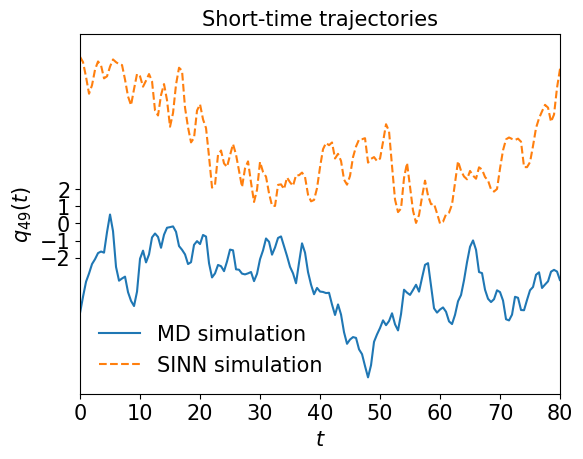

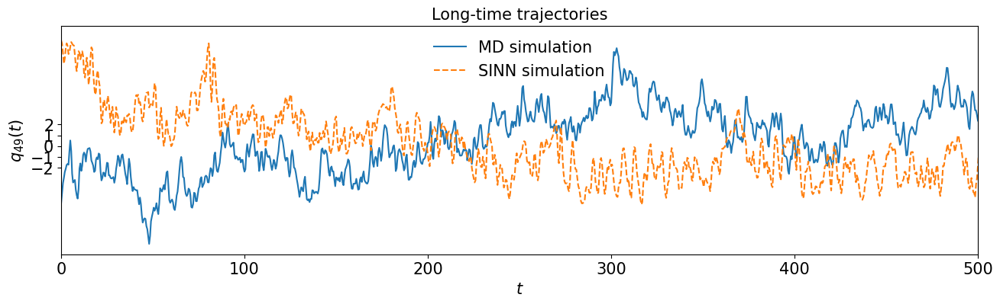

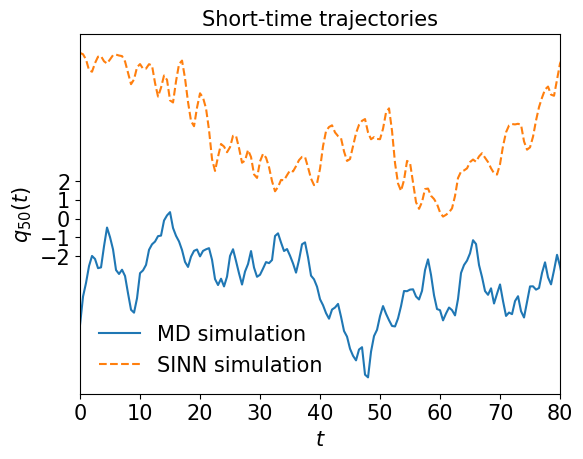

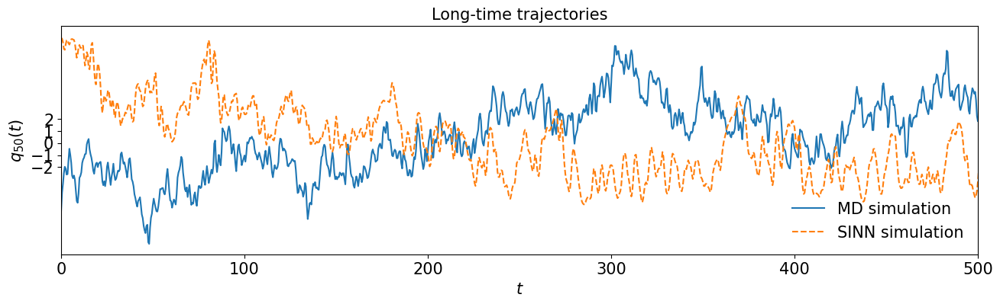

In [73]:
test5(model3)

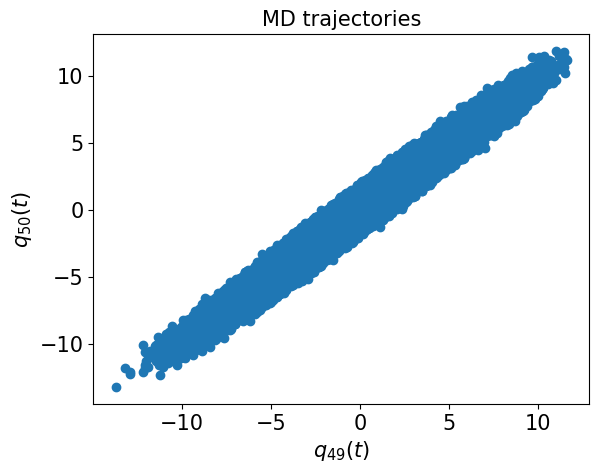

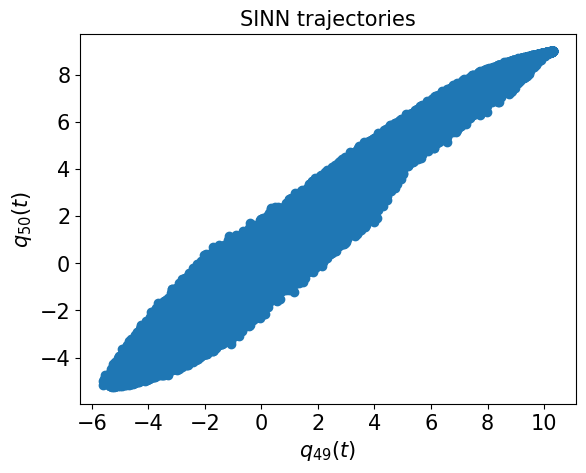

In [74]:
test6(model3)

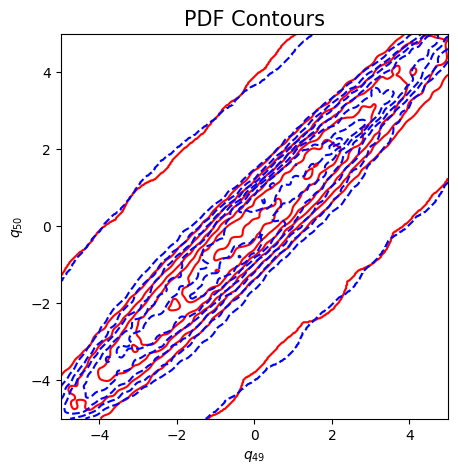

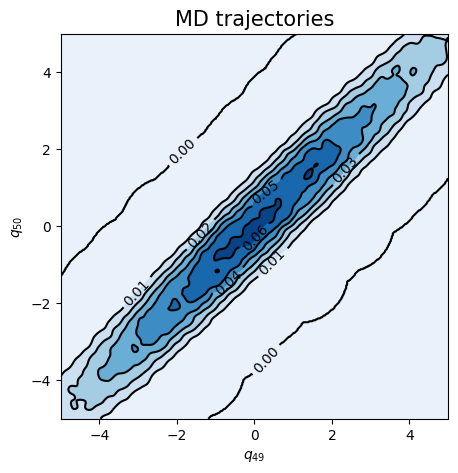

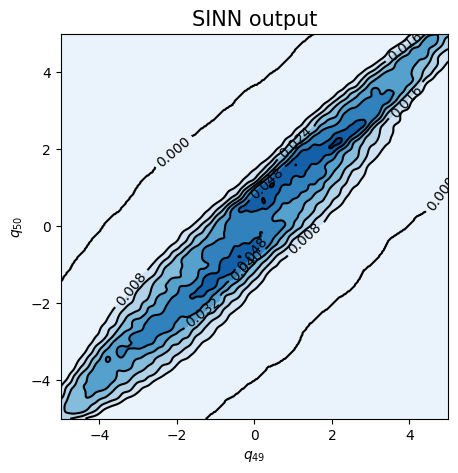

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8527, 0.8217, acf: 0.09803, ccf: 0.09884, pdf: 0.29318, pdf2: 0.28984, acf2: 0.04185
[50]-th step loss: 0.1575, 0.1307, acf: 0.02772, ccf: 0.02766, pdf: 0.03836, pdf2: 0.03304, acf2: 0.00388
[100]-th step loss: 0.0514, 0.0497, acf: 0.00351, ccf: 0.00355, pdf: 0.02574, pdf2: 0.01447, acf2: 0.00239
[150]-th step loss: 0.0350, 0.0326, acf: 0.00182, ccf: 0.00183, pdf: 0.00934, pdf2: 0.00789, acf2: 0.01175
[200]-th step loss: 0.0123, 0.0078, acf: 0.00106, ccf: 0.00107, pdf: 0.00255, pdf2: 0.00219, acf2: 0.00094
[250]-th step loss: 0.0092, 0.0086, acf: 0.00166, ccf: 0.00169, pdf: 0.00221, pdf2: 0.00210, acf2: 0.00096
[300]-th step loss: 0.0041, 0.0039, acf: 0.00056, ccf: 0.00058, pdf: 0.00084, pdf2: 0.00115, acf2: 0.00075
[350]-th step loss: 0.0388, 0.0511, acf: 0.01535, ccf: 0.01531, pdf: 0.00340, pdf2: 0.00441, acf2: 0.01269
[400]-th step loss: 0.0049, 0.0060, acf: 0.00107, ccf: 0.00109, pdf: 0.00162, pdf2: 0.00194, acf2: 0.00024
[450]-th step loss: 0.0038, 0.0029, acf:

[3850]-th step loss: 0.0227, 0.0213, acf: 0.00193, ccf: 0.00208, pdf: 0.00829, pdf2: 0.00368, acf2: 0.00527
[3900]-th step loss: 0.0222, 0.0214, acf: 0.00079, ccf: 0.00092, pdf: 0.00829, pdf2: 0.00369, acf2: 0.00775
[3950]-th step loss: 0.0377, 0.0277, acf: 0.00386, ccf: 0.00362, pdf: 0.00829, pdf2: 0.00640, acf2: 0.00552
[4000]-th step loss: 0.0243, 0.0235, acf: 0.00220, ccf: 0.00222, pdf: 0.00829, pdf2: 0.00421, acf2: 0.00659
[4050]-th step loss: 0.0219, 0.0221, acf: 0.00216, ccf: 0.00234, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00553
[4100]-th step loss: 0.0215, 0.0220, acf: 0.00260, ccf: 0.00278, pdf: 0.00829, pdf2: 0.00373, acf2: 0.00457
[4150]-th step loss: 0.0236, 0.0218, acf: 0.00237, ccf: 0.00251, pdf: 0.00829, pdf2: 0.00385, acf2: 0.00481
[4200]-th step loss: 0.0222, 0.0216, acf: 0.00097, ccf: 0.00109, pdf: 0.00829, pdf2: 0.00375, acf2: 0.00749
[4250]-th step loss: 0.0211, 0.0209, acf: 0.00156, ccf: 0.00167, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00564
[4300]-th step loss: 0.0211,

[7650]-th step loss: 0.0196, 0.0227, acf: 0.00550, ccf: 0.00551, pdf: 0.00150, pdf2: 0.00056, acf2: 0.00963
[7700]-th step loss: 0.0100, 0.0107, acf: 0.00397, ccf: 0.00395, pdf: 0.00093, pdf2: 0.00035, acf2: 0.00151
[7750]-th step loss: 0.0122, 0.0136, acf: 0.00433, ccf: 0.00432, pdf: 0.00081, pdf2: 0.00032, acf2: 0.00380
[7800]-th step loss: 0.0116, 0.0108, acf: 0.00454, ccf: 0.00452, pdf: 0.00057, pdf2: 0.00024, acf2: 0.00092
[7850]-th step loss: 0.0121, 0.0114, acf: 0.00507, ccf: 0.00507, pdf: 0.00039, pdf2: 0.00018, acf2: 0.00071
[7900]-th step loss: 0.0122, 0.0090, acf: 0.00345, ccf: 0.00347, pdf: 0.00038, pdf2: 0.00016, acf2: 0.00152
[7950]-th step loss: 0.0083, 0.0081, acf: 0.00347, ccf: 0.00346, pdf: 0.00015, pdf2: 0.00011, acf2: 0.00095
[8000]-th step loss: 0.0050, 0.0070, acf: 0.00245, ccf: 0.00247, pdf: 0.00011, pdf2: 0.00007, acf2: 0.00194
[8050]-th step loss: 0.0077, 0.0053, acf: 0.00145, ccf: 0.00146, pdf: 0.00017, pdf2: 0.00008, acf2: 0.00217
[8100]-th step loss: 0.0057,

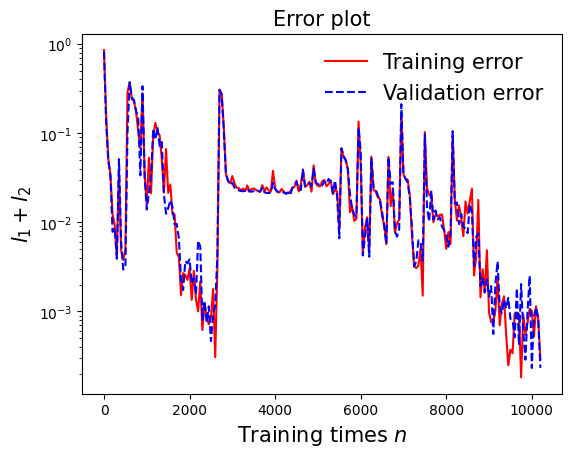

In [77]:
draw_loss(model4)

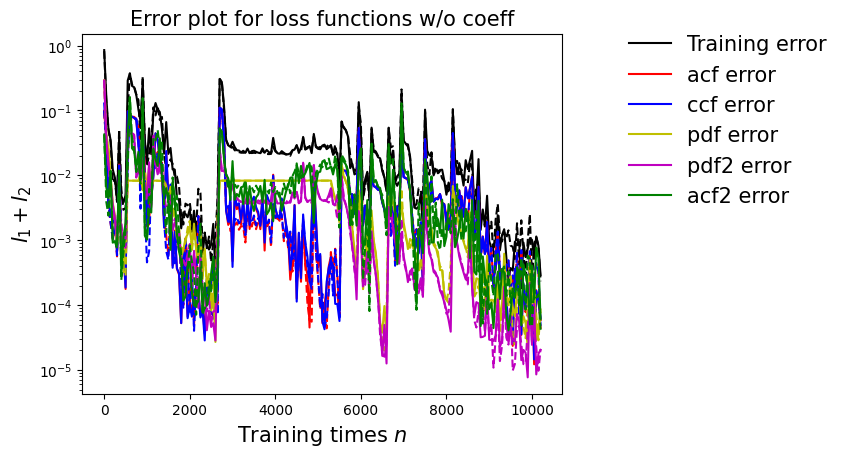

In [78]:
draw_errors(model4)

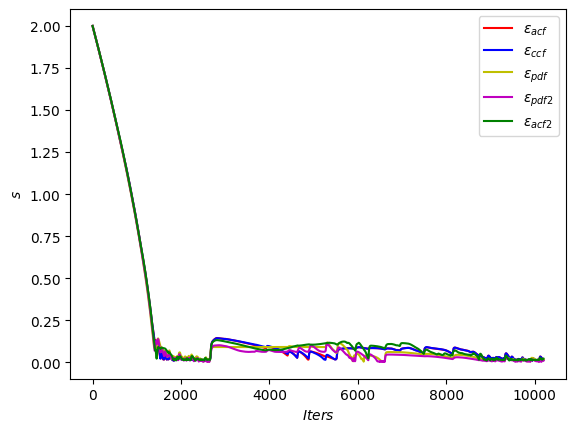

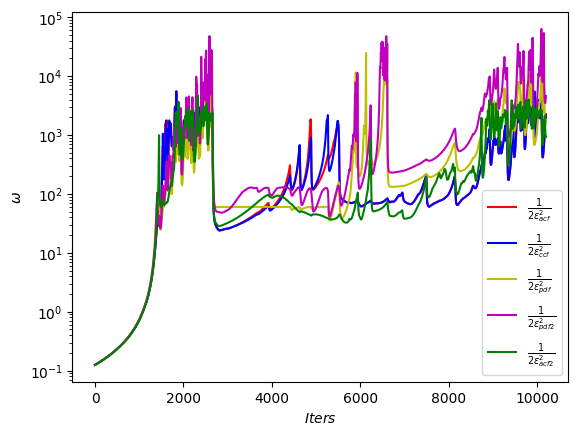

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

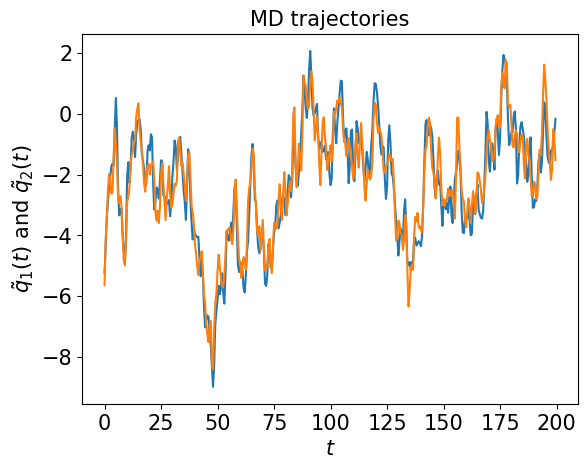

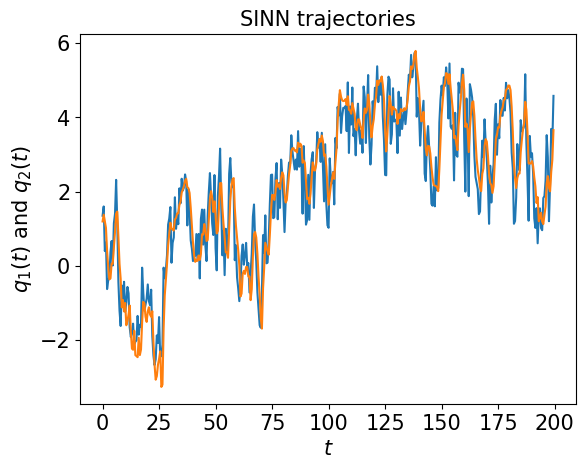

In [80]:
test1(model4)

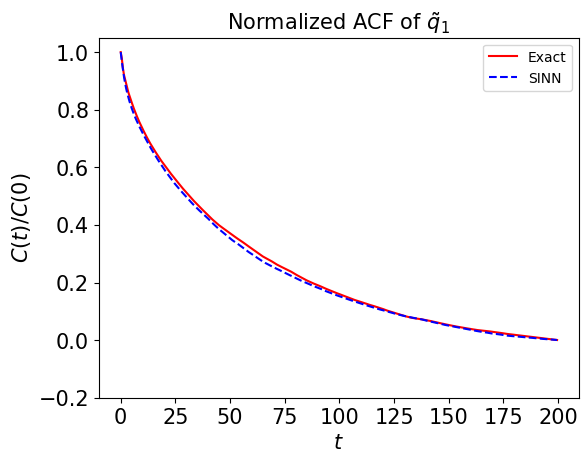

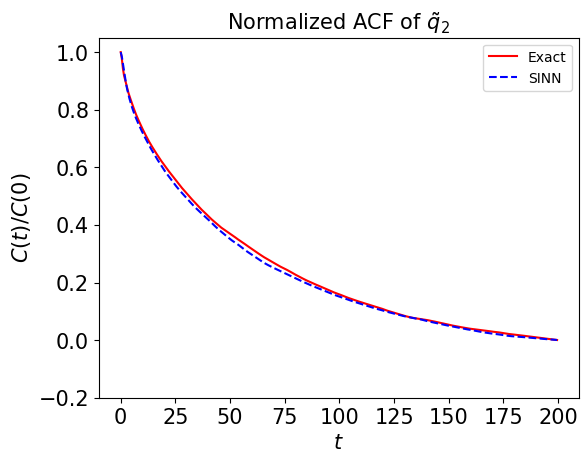

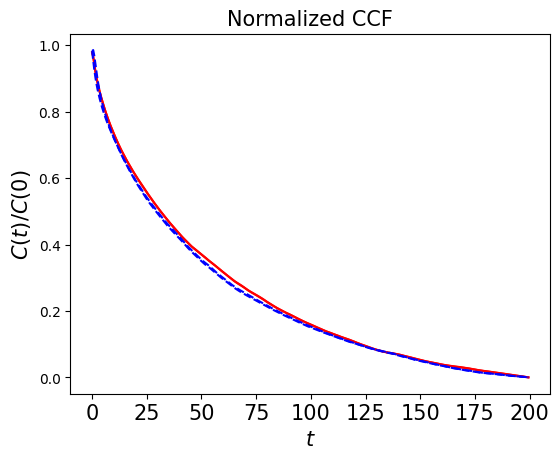

In [81]:
test2(model4)

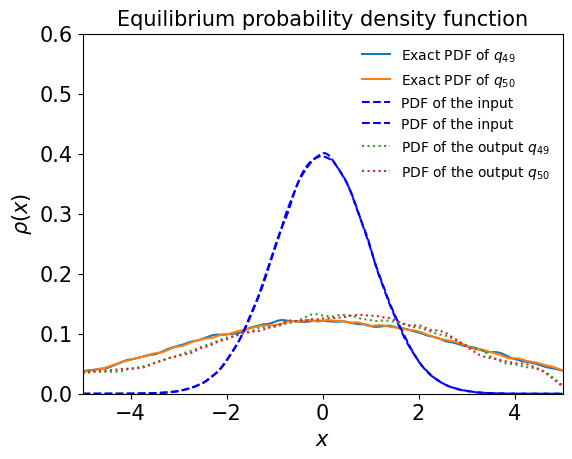

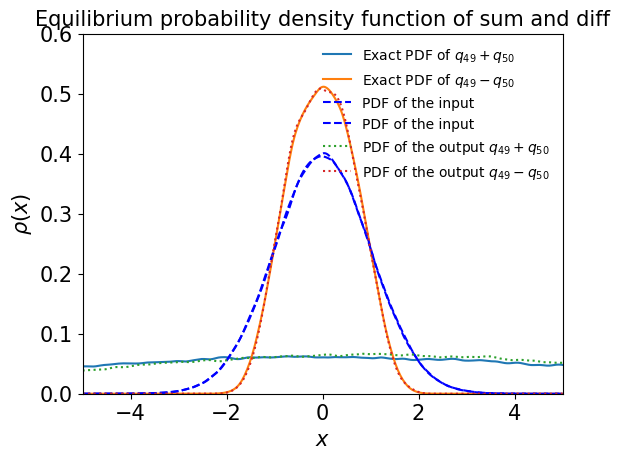

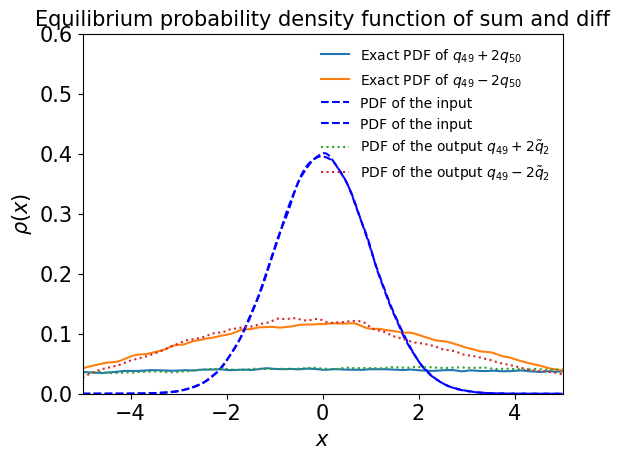

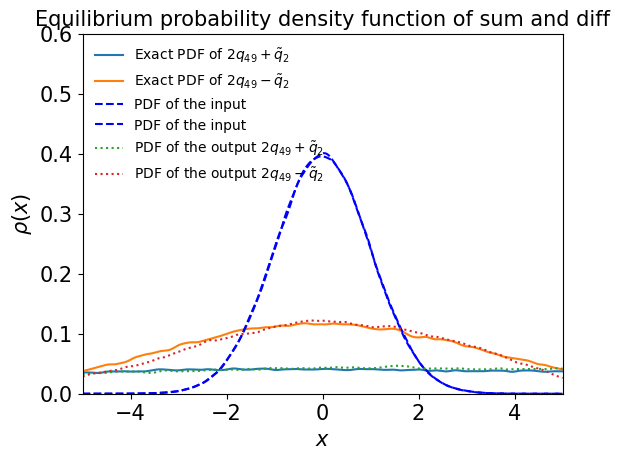

In [82]:
test3(model4)

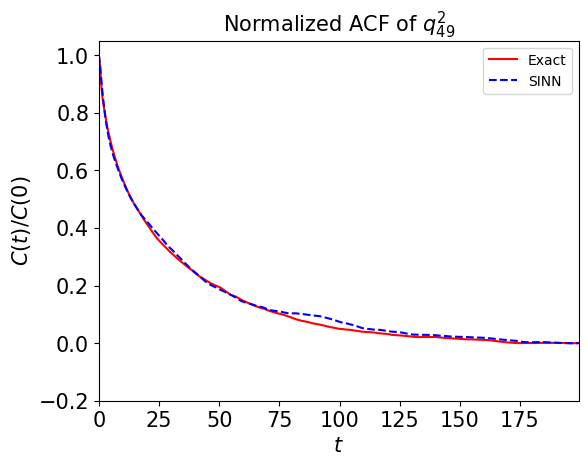

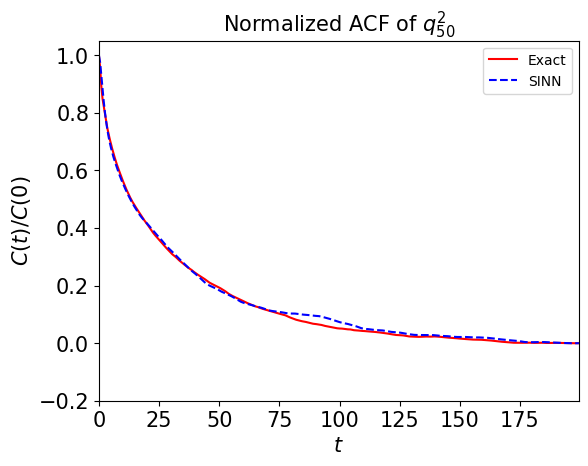

In [83]:
test4(model4)

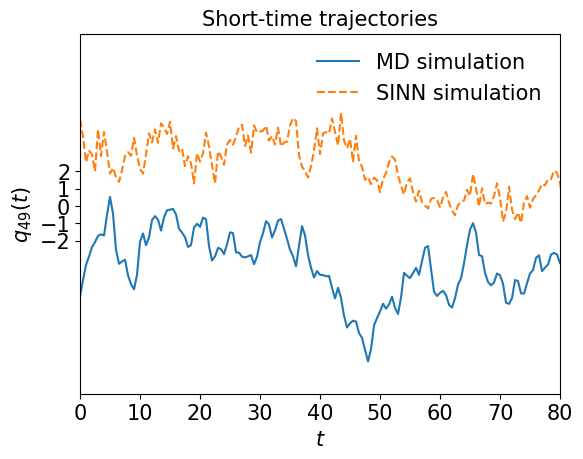

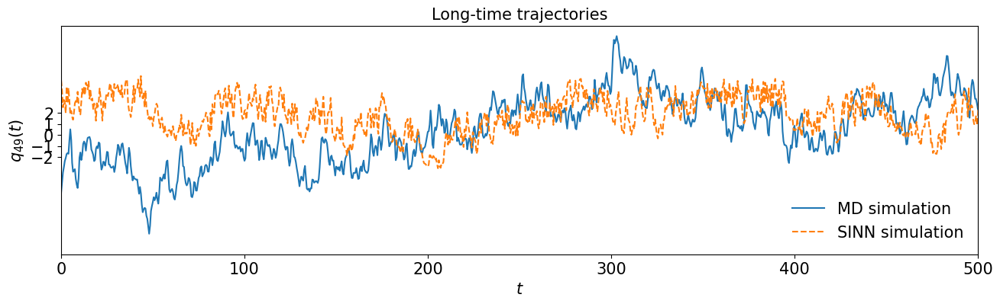

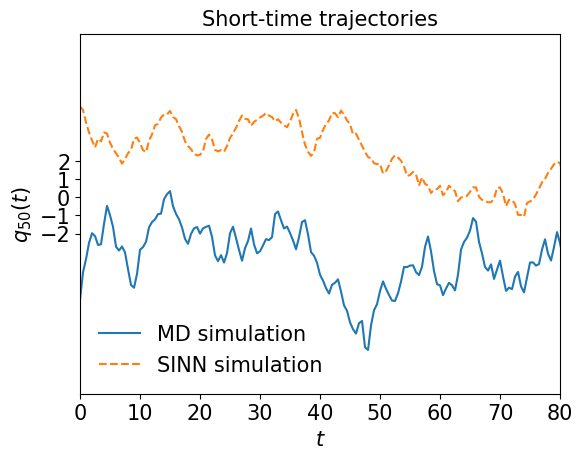

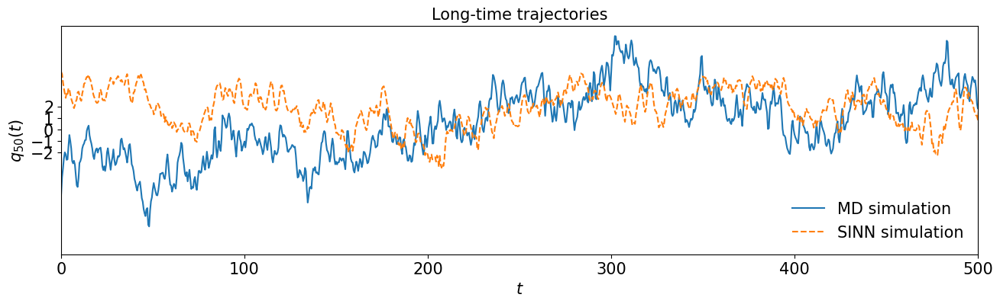

In [84]:
test5(model4)

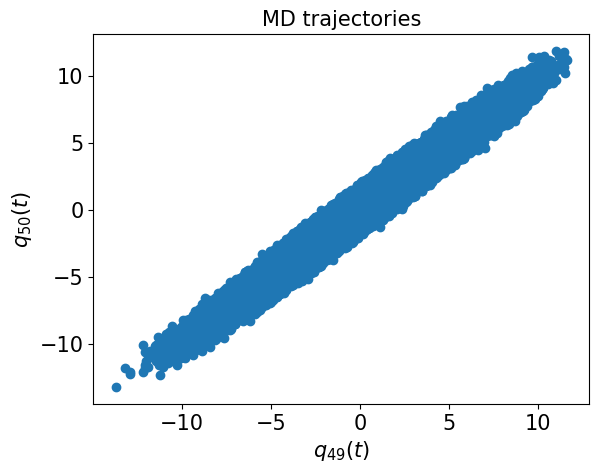

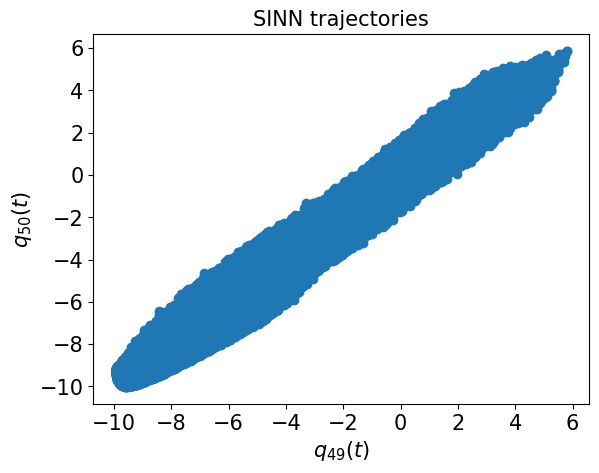

In [85]:
test6(model4)

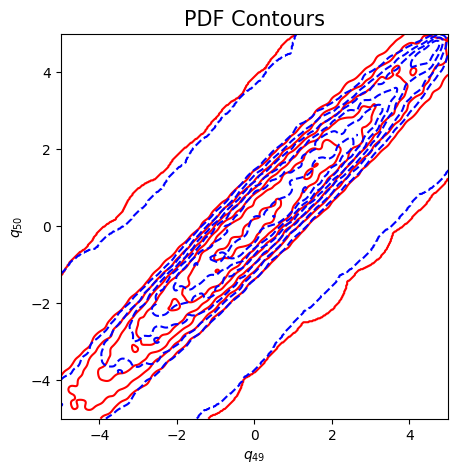

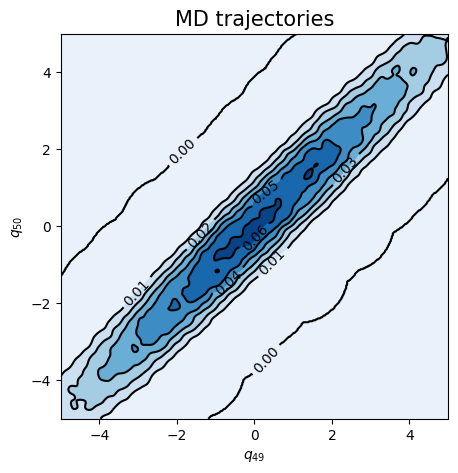

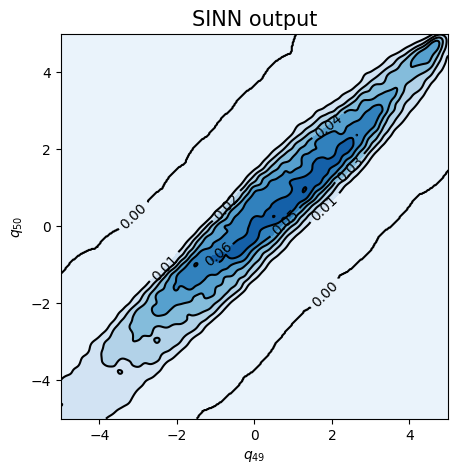

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8698, 0.8269, acf: 0.10056, ccf: 0.09962, pdf: 0.29314, pdf2: 0.28993, acf2: 0.04368
[50]-th step loss: 0.1311, 0.1292, acf: 0.01447, ccf: 0.01445, pdf: 0.05667, pdf2: 0.04077, acf2: 0.00283
[100]-th step loss: 0.0155, 0.0303, acf: 0.00435, ccf: 0.00439, pdf: 0.00952, pdf2: 0.00785, acf2: 0.00421
[150]-th step loss: 0.0130, 0.0254, acf: 0.00115, ccf: 0.00118, pdf: 0.01018, pdf2: 0.00870, acf2: 0.00423
[200]-th step loss: 0.1841, 0.2145, acf: 0.06658, ccf: 0.06645, pdf: 0.03210, pdf2: 0.02748, acf2: 0.02187
[250]-th step loss: 0.1691, 0.1722, acf: 0.06276, ccf: 0.06264, pdf: 0.01594, pdf2: 0.01314, acf2: 0.01776
[300]-th step loss: 0.0376, 0.0460, acf: 0.01338, ccf: 0.01334, pdf: 0.00846, pdf2: 0.00734, acf2: 0.00352
[350]-th step loss: 0.0294, 0.0183, acf: 0.00312, ccf: 0.00312, pdf: 0.00420, pdf2: 0.00351, acf2: 0.00435
[400]-th step loss: 0.0058, 0.0059, acf: 0.00028, ccf: 0.00029, pdf: 0.00180, pdf2: 0.00204, acf2: 0.00151
[450]-th step loss: 0.3032, 0.3054, acf:

[3850]-th step loss: 0.0310, 0.0300, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00646, acf2: 0.01518
[3900]-th step loss: 0.0264, 0.0265, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00445, acf2: 0.01366
[3950]-th step loss: 0.0331, 0.0311, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00588, acf2: 0.01673
[4000]-th step loss: 0.0270, 0.0240, acf: 0.00030, ccf: 0.00030, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01133
[4050]-th step loss: 0.0313, 0.0259, acf: 0.00006, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00391, acf2: 0.01353
[4100]-th step loss: 0.0254, 0.0274, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00498, acf2: 0.01400
[4150]-th step loss: 0.0293, 0.0319, acf: 0.00025, ccf: 0.00025, pdf: 0.00829, pdf2: 0.00438, acf2: 0.01875
[4200]-th step loss: 0.0332, 0.0300, acf: 0.00011, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00437, acf2: 0.01710
[4250]-th step loss: 0.0353, 0.0312, acf: 0.00012, ccf: 0.00012, pdf: 0.00828, pdf2: 0.00937, acf2: 0.01331
[4300]-th step loss: 0.0267,

[7650]-th step loss: 0.0277, 0.0251, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01298
[7700]-th step loss: 0.0303, 0.0273, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01513
[7750]-th step loss: 0.0336, 0.0273, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00375, acf2: 0.01518
[7800]-th step loss: 0.0280, 0.0255, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00390, acf2: 0.01320
[7850]-th step loss: 0.0285, 0.0258, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00430, acf2: 0.01296
[7900]-th step loss: 0.0295, 0.0269, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00403, acf2: 0.01453
[7950]-th step loss: 0.0228, 0.0246, acf: 0.00014, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00374, acf2: 0.01230
[8000]-th step loss: 0.0311, 0.0251, acf: 0.00018, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00397, acf2: 0.01246
[8050]-th step loss: 0.0287, 0.0266, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00368, acf2: 0.01459
[8100]-th step loss: 0.0318,

[11450]-th step loss: 0.0269, 0.0258, acf: 0.00004, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01360
[11500]-th step loss: 0.0267, 0.0272, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00363, acf2: 0.01520
[11550]-th step loss: 0.0337, 0.0281, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00392, acf2: 0.01572
[11600]-th step loss: 0.0317, 0.0264, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00409, acf2: 0.01394
[11650]-th step loss: 0.0300, 0.0256, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00433, acf2: 0.01284
[11700]-th step loss: 0.0254, 0.0252, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01303
[11750]-th step loss: 0.0256, 0.0260, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00413, acf2: 0.01346
[11800]-th step loss: 0.0270, 0.0251, acf: 0.00023, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00439, acf2: 0.01193
[11850]-th step loss: 0.0301, 0.0273, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00386, acf2: 0.01508
[11900]-th step los

[15250]-th step loss: 0.0345, 0.0323, acf: 0.00001, ccf: 0.00001, pdf: 0.00831, pdf2: 0.00987, acf2: 0.01414
[15300]-th step loss: 0.0286, 0.0261, acf: 0.00001, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00365, acf2: 0.01413
[15350]-th step loss: 0.0285, 0.0273, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01529
[15400]-th step loss: 0.0311, 0.0284, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01625
[15450]-th step loss: 0.0299, 0.0286, acf: 0.00002, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00509, acf2: 0.01516
[15500]-th step loss: 0.0310, 0.0268, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00446, acf2: 0.01395
[15550]-th step loss: 0.0300, 0.0270, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00395, acf2: 0.01471
[15600]-th step loss: 0.0275, 0.0284, acf: 0.00001, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00463, acf2: 0.01543
[15650]-th step loss: 0.0266, 0.0257, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01372
[15700]-th step los

[19050]-th step loss: 0.0253, 0.0279, acf: 0.00002, ccf: 0.00003, pdf: 0.00824, pdf2: 0.00364, acf2: 0.01595
[19100]-th step loss: 0.0306, 0.0260, acf: 0.00003, ccf: 0.00003, pdf: 0.00825, pdf2: 0.00368, acf2: 0.01407
[19150]-th step loss: 0.0330, 0.0261, acf: 0.00002, ccf: 0.00003, pdf: 0.00824, pdf2: 0.00364, acf2: 0.01421
[19200]-th step loss: 0.0297, 0.0258, acf: 0.00017, ccf: 0.00016, pdf: 0.00828, pdf2: 0.00489, acf2: 0.01234
[19250]-th step loss: 0.0270, 0.0263, acf: 0.00002, ccf: 0.00002, pdf: 0.00826, pdf2: 0.00380, acf2: 0.01423
[19300]-th step loss: 0.0238, 0.0259, acf: 0.00003, ccf: 0.00003, pdf: 0.00825, pdf2: 0.00365, acf2: 0.01393
[19350]-th step loss: 0.0276, 0.0264, acf: 0.00003, ccf: 0.00003, pdf: 0.00827, pdf2: 0.00418, acf2: 0.01389
[19400]-th step loss: 0.0299, 0.0284, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00572, acf2: 0.01435
[19450]-th step loss: 0.0243, 0.0247, acf: 0.00008, ccf: 0.00008, pdf: 0.00826, pdf2: 0.00368, acf2: 0.01262
[19500]-th step los

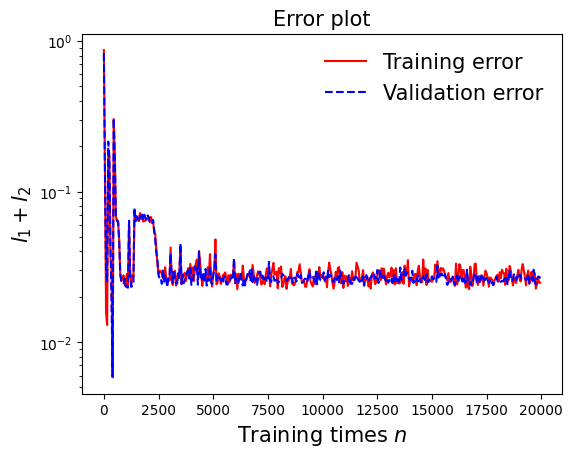

In [88]:
draw_loss(model5)

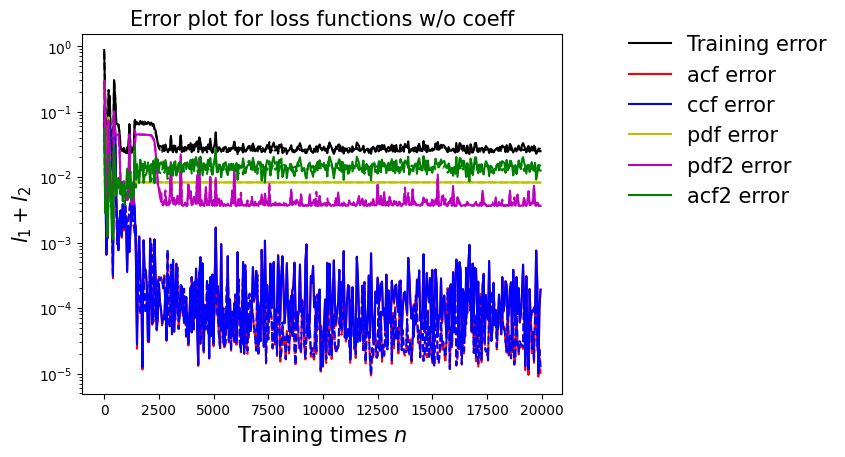

In [89]:
draw_errors(model5)

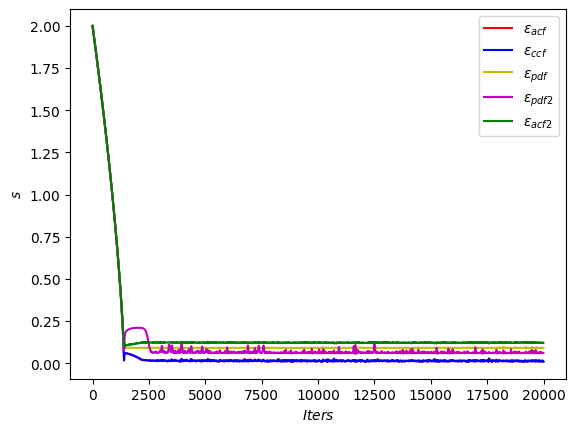

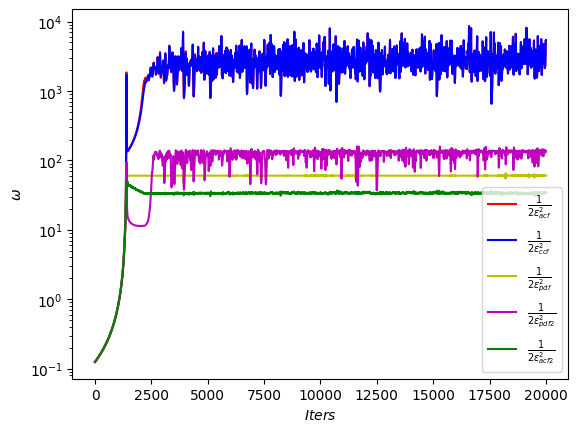

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

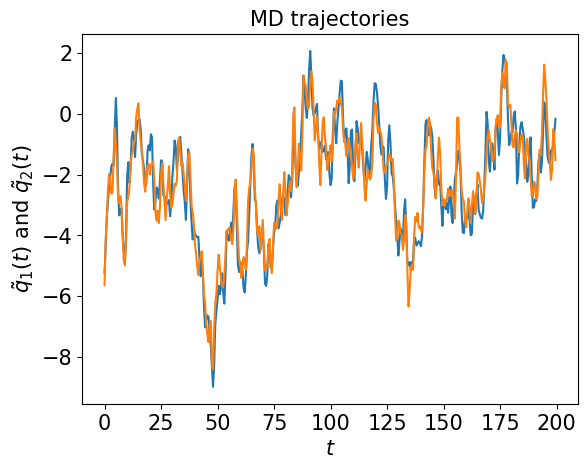

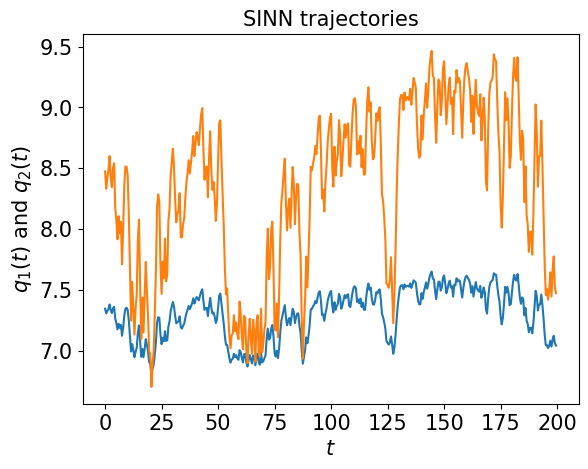

In [91]:
test1(model5)

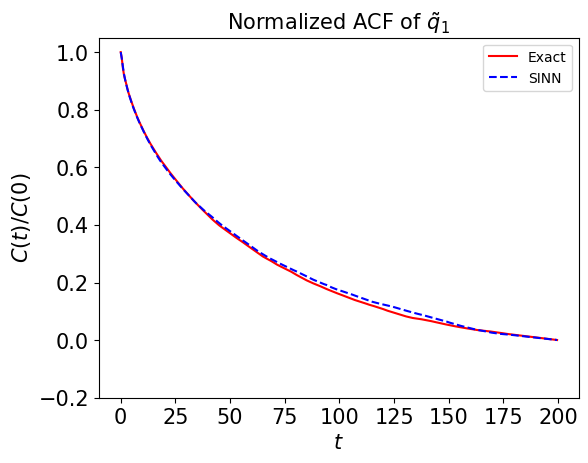

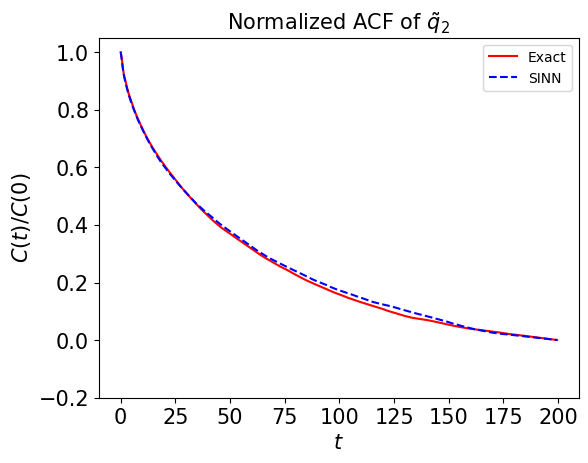

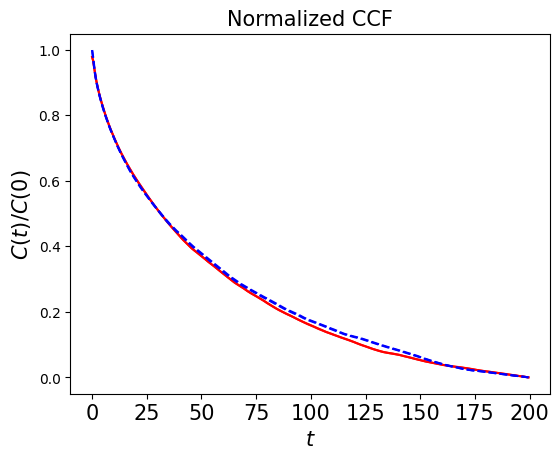

In [92]:
test2(model5)

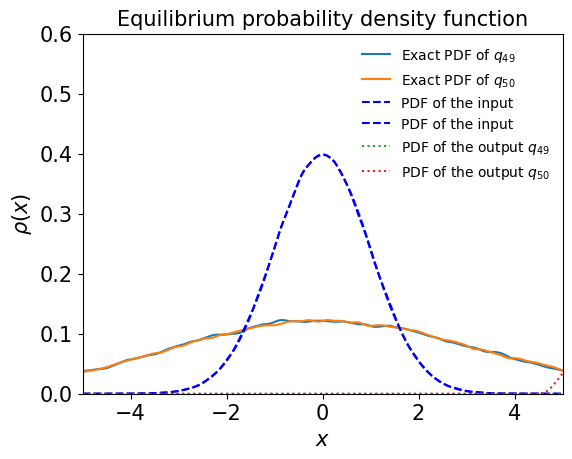

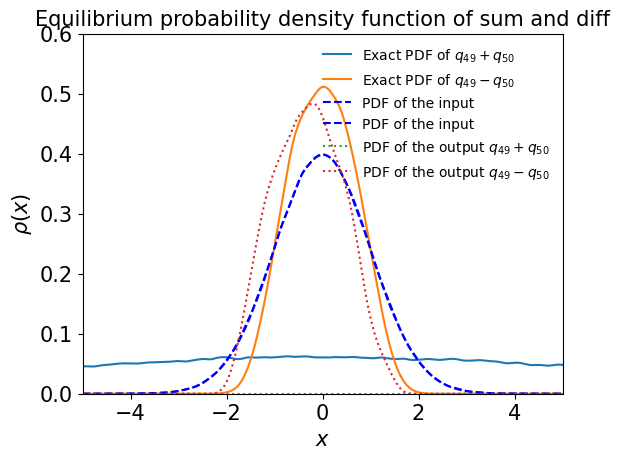

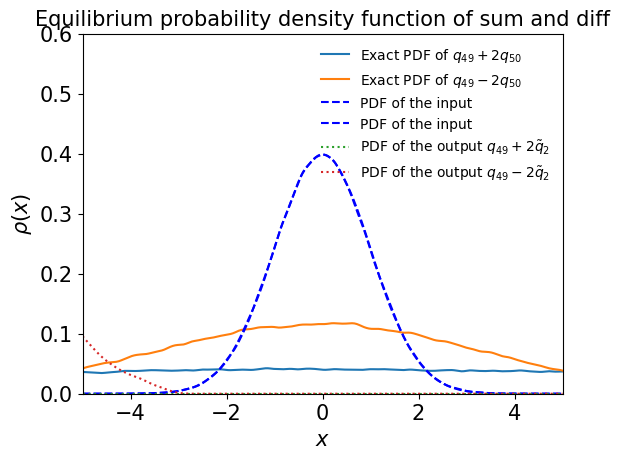

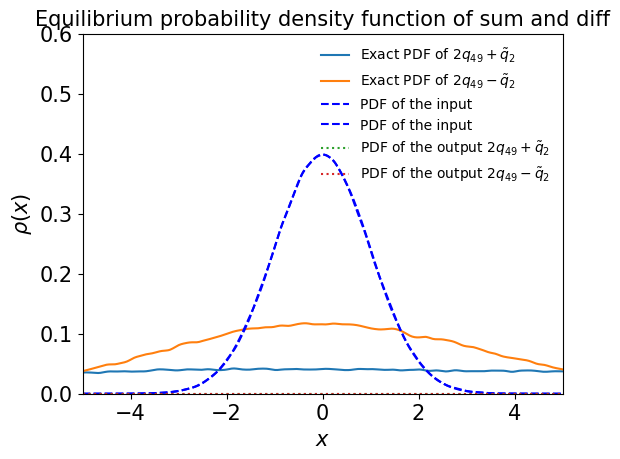

In [93]:
test3(model5)

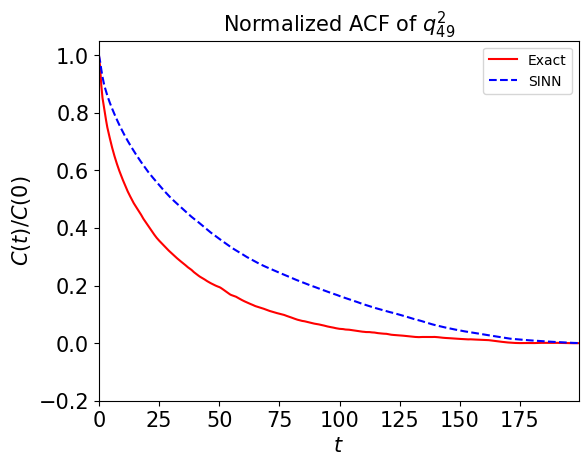

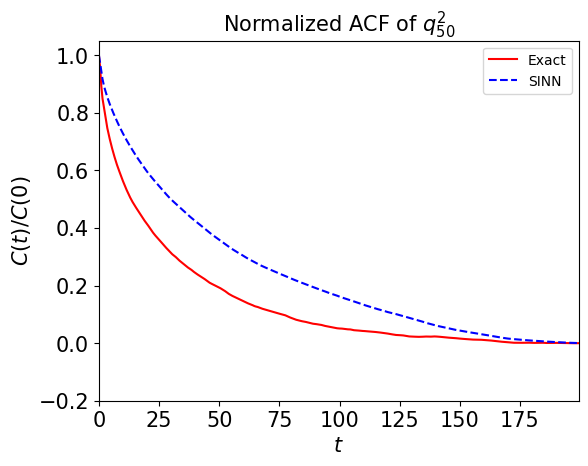

In [94]:
test4(model5)

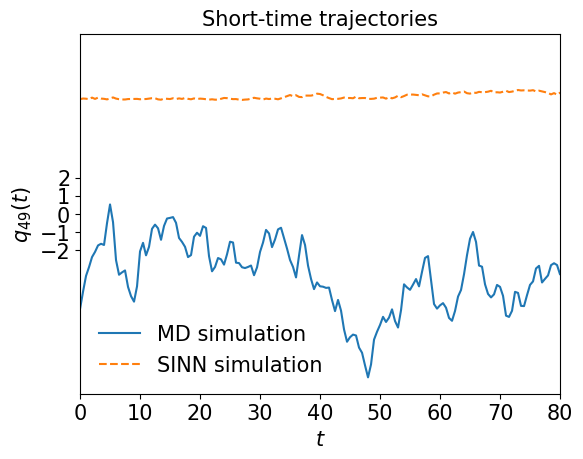

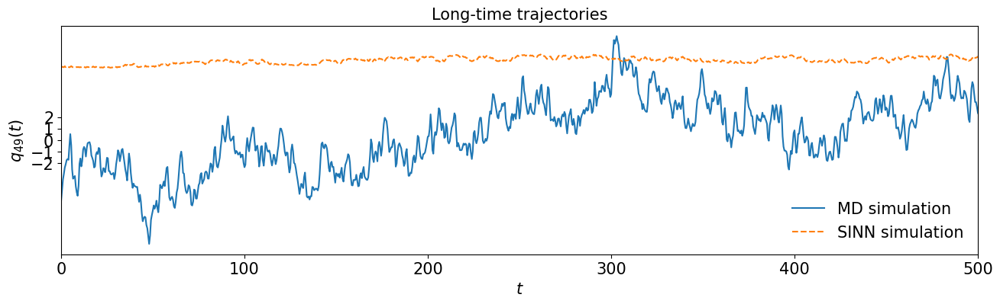

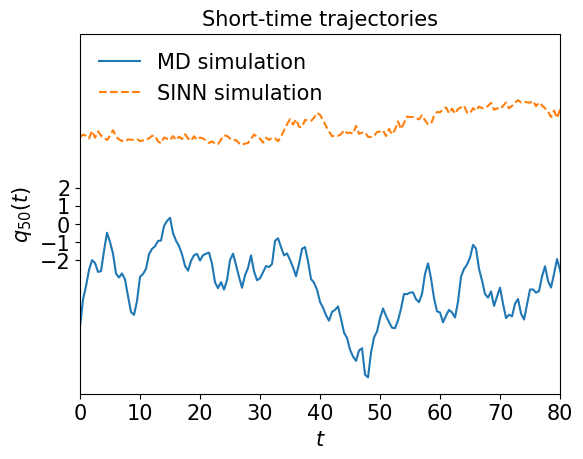

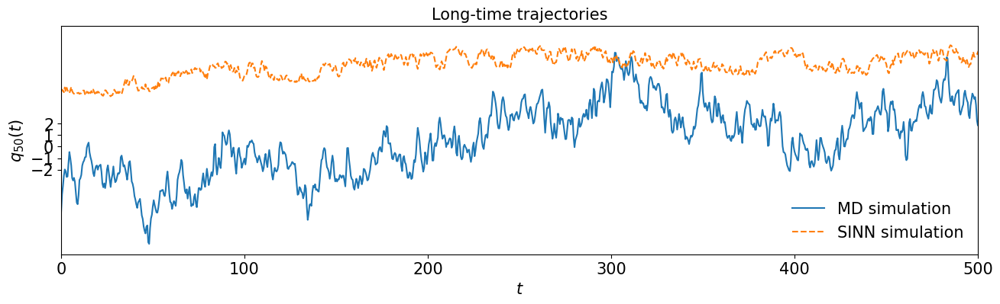

In [95]:
test5(model5)

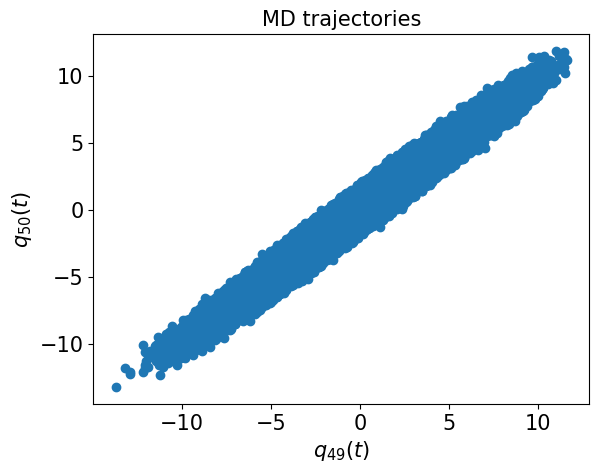

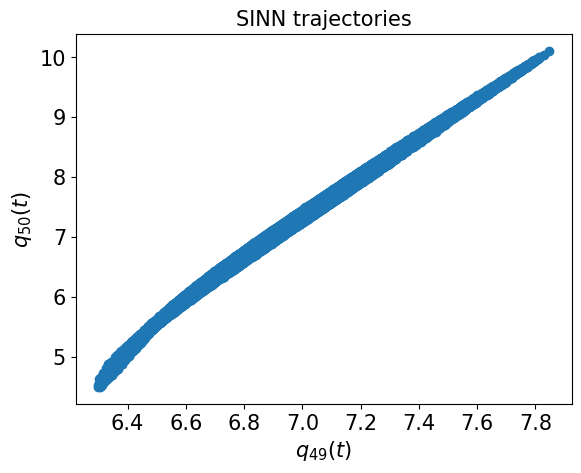

In [96]:
test6(model5)

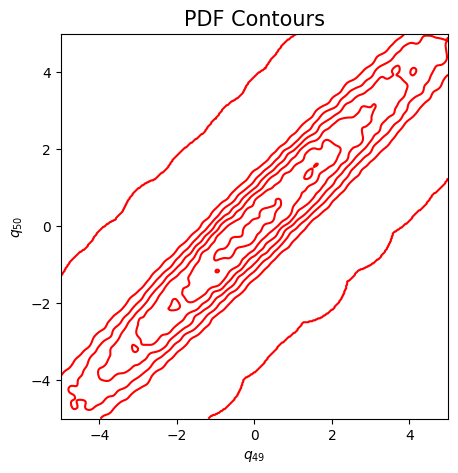

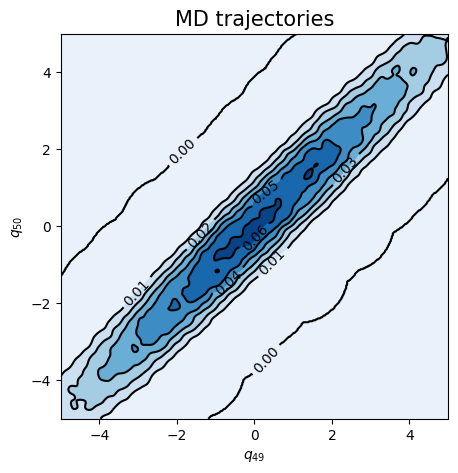

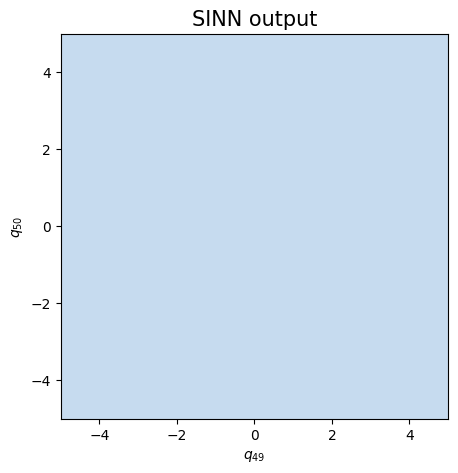

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8602, 0.8287, acf: 0.10046, ccf: 0.10126, pdf: 0.29316, pdf2: 0.28991, acf2: 0.04386
[50]-th step loss: 0.1132, 0.0988, acf: 0.00567, ccf: 0.00567, pdf: 0.04680, pdf2: 0.03498, acf2: 0.00565
[100]-th step loss: 0.0689, 0.0670, acf: 0.00545, ccf: 0.00545, pdf: 0.02694, pdf2: 0.02495, acf2: 0.00418
[150]-th step loss: 0.0292, 0.0679, acf: 0.02472, ccf: 0.02478, pdf: 0.00797, pdf2: 0.00735, acf2: 0.00306
[200]-th step loss: 0.0105, 0.0123, acf: 0.00146, ccf: 0.00148, pdf: 0.00345, pdf2: 0.00406, acf2: 0.00189
[250]-th step loss: 0.0076, 0.0074, acf: 0.00112, ccf: 0.00113, pdf: 0.00125, pdf2: 0.00183, acf2: 0.00209
[300]-th step loss: 0.0054, 0.0043, acf: 0.00051, ccf: 0.00053, pdf: 0.00076, pdf2: 0.00106, acf2: 0.00145
[350]-th step loss: 0.0759, 0.0492, acf: 0.00157, ccf: 0.00155, pdf: 0.00953, pdf2: 0.03361, acf2: 0.00298
[400]-th step loss: 0.0249, 0.0171, acf: 0.00103, ccf: 0.00087, pdf: 0.00654, pdf2: 0.00428, acf2: 0.00441
[450]-th step loss: 0.0188, 0.0174, acf:

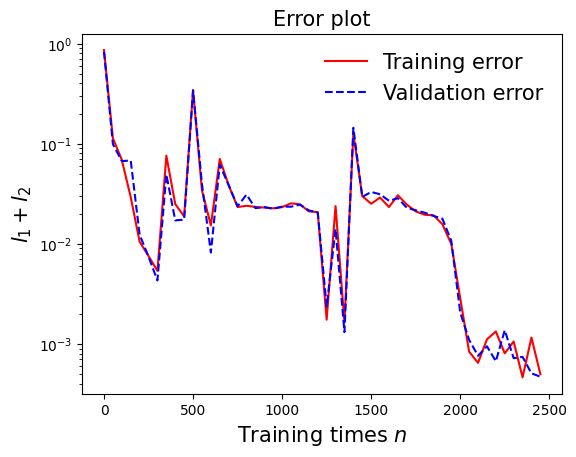

In [99]:
draw_loss(model6)

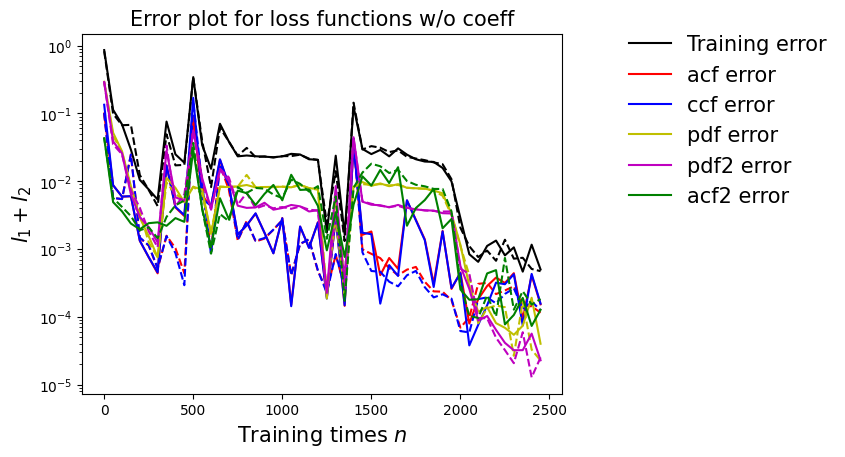

In [100]:
draw_errors(model6)

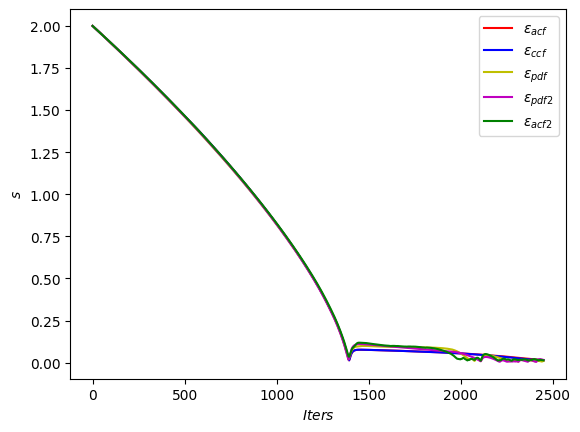

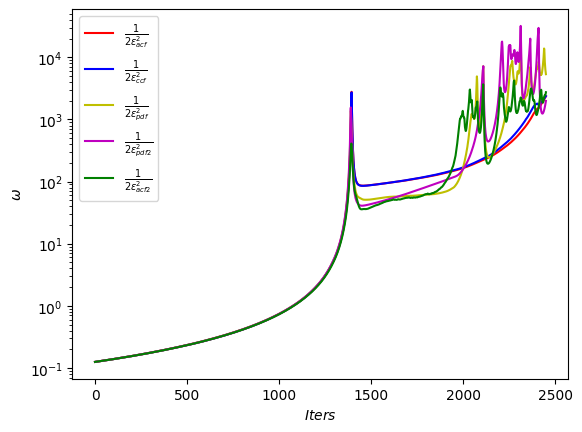

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

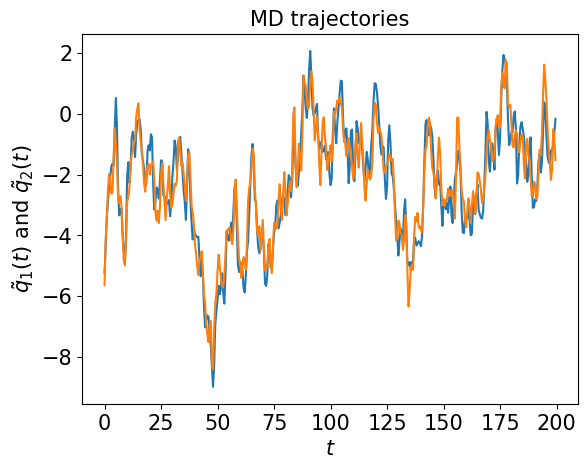

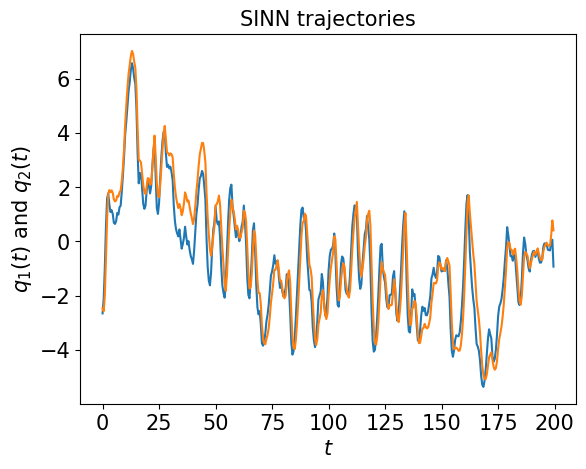

In [102]:
test1(model6)

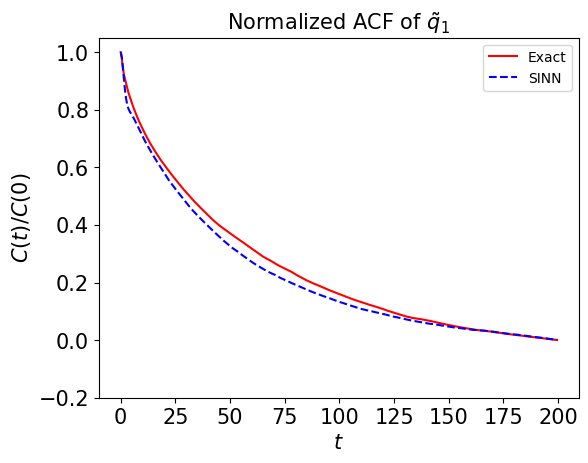

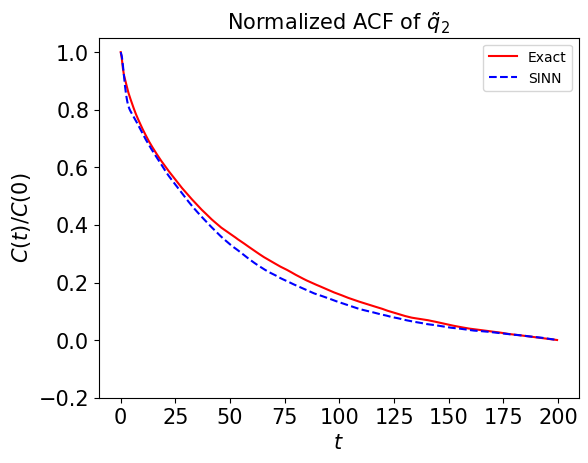

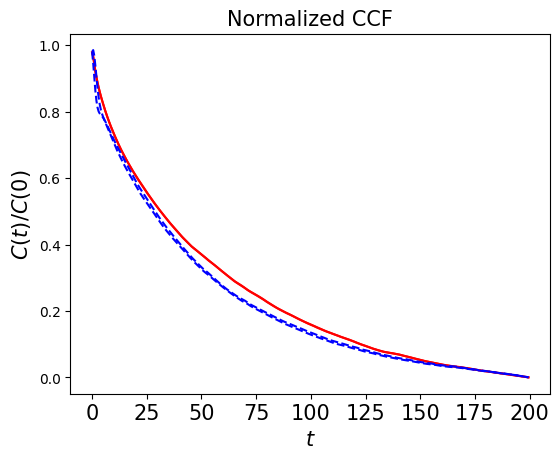

In [103]:
test2(model6)

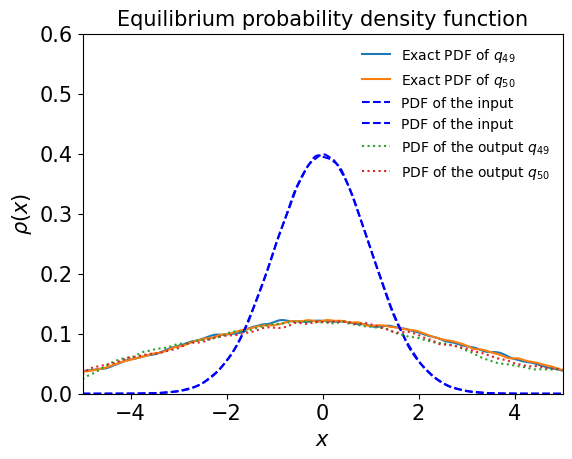

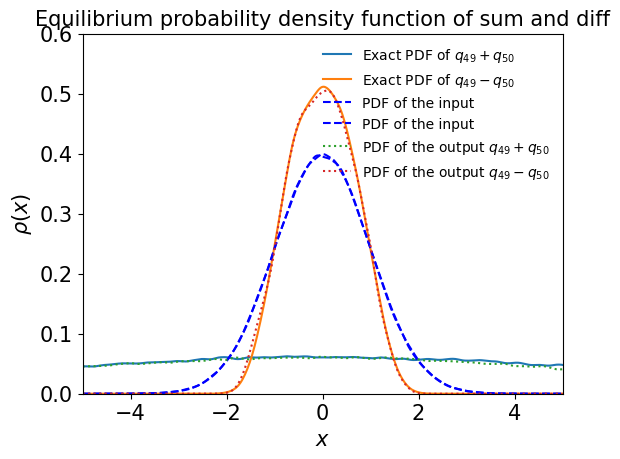

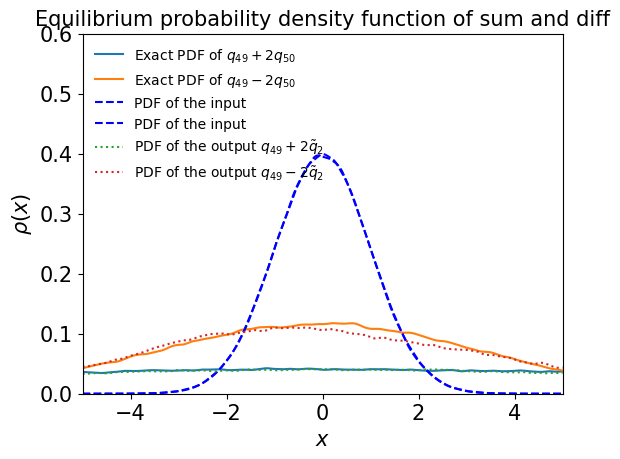

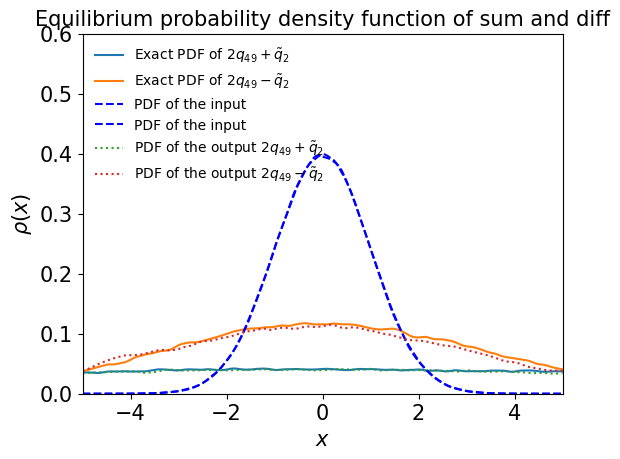

In [104]:
test3(model6)

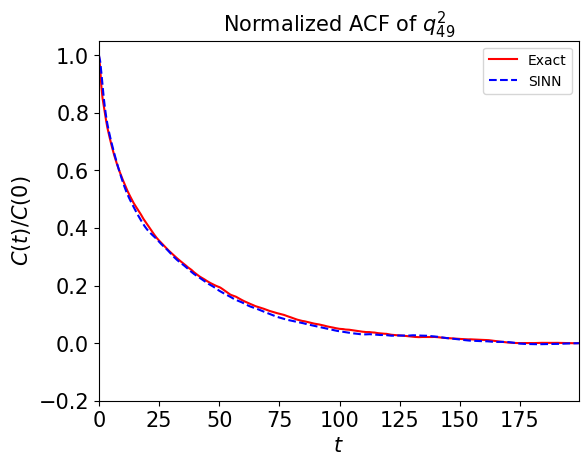

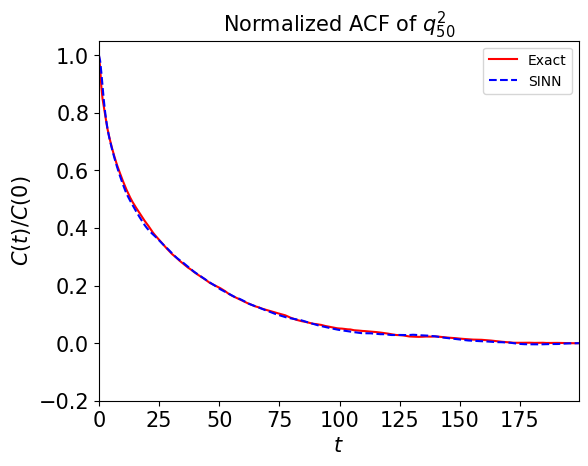

In [105]:
test4(model6)

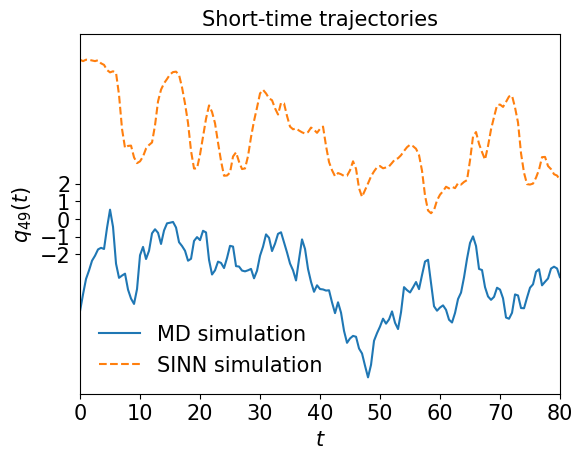

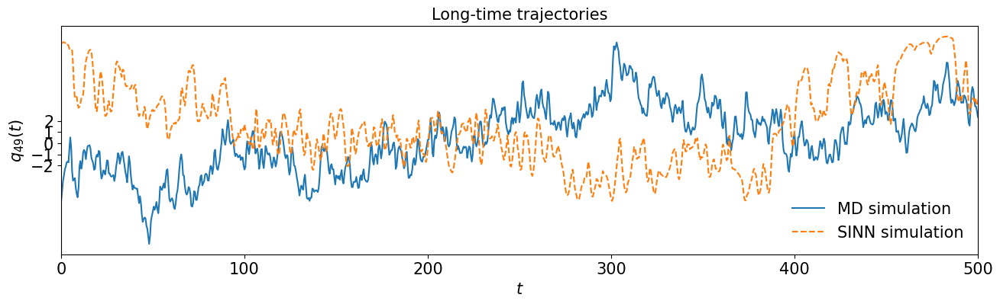

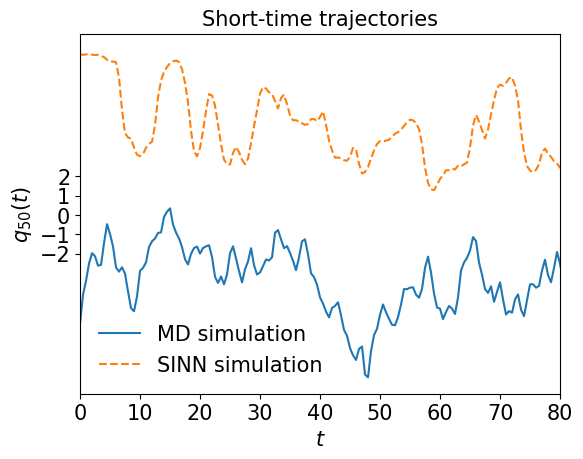

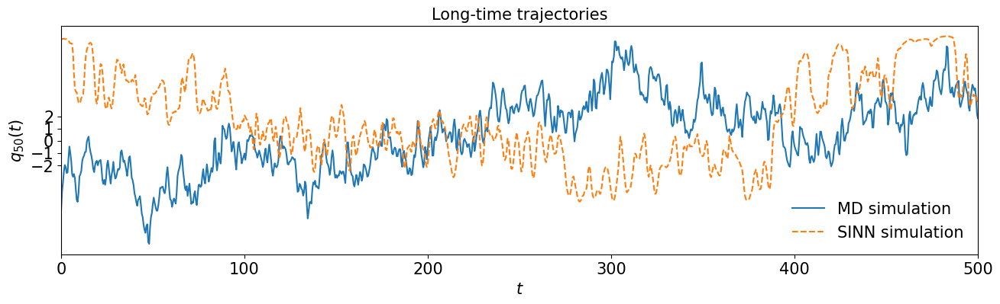

In [106]:
test5(model6)

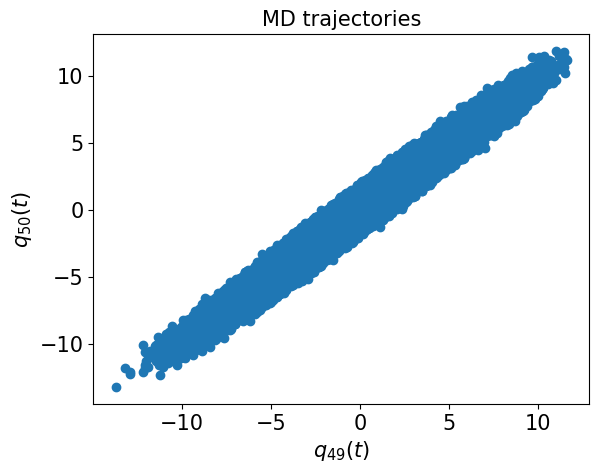

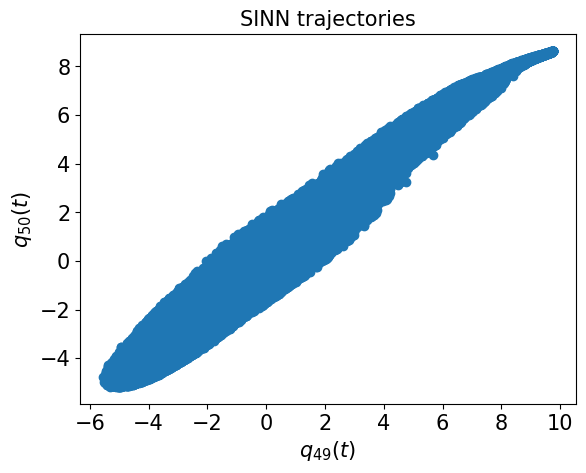

In [107]:
test6(model6)

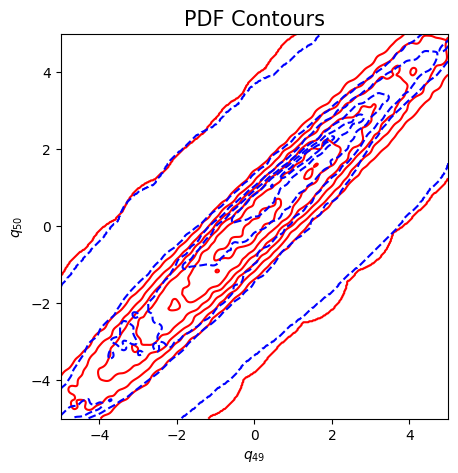

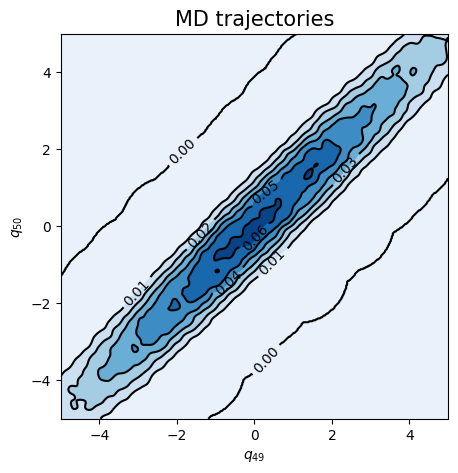

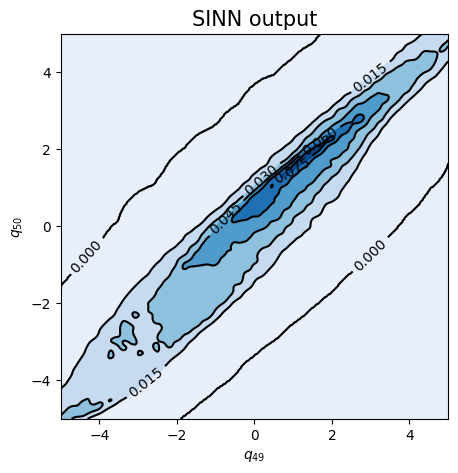

In [108]:
test7(model6)

In [109]:
### Defining SINN model
net7 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8281, 0.8238, acf: 0.09761, ccf: 0.10148, pdf: 0.29311, pdf2: 0.29014, acf2: 0.04141
[50]-th step loss: 0.1329, 0.1215, acf: 0.02187, ccf: 0.02182, pdf: 0.04127, pdf2: 0.03362, acf2: 0.00292
[100]-th step loss: 0.0541, 0.0955, acf: 0.00221, ccf: 0.00224, pdf: 0.03643, pdf2: 0.02555, acf2: 0.02910
[150]-th step loss: 0.0419, 0.0690, acf: 0.00652, ccf: 0.00649, pdf: 0.03090, pdf2: 0.02283, acf2: 0.00229
[200]-th step loss: 0.0452, 0.0429, acf: 0.00597, ccf: 0.00595, pdf: 0.01314, pdf2: 0.01509, acf2: 0.00272
[250]-th step loss: 0.0118, 0.0108, acf: 0.00147, ccf: 0.00147, pdf: 0.00297, pdf2: 0.00277, acf2: 0.00216
[300]-th step loss: 0.0061, 0.0059, acf: 0.00048, ccf: 0.00049, pdf: 0.00202, pdf2: 0.00195, acf2: 0.00092
[350]-th step loss: 0.0062, 0.0061, acf: 0.00103, ccf: 0.00103, pdf: 0.00149, pdf2: 0.00170, acf2: 0.00087
[400]-th step loss: 0.2584, 0.2462, acf: 0.08159, ccf: 0.08141, pdf: 0.00829, pdf2: 0.04520, acf2: 0.02969
[450]-th step loss: 0.0731, 0.0651, acf:

[3850]-th step loss: 0.0637, 0.0667, acf: 0.00007, ccf: 0.00016, pdf: 0.00829, pdf2: 0.04470, acf2: 0.01346
[3900]-th step loss: 0.0632, 0.0653, acf: 0.00022, ccf: 0.00028, pdf: 0.00829, pdf2: 0.04470, acf2: 0.01182
[3950]-th step loss: 0.0633, 0.0662, acf: 0.00010, ccf: 0.00012, pdf: 0.00829, pdf2: 0.04470, acf2: 0.01303
[4000]-th step loss: 0.0633, 0.0664, acf: 0.00010, ccf: 0.00012, pdf: 0.00829, pdf2: 0.04470, acf2: 0.01321
[4050]-th step loss: 0.0664, 0.0684, acf: 0.00003, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04470, acf2: 0.01533
[4100]-th step loss: 0.0632, 0.0670, acf: 0.00004, ccf: 0.00009, pdf: 0.00829, pdf2: 0.04471, acf2: 0.01388
[4150]-th step loss: 0.0661, 0.0671, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.04471, acf2: 0.01394
[4200]-th step loss: 0.0635, 0.0660, acf: 0.00015, ccf: 0.00020, pdf: 0.00829, pdf2: 0.04471, acf2: 0.01264
[4250]-th step loss: 0.0662, 0.0697, acf: 0.00009, ccf: 0.00016, pdf: 0.00829, pdf2: 0.04471, acf2: 0.01649
[4300]-th step loss: 0.0648,

[7650]-th step loss: 0.0644, 0.0683, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04459, acf2: 0.01540
[7700]-th step loss: 0.0704, 0.0697, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.04460, acf2: 0.01656
[7750]-th step loss: 0.0685, 0.0726, acf: 0.00032, ccf: 0.00033, pdf: 0.00829, pdf2: 0.04460, acf2: 0.01901
[7800]-th step loss: 0.0661, 0.0685, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04460, acf2: 0.01551
[7850]-th step loss: 0.0672, 0.0703, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.04459, acf2: 0.01715
[7900]-th step loss: 0.0656, 0.0700, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.04463, acf2: 0.01680
[7950]-th step loss: 0.0656, 0.0708, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.04457, acf2: 0.01761
[8000]-th step loss: 0.0688, 0.0732, acf: 0.00037, ccf: 0.00038, pdf: 0.00829, pdf2: 0.04459, acf2: 0.01953
[8050]-th step loss: 0.0656, 0.0684, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04456, acf2: 0.01548
[8100]-th step loss: 0.0666,

[11450]-th step loss: 0.0685, 0.0702, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04409, acf2: 0.01749
[11500]-th step loss: 0.0670, 0.0681, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04400, acf2: 0.01574
[11550]-th step loss: 0.0659, 0.0686, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04404, acf2: 0.01612
[11600]-th step loss: 0.0689, 0.0697, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.04398, acf2: 0.01720
[11650]-th step loss: 0.0650, 0.0690, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04404, acf2: 0.01651
[11700]-th step loss: 0.0693, 0.0688, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04402, acf2: 0.01640
[11750]-th step loss: 0.0656, 0.0699, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.04398, acf2: 0.01739
[11800]-th step loss: 0.0648, 0.0663, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04396, acf2: 0.01396
[11850]-th step loss: 0.0692, 0.0693, acf: 0.00010, ccf: 0.00011, pdf: 0.00829, pdf2: 0.04391, acf2: 0.01688
[11900]-th step los

[15250]-th step loss: 0.0642, 0.0678, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04288, acf2: 0.01650
[15300]-th step loss: 0.0644, 0.0690, acf: 0.00016, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04266, acf2: 0.01774
[15350]-th step loss: 0.0642, 0.0685, acf: 0.00013, ccf: 0.00014, pdf: 0.00829, pdf2: 0.04254, acf2: 0.01741
[15400]-th step loss: 0.0644, 0.0692, acf: 0.00021, ccf: 0.00021, pdf: 0.00829, pdf2: 0.04233, acf2: 0.01820
[15450]-th step loss: 0.0694, 0.0660, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04204, acf2: 0.01559
[15500]-th step loss: 0.0665, 0.0685, acf: 0.00019, ccf: 0.00019, pdf: 0.00829, pdf2: 0.04172, acf2: 0.01807
[15550]-th step loss: 0.0661, 0.0661, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04111, acf2: 0.01653
[15600]-th step loss: 0.0628, 0.0652, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04173, acf2: 0.01503
[15650]-th step loss: 0.0655, 0.0651, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04096, acf2: 0.01577
[15700]-th step los

[19050]-th step loss: 0.0287, 0.0304, acf: 0.00020, ccf: 0.00021, pdf: 0.00829, pdf2: 0.00372, acf2: 0.01801
[19100]-th step loss: 0.0260, 0.0328, acf: 0.00042, ccf: 0.00042, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01986
[19150]-th step loss: 0.0290, 0.0367, acf: 0.00043, ccf: 0.00043, pdf: 0.00829, pdf2: 0.00746, acf2: 0.02006
[19200]-th step loss: 0.0316, 0.0319, acf: 0.00031, ccf: 0.00031, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01922
[19250]-th step loss: 0.0264, 0.0306, acf: 0.00021, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01820
[19300]-th step loss: 0.0280, 0.0328, acf: 0.00023, ccf: 0.00024, pdf: 0.00829, pdf2: 0.00590, acf2: 0.01814
[19350]-th step loss: 0.0240, 0.0323, acf: 0.00038, ccf: 0.00039, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01958
[19400]-th step loss: 0.0250, 0.0338, acf: 0.00050, ccf: 0.00050, pdf: 0.00829, pdf2: 0.00390, acf2: 0.02060
[19450]-th step loss: 0.0235, 0.0302, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00374, acf2: 0.01781
[19500]-th step los

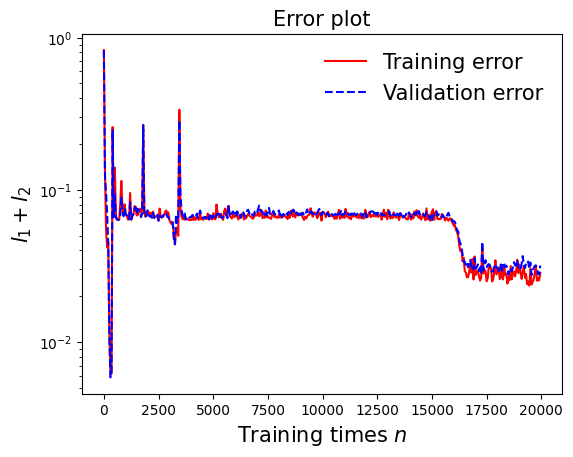

In [110]:
draw_loss(model7)

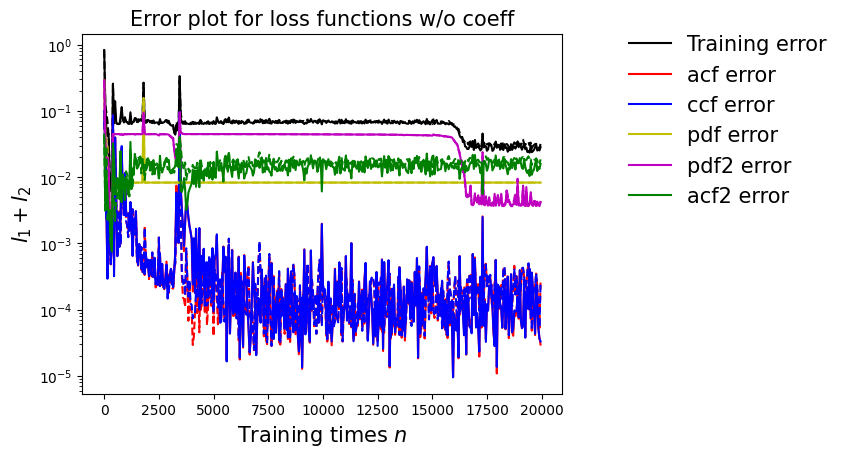

In [111]:
draw_errors(model7)

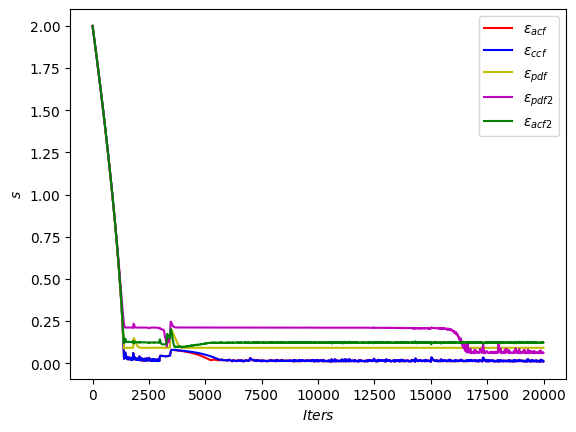

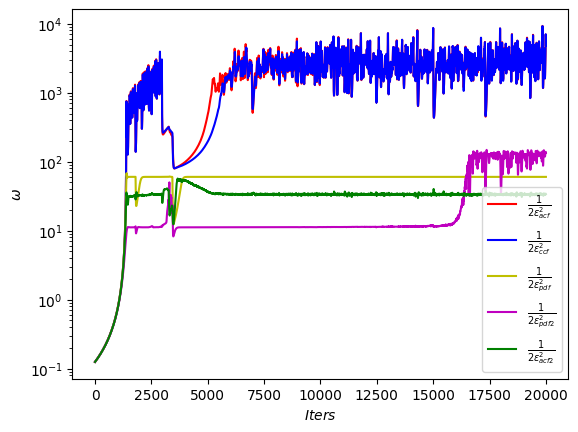

In [112]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

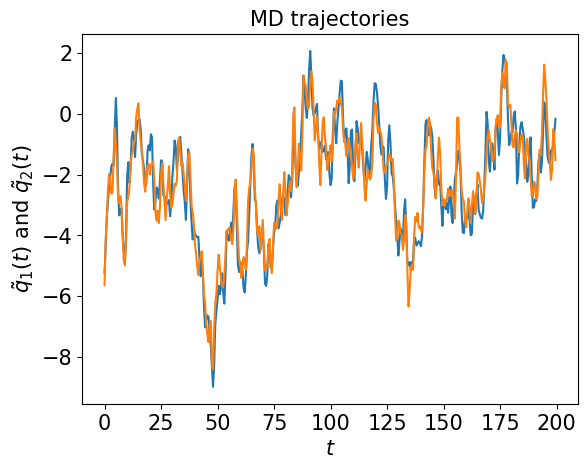

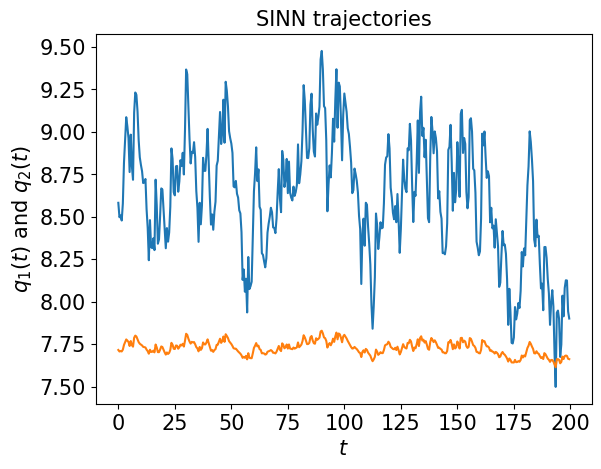

In [113]:
test1(model7)

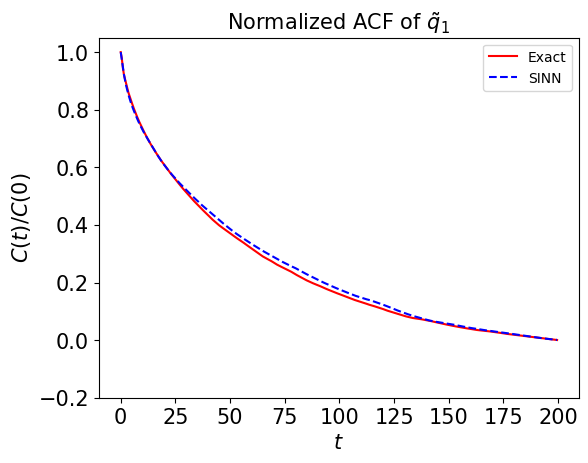

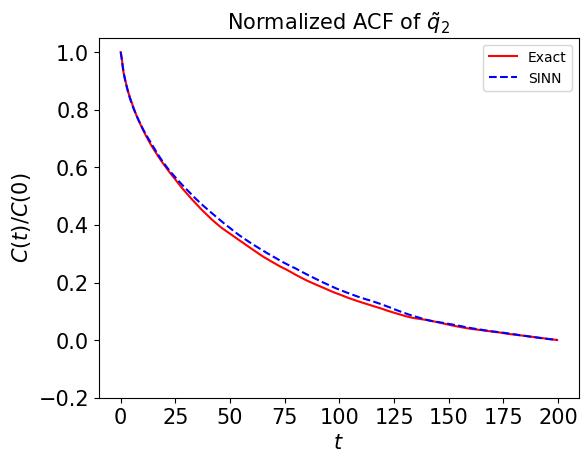

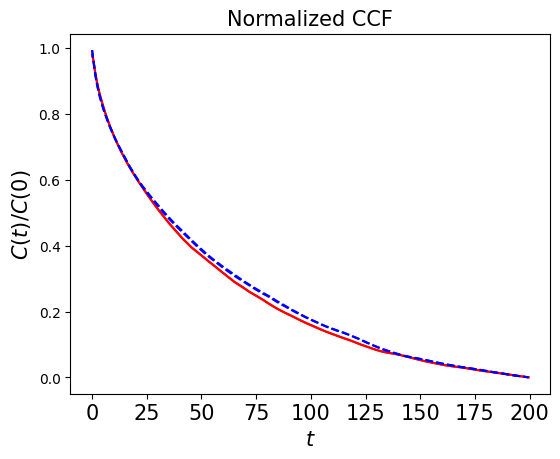

In [114]:
test2(model7)

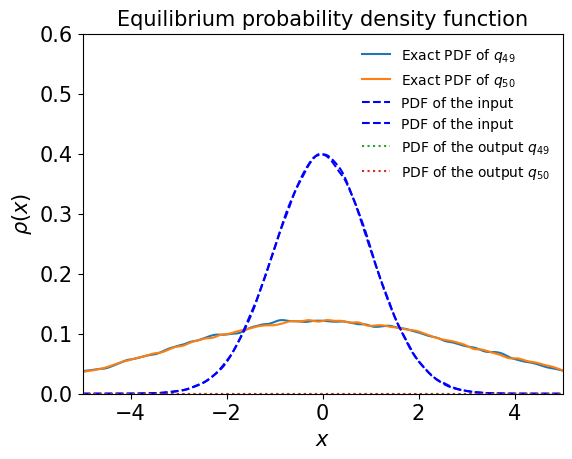

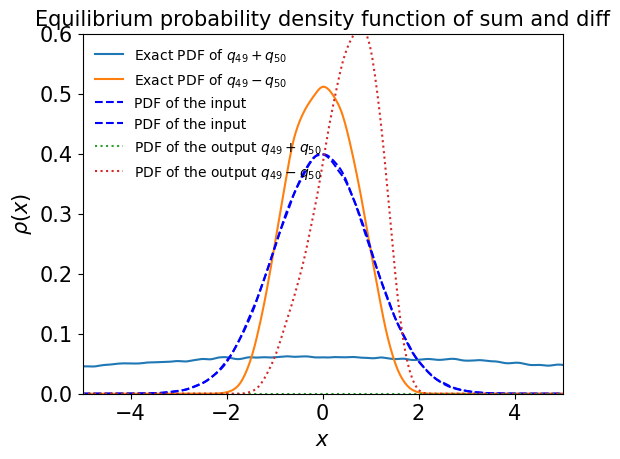

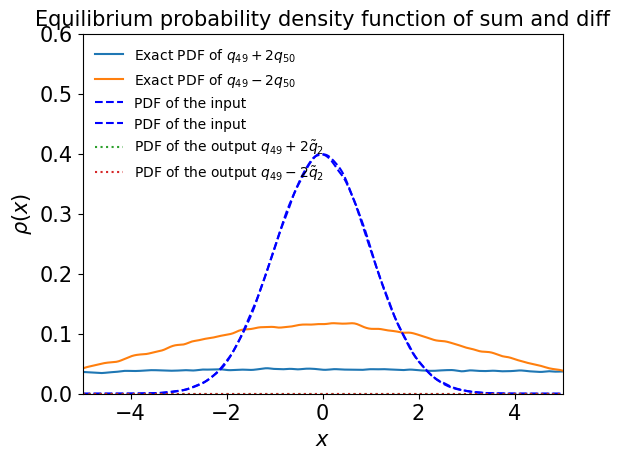

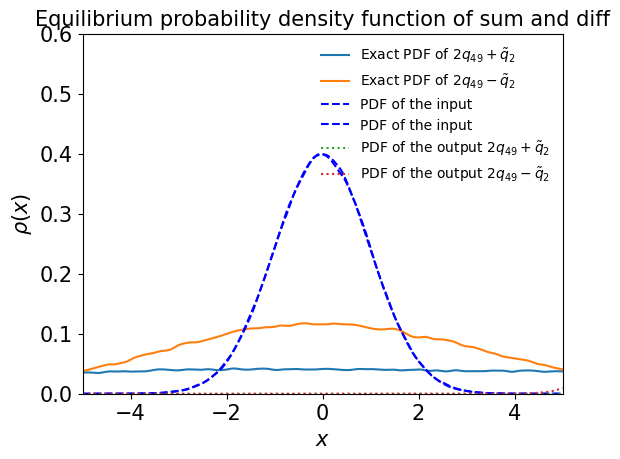

In [115]:
test3(model7)

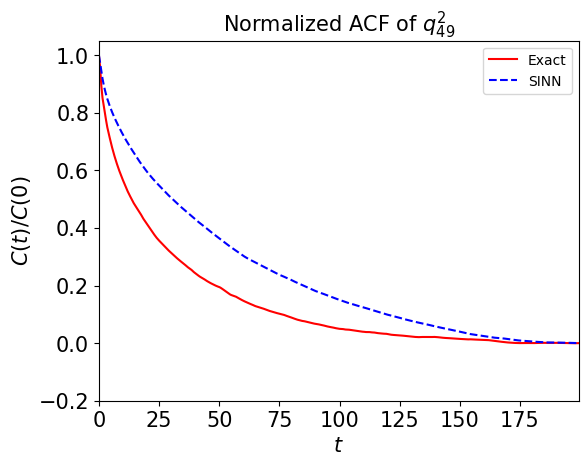

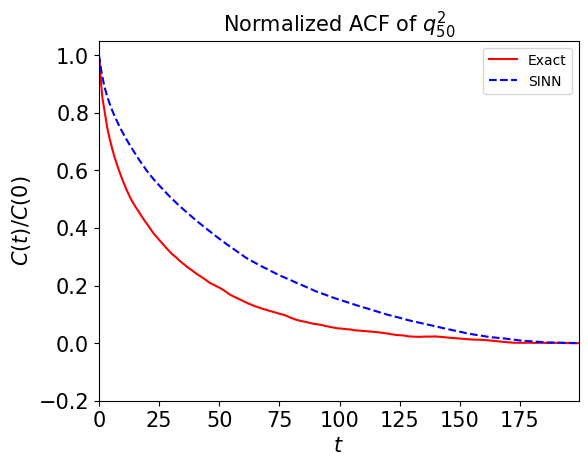

In [116]:
test4(model7)

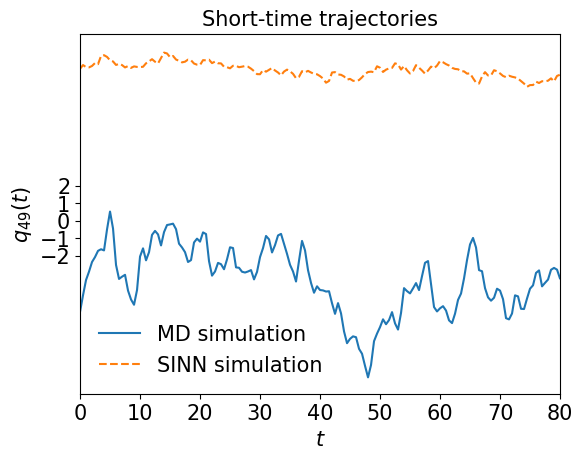

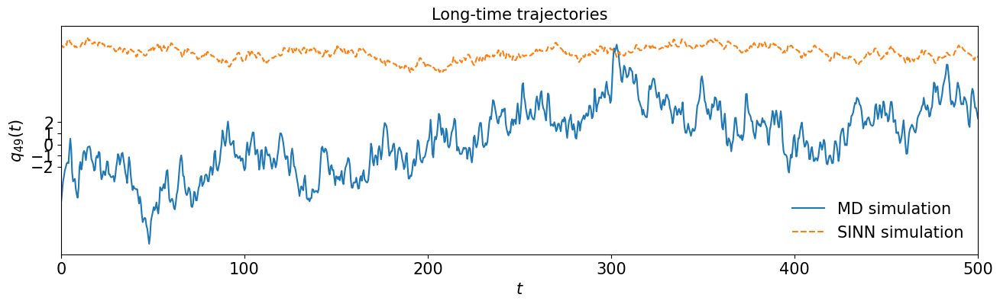

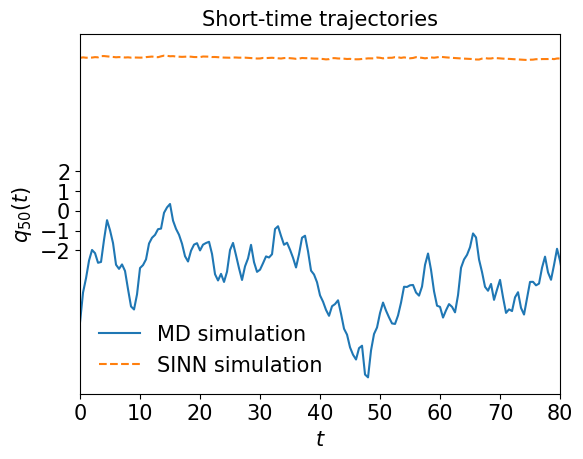

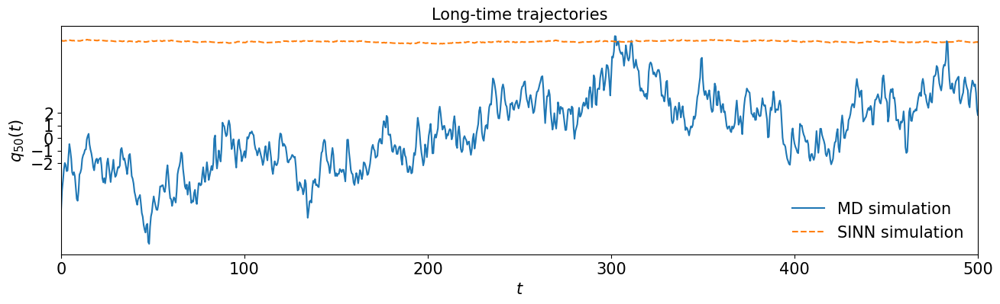

In [117]:
test5(model7)

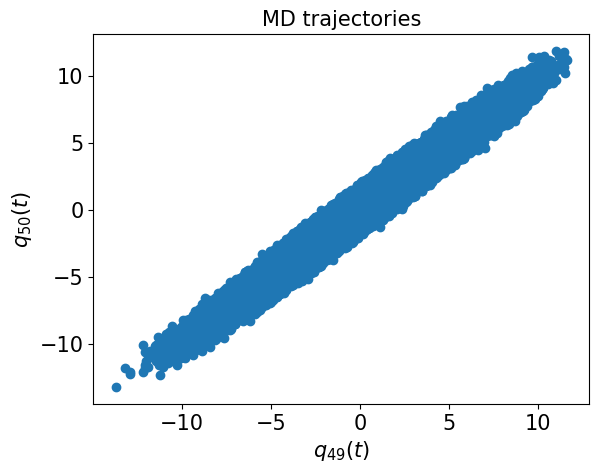

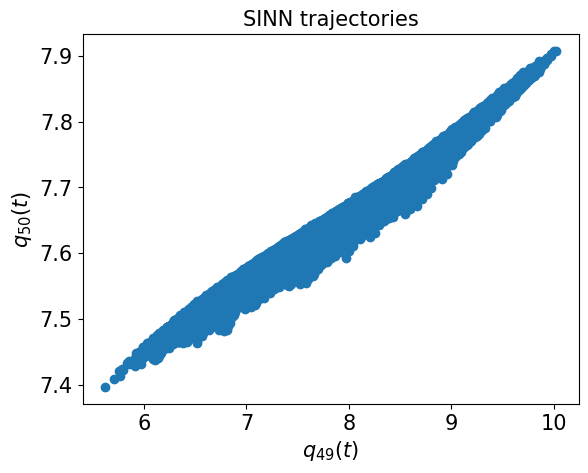

In [118]:
test6(model7)

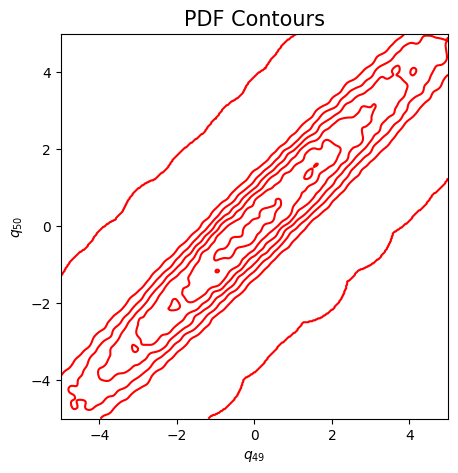

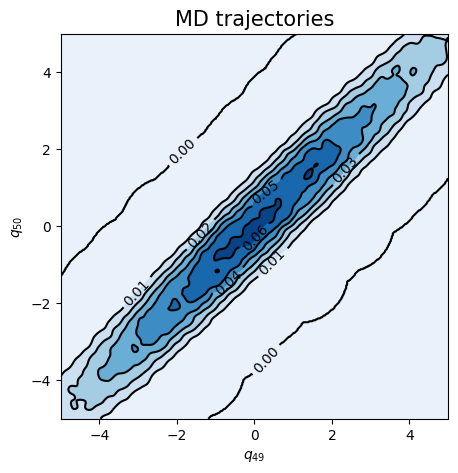

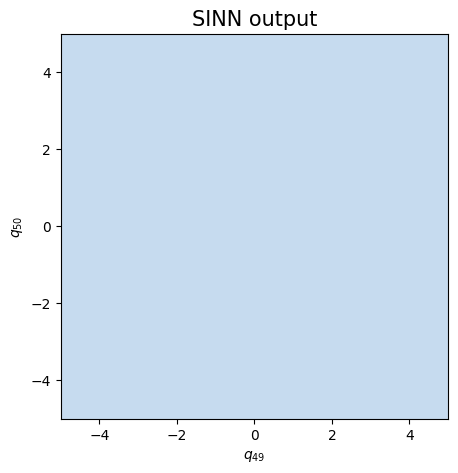

In [119]:
test7(model7)

In [120]:
### Defining SINN model
net8 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

[0]-th step loss: 0.8319, 0.8208, acf: 0.09683, ccf: 0.10022, pdf: 0.29319, pdf2: 0.28983, acf2: 0.04072
[50]-th step loss: 0.1099, 0.2348, acf: 0.01753, ccf: 0.01968, pdf: 0.12580, pdf2: 0.06652, acf2: 0.00526
[100]-th step loss: 0.2418, 0.1920, acf: 0.04061, ccf: 0.04277, pdf: 0.05952, pdf2: 0.03431, acf2: 0.01478
[150]-th step loss: 0.1211, 0.0922, acf: 0.02086, ccf: 0.02248, pdf: 0.02690, pdf2: 0.01323, acf2: 0.00875
[200]-th step loss: 0.0952, 0.0910, acf: 0.02743, ccf: 0.02739, pdf: 0.02319, pdf2: 0.00956, acf2: 0.00338
[250]-th step loss: 0.5047, 0.5064, acf: 0.04350, ccf: 0.04341, pdf: 0.30150, pdf2: 0.10929, acf2: 0.00866
[300]-th step loss: 0.4425, 0.4409, acf: 0.01231, ccf: 0.01217, pdf: 0.30116, pdf2: 0.10899, acf2: 0.00625
[350]-th step loss: 0.4225, 0.4242, acf: 0.00520, ccf: 0.00517, pdf: 0.30094, pdf2: 0.10802, acf2: 0.00490
[400]-th step loss: 0.4198, 0.4202, acf: 0.00407, ccf: 0.00405, pdf: 0.30024, pdf2: 0.10753, acf2: 0.00427
[450]-th step loss: 0.3779, 0.3906, acf:

[3850]-th step loss: 0.0379, 0.0448, acf: 0.01624, ccf: 0.01619, pdf: 0.00829, pdf2: 0.00399, acf2: 0.00006
[3900]-th step loss: 0.0430, 0.0453, acf: 0.01642, ccf: 0.01635, pdf: 0.00829, pdf2: 0.00414, acf2: 0.00007
[3950]-th step loss: 0.0454, 0.0496, acf: 0.01869, ccf: 0.01861, pdf: 0.00829, pdf2: 0.00373, acf2: 0.00025
[4000]-th step loss: 0.0337, 0.0403, acf: 0.01404, ccf: 0.01397, pdf: 0.00829, pdf2: 0.00397, acf2: 0.00003
[4050]-th step loss: 0.0488, 0.0422, acf: 0.01507, ccf: 0.01501, pdf: 0.00829, pdf2: 0.00383, acf2: 0.00002
[4100]-th step loss: 0.0348, 0.0428, acf: 0.01541, ccf: 0.01536, pdf: 0.00829, pdf2: 0.00370, acf2: 0.00004
[4150]-th step loss: 0.0343, 0.0429, acf: 0.01540, ccf: 0.01534, pdf: 0.00829, pdf2: 0.00381, acf2: 0.00004
[4200]-th step loss: 0.0418, 0.0430, acf: 0.01548, ccf: 0.01543, pdf: 0.00829, pdf2: 0.00376, acf2: 0.00003
[4250]-th step loss: 0.0341, 0.0424, acf: 0.01496, ccf: 0.01490, pdf: 0.00829, pdf2: 0.00422, acf2: 0.00005
[4300]-th step loss: 0.0311,

[7650]-th step loss: 0.0350, 0.0401, acf: 0.01410, ccf: 0.01405, pdf: 0.00829, pdf2: 0.00368, acf2: 0.00003
[7700]-th step loss: 0.0485, 0.0435, acf: 0.01570, ccf: 0.01564, pdf: 0.00829, pdf2: 0.00385, acf2: 0.00004
[7750]-th step loss: 0.0481, 0.0437, acf: 0.01584, ccf: 0.01578, pdf: 0.00829, pdf2: 0.00369, acf2: 0.00005
[7800]-th step loss: 0.0408, 0.0384, acf: 0.01313, ccf: 0.01309, pdf: 0.00829, pdf2: 0.00386, acf2: 0.00004
[7850]-th step loss: 0.1023, 0.0869, acf: 0.02241, ccf: 0.02238, pdf: 0.00684, pdf2: 0.03111, acf2: 0.00418
[7900]-th step loss: 0.0424, 0.0362, acf: 0.00687, ccf: 0.00663, pdf: 0.00829, pdf2: 0.01147, acf2: 0.00295
[7950]-th step loss: 0.0339, 0.0294, acf: 0.00094, ccf: 0.00094, pdf: 0.00829, pdf2: 0.00986, acf2: 0.00941
[8000]-th step loss: 0.0264, 0.0263, acf: 0.00240, ccf: 0.00240, pdf: 0.00829, pdf2: 0.00576, acf2: 0.00740
[8050]-th step loss: 0.0245, 0.0249, acf: 0.00307, ccf: 0.00307, pdf: 0.00829, pdf2: 0.00498, acf2: 0.00545
[8100]-th step loss: 0.0252,

[11450]-th step loss: 0.0202, 0.0199, acf: 0.00008, ccf: 0.00008, pdf: 0.00828, pdf2: 0.00415, acf2: 0.00735
[11500]-th step loss: 0.0180, 0.0181, acf: 0.00019, ccf: 0.00017, pdf: 0.00825, pdf2: 0.00400, acf2: 0.00544
[11550]-th step loss: 0.0179, 0.0193, acf: 0.00004, ccf: 0.00003, pdf: 0.00824, pdf2: 0.00382, acf2: 0.00716
[11600]-th step loss: 0.0339, 0.0298, acf: 0.00061, ccf: 0.00059, pdf: 0.01674, pdf2: 0.00619, acf2: 0.00564
[11650]-th step loss: 0.0201, 0.0192, acf: 0.00011, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00691
[11700]-th step loss: 0.0207, 0.0200, acf: 0.00006, ccf: 0.00005, pdf: 0.00826, pdf2: 0.00410, acf2: 0.00756
[11750]-th step loss: 0.0233, 0.0200, acf: 0.00003, ccf: 0.00003, pdf: 0.00827, pdf2: 0.00394, acf2: 0.00770
[11800]-th step loss: 0.0179, 0.0187, acf: 0.00010, ccf: 0.00009, pdf: 0.00835, pdf2: 0.00406, acf2: 0.00610
[11850]-th step loss: 0.0241, 0.0198, acf: 0.00007, ccf: 0.00006, pdf: 0.00833, pdf2: 0.00396, acf2: 0.00733
[11900]-th step los

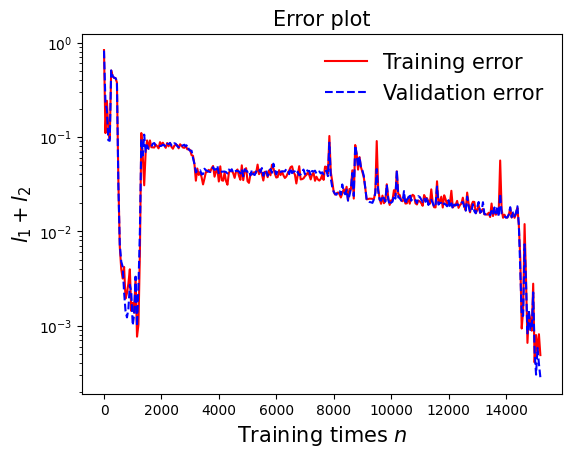

In [121]:
draw_loss(model8)

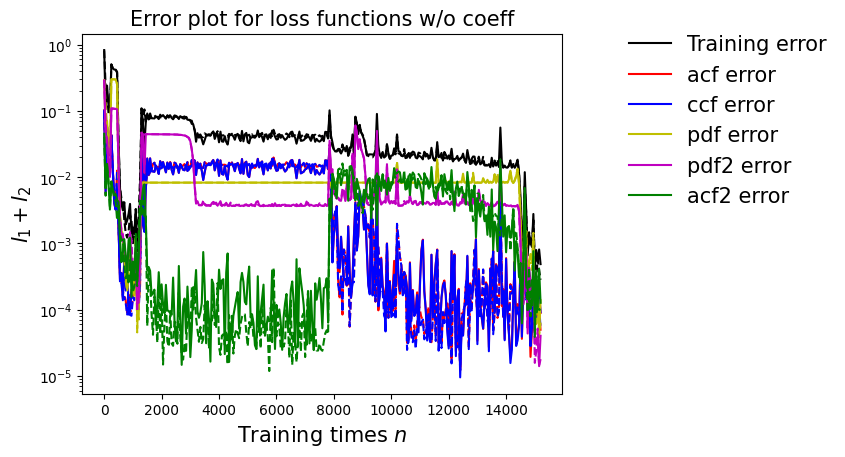

In [122]:
draw_errors(model8)

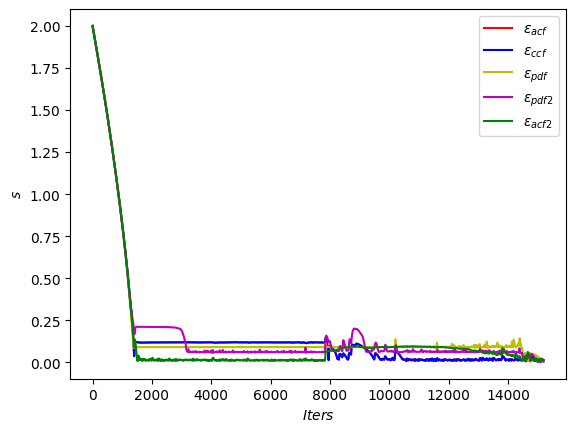

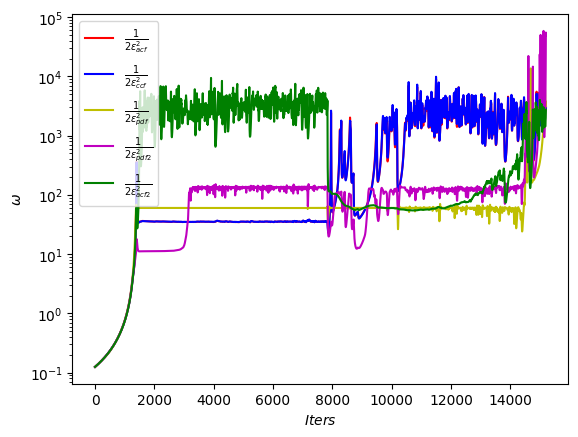

In [123]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

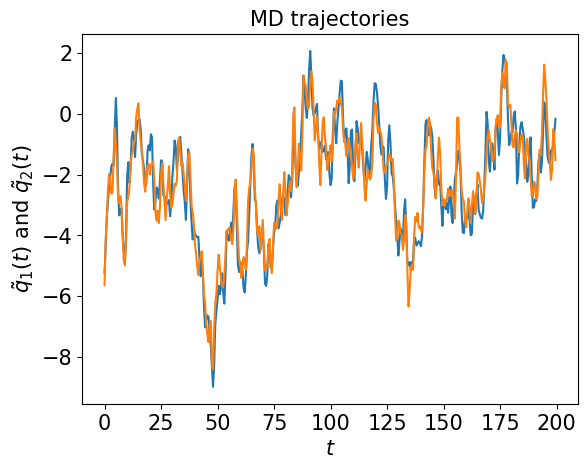

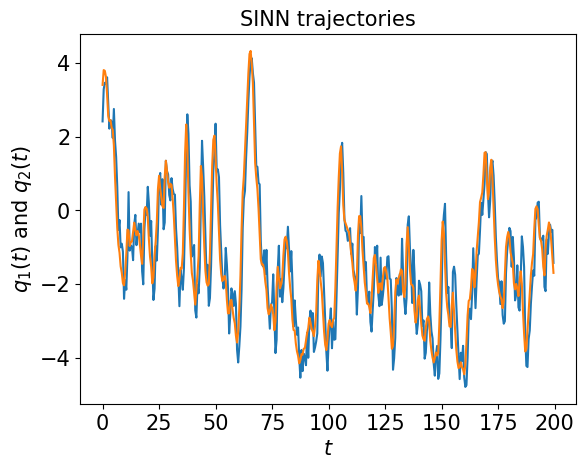

In [124]:
test1(model8)

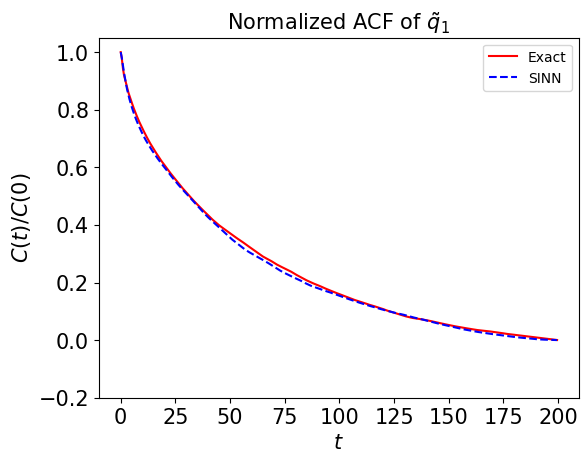

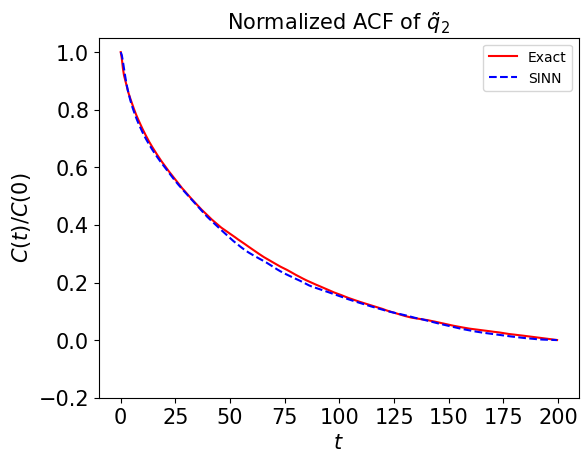

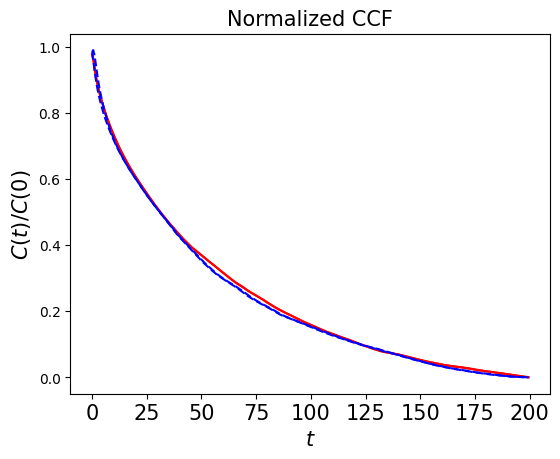

In [125]:
test2(model8)

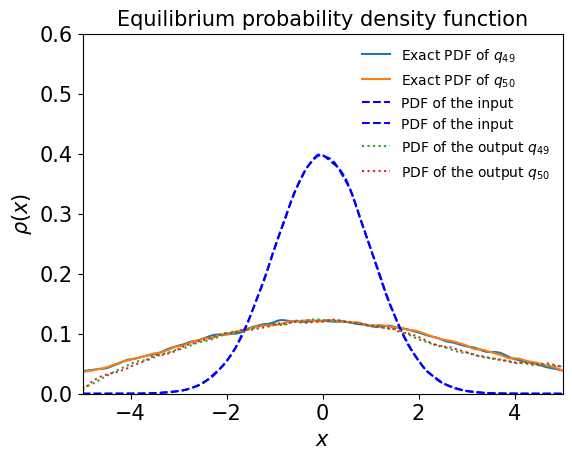

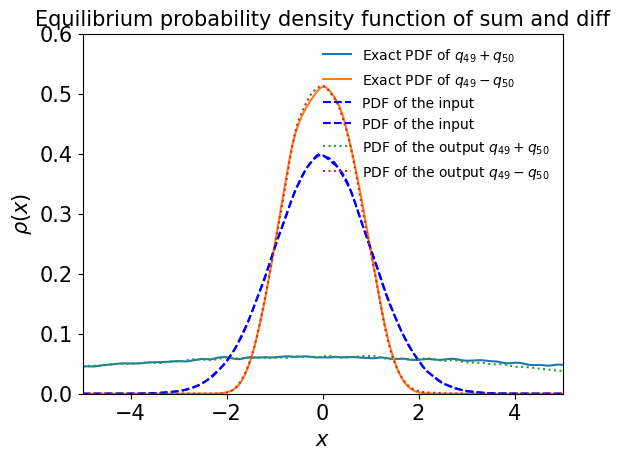

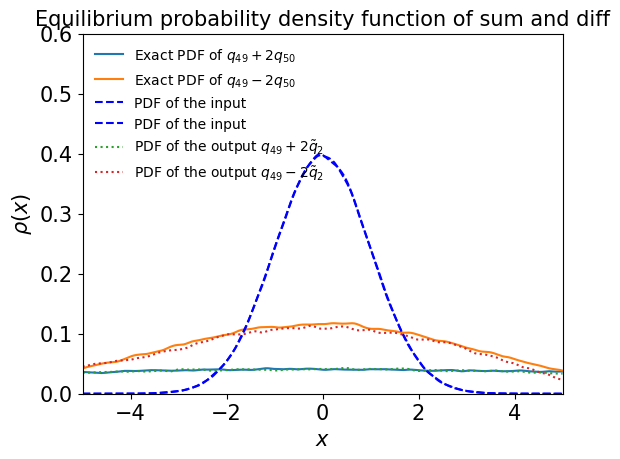

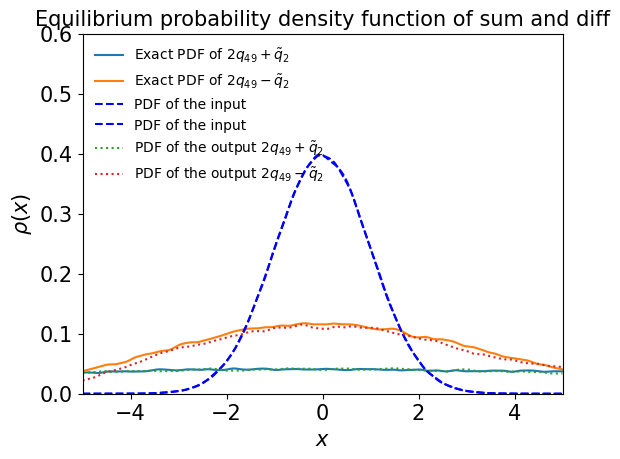

In [126]:
test3(model8)

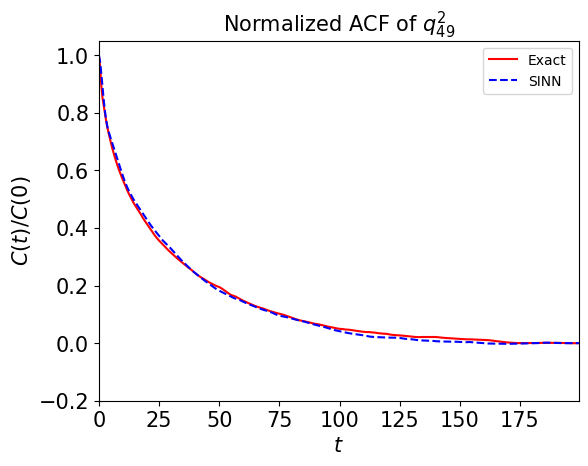

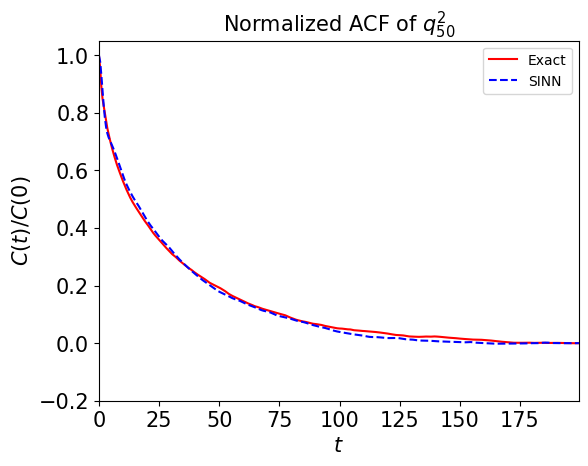

In [127]:
test4(model8)

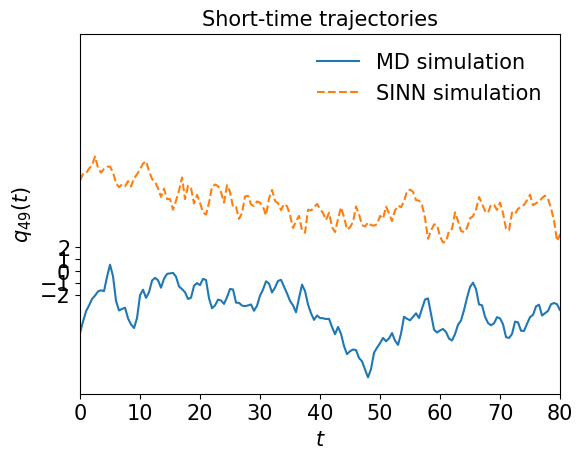

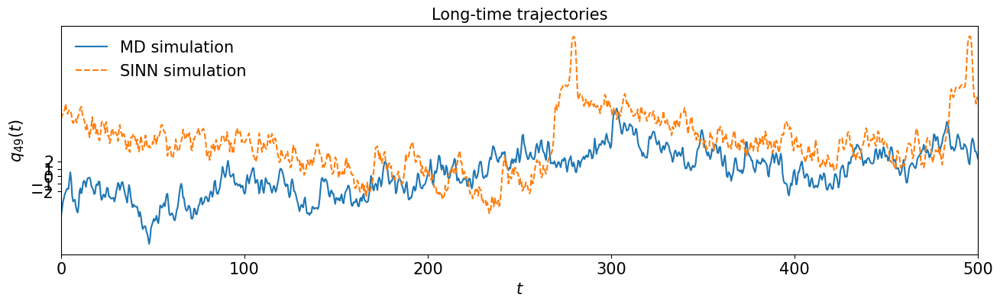

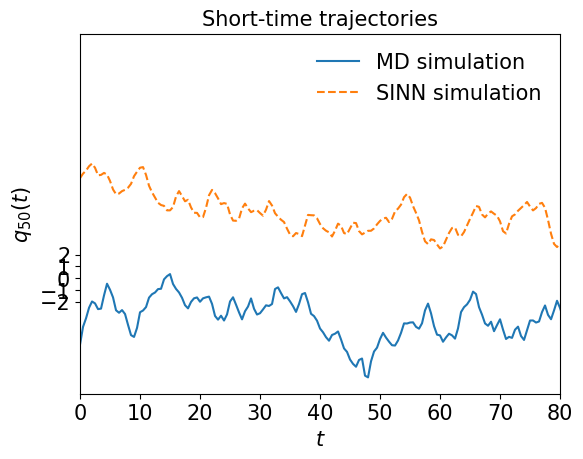

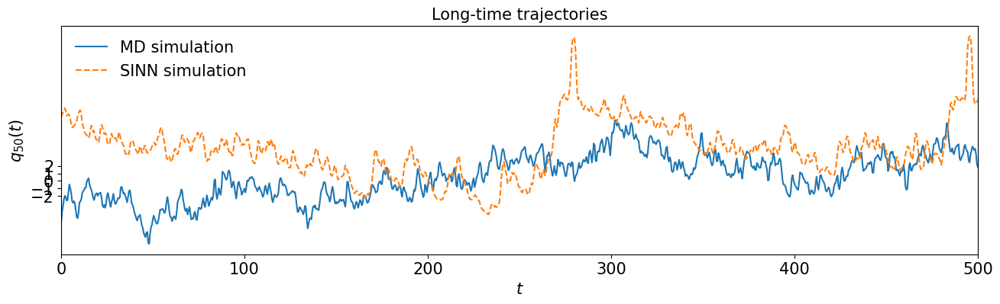

In [128]:
test5(model8)

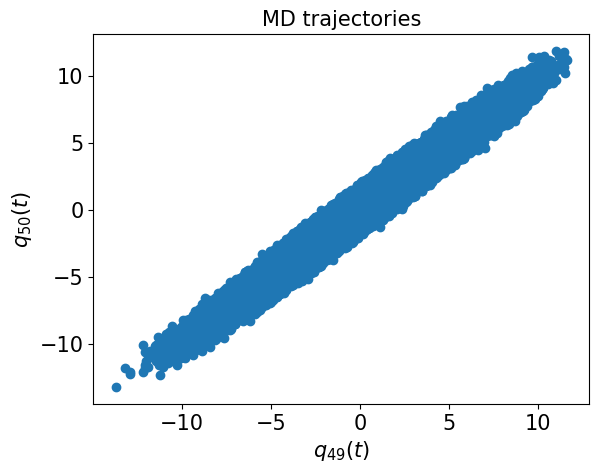

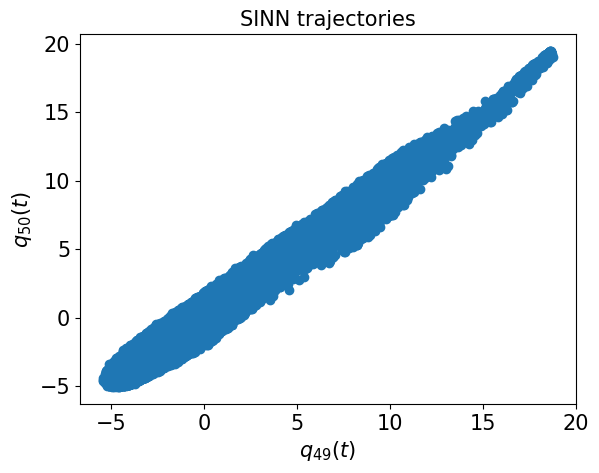

In [129]:
test6(model8)

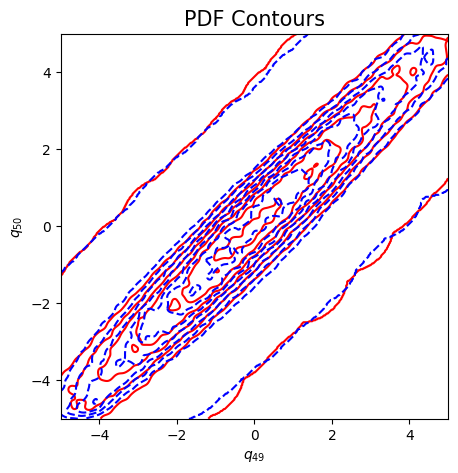

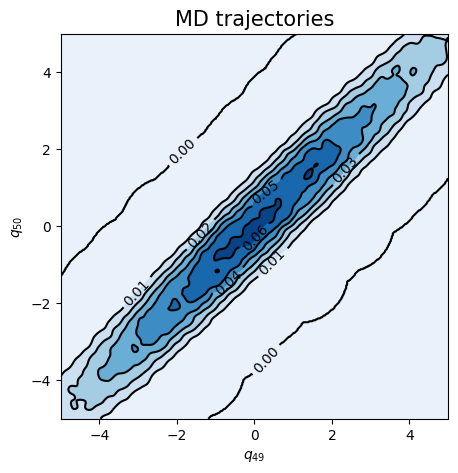

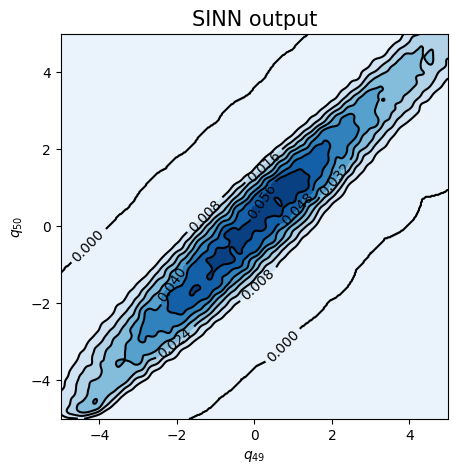

In [130]:
test7(model8)

In [131]:
### Defining SINN model
net9 = SINN(2, 50, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

[0]-th step loss: 0.8615, 0.8248, acf: 0.09948, ccf: 0.09912, pdf: 0.29326, pdf2: 0.28998, acf2: 0.04292
[50]-th step loss: 0.0998, 0.0991, acf: 0.00449, ccf: 0.00461, pdf: 0.05797, pdf2: 0.03026, acf2: 0.00179
[100]-th step loss: 0.0417, 0.0379, acf: 0.00260, ccf: 0.00260, pdf: 0.01756, pdf2: 0.01041, acf2: 0.00471
[150]-th step loss: 0.0349, 0.0304, acf: 0.00090, ccf: 0.00088, pdf: 0.01515, pdf2: 0.01173, acf2: 0.00174
[200]-th step loss: 0.0272, 0.0362, acf: 0.00186, ccf: 0.00180, pdf: 0.01521, pdf2: 0.00916, acf2: 0.00815
[250]-th step loss: 0.0178, 0.0152, acf: 0.00091, ccf: 0.00046, pdf: 0.00604, pdf2: 0.00619, acf2: 0.00157
[300]-th step loss: 0.0180, 0.0172, acf: 0.00125, ccf: 0.00056, pdf: 0.00656, pdf2: 0.00702, acf2: 0.00176
[350]-th step loss: 0.0242, 0.0226, acf: 0.00156, ccf: 0.00135, pdf: 0.00814, pdf2: 0.00813, acf2: 0.00342
[400]-th step loss: 0.0124, 0.0131, acf: 0.00142, ccf: 0.00039, pdf: 0.00356, pdf2: 0.00543, acf2: 0.00228
[450]-th step loss: 0.0144, 0.0154, acf:

[3850]-th step loss: 0.0292, 0.0340, acf: 0.00047, ccf: 0.00049, pdf: 0.00829, pdf2: 0.00462, acf2: 0.02014
[3900]-th step loss: 0.0288, 0.0278, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00399, acf2: 0.01542
[3950]-th step loss: 0.0260, 0.0288, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01650
[4000]-th step loss: 0.0300, 0.0232, acf: 0.00040, ccf: 0.00035, pdf: 0.00829, pdf2: 0.00440, acf2: 0.00980
[4050]-th step loss: 0.0288, 0.0268, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00377, acf2: 0.01468
[4100]-th step loss: 0.0337, 0.0328, acf: 0.00034, ccf: 0.00034, pdf: 0.00829, pdf2: 0.00454, acf2: 0.01929
[4150]-th step loss: 0.0233, 0.0267, acf: 0.00002, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01464
[4200]-th step loss: 0.0278, 0.0281, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01600
[4250]-th step loss: 0.0230, 0.0266, acf: 0.00003, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00401, acf2: 0.01427
[4300]-th step loss: 0.0279,

[7650]-th step loss: 0.0301, 0.0304, acf: 0.00022, ccf: 0.00023, pdf: 0.00829, pdf2: 0.00411, acf2: 0.01751
[7700]-th step loss: 0.0265, 0.0282, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01577
[7750]-th step loss: 0.0252, 0.0279, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00419, acf2: 0.01538
[7800]-th step loss: 0.0261, 0.0276, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01544
[7850]-th step loss: 0.0256, 0.0278, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00399, acf2: 0.01523
[7900]-th step loss: 0.0264, 0.0316, acf: 0.00039, ccf: 0.00040, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01867
[7950]-th step loss: 0.0242, 0.0289, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.00376, acf2: 0.01653
[8000]-th step loss: 0.0265, 0.0241, acf: 0.00008, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00386, acf2: 0.01176
[8050]-th step loss: 0.0253, 0.0300, acf: 0.00028, ccf: 0.00029, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01740
[8100]-th step loss: 0.0233,

[11450]-th step loss: 0.0229, 0.0295, acf: 0.00039, ccf: 0.00039, pdf: 0.00829, pdf2: 0.00366, acf2: 0.01679
[11500]-th step loss: 0.0235, 0.0291, acf: 0.00027, ccf: 0.00027, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01652
[11550]-th step loss: 0.0255, 0.0300, acf: 0.00033, ccf: 0.00034, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01734
[11600]-th step loss: 0.0283, 0.0332, acf: 0.00071, ccf: 0.00072, pdf: 0.00829, pdf2: 0.00372, acf2: 0.01980
[11650]-th step loss: 0.0290, 0.0283, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00388, acf2: 0.01586
[11700]-th step loss: 0.0241, 0.0258, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01367
[11750]-th step loss: 0.0235, 0.0304, acf: 0.00047, ccf: 0.00048, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01752
[11800]-th step loss: 0.0296, 0.0318, acf: 0.00063, ccf: 0.00063, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01837
[11850]-th step loss: 0.0249, 0.0254, acf: 0.00022, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00440, acf2: 0.01223
[11900]-th step los

[15250]-th step loss: 0.0247, 0.0291, acf: 0.00036, ccf: 0.00036, pdf: 0.00826, pdf2: 0.00368, acf2: 0.01643
[15300]-th step loss: 0.0234, 0.0267, acf: 0.00024, ccf: 0.00025, pdf: 0.00823, pdf2: 0.00374, acf2: 0.01426
[15350]-th step loss: 0.0214, 0.0287, acf: 0.00045, ccf: 0.00046, pdf: 0.00822, pdf2: 0.00393, acf2: 0.01565
[15400]-th step loss: 0.0211, 0.0284, acf: 0.00036, ccf: 0.00036, pdf: 0.00822, pdf2: 0.00368, acf2: 0.01579
[15450]-th step loss: 0.0246, 0.0273, acf: 0.00019, ccf: 0.00019, pdf: 0.00826, pdf2: 0.00365, acf2: 0.01495
[15500]-th step loss: 0.0232, 0.0274, acf: 0.00025, ccf: 0.00025, pdf: 0.00824, pdf2: 0.00370, acf2: 0.01495
[15550]-th step loss: 0.0230, 0.0260, acf: 0.00010, ccf: 0.00011, pdf: 0.00825, pdf2: 0.00369, acf2: 0.01386
[15600]-th step loss: 0.0241, 0.0260, acf: 0.00004, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00398, acf2: 0.01369
[15650]-th step loss: 0.0237, 0.0293, acf: 0.00046, ccf: 0.00046, pdf: 0.00823, pdf2: 0.00360, acf2: 0.01653
[15700]-th step los

[19050]-th step loss: 0.0210, 0.0268, acf: 0.00027, ccf: 0.00027, pdf: 0.00803, pdf2: 0.00355, acf2: 0.01467
[19100]-th step loss: 0.0243, 0.0261, acf: 0.00009, ccf: 0.00009, pdf: 0.00830, pdf2: 0.00358, acf2: 0.01410
[19150]-th step loss: 0.0241, 0.0303, acf: 0.00075, ccf: 0.00075, pdf: 0.00812, pdf2: 0.00357, acf2: 0.01707
[19200]-th step loss: 0.0216, 0.0268, acf: 0.00030, ccf: 0.00030, pdf: 0.00804, pdf2: 0.00354, acf2: 0.01464
[19250]-th step loss: 0.0245, 0.0285, acf: 0.00032, ccf: 0.00032, pdf: 0.00809, pdf2: 0.00439, acf2: 0.01539
[19300]-th step loss: 0.0237, 0.0276, acf: 0.00051, ccf: 0.00052, pdf: 0.00793, pdf2: 0.00349, acf2: 0.01512
[19350]-th step loss: 0.0210, 0.0242, acf: 0.00006, ccf: 0.00006, pdf: 0.00801, pdf2: 0.00349, acf2: 0.01259
[19400]-th step loss: 0.0247, 0.0252, acf: 0.00010, ccf: 0.00011, pdf: 0.00815, pdf2: 0.00365, acf2: 0.01321
[19450]-th step loss: 0.0278, 0.0283, acf: 0.00033, ccf: 0.00033, pdf: 0.00797, pdf2: 0.00369, acf2: 0.01599
[19500]-th step los

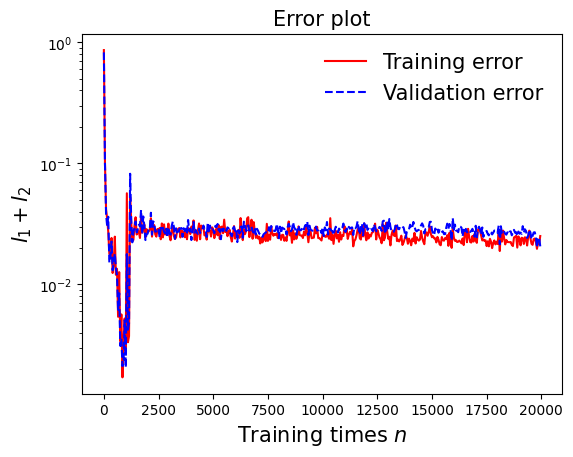

In [132]:
draw_loss(model9)

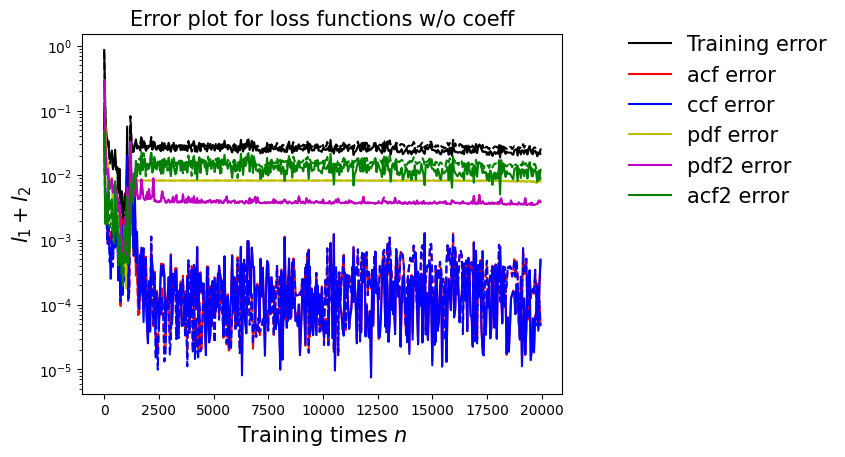

In [133]:
draw_errors(model9)

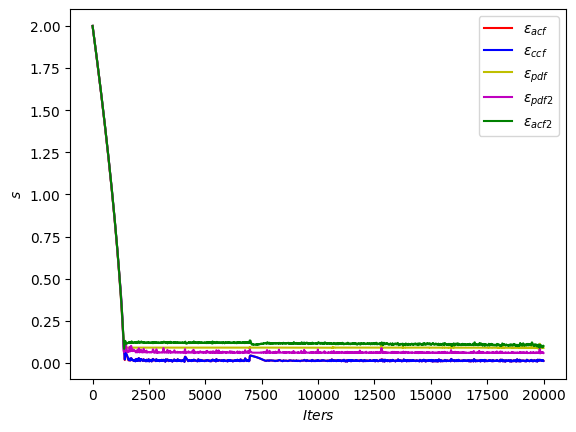

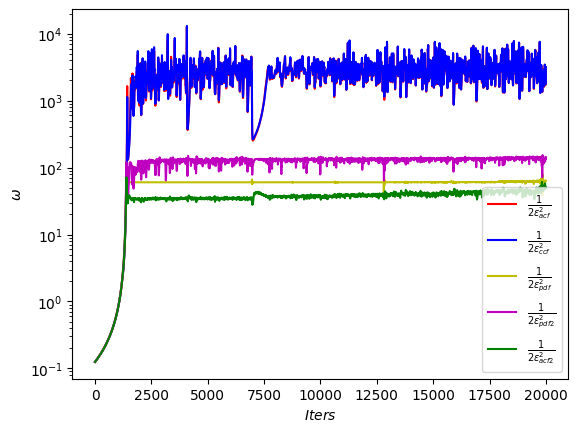

In [134]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

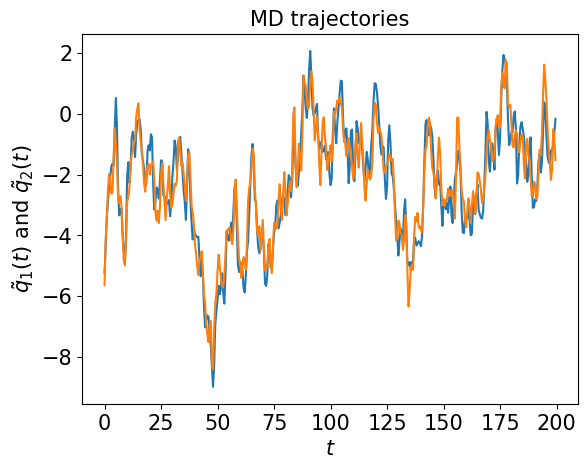

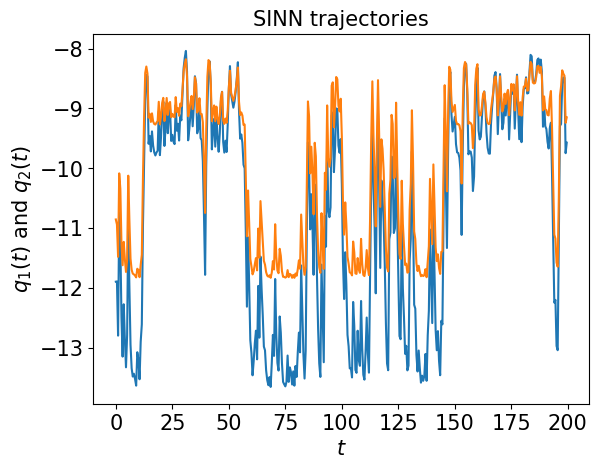

In [135]:
test1(model9)

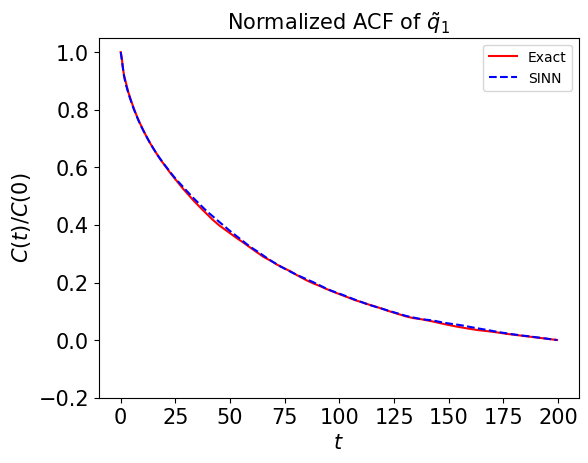

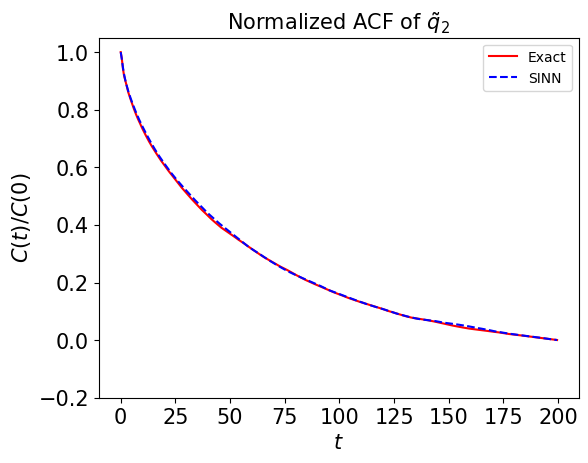

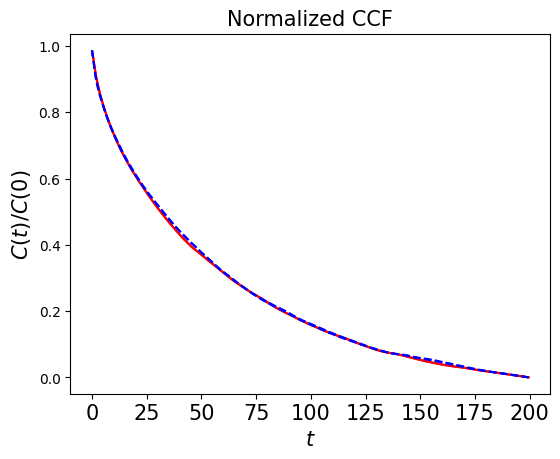

In [136]:
test2(model9)

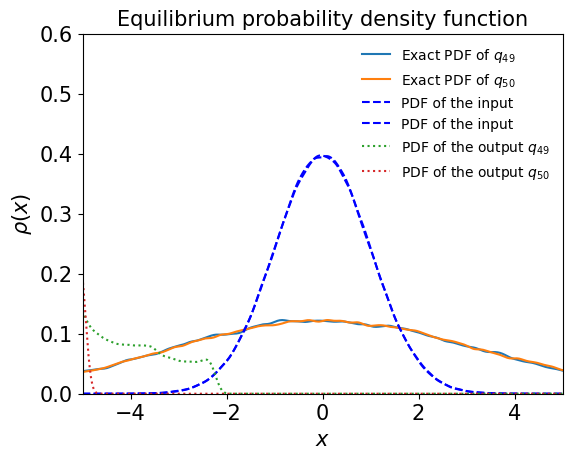

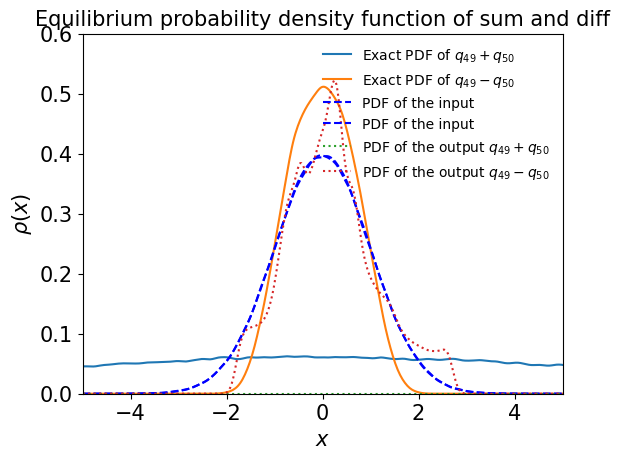

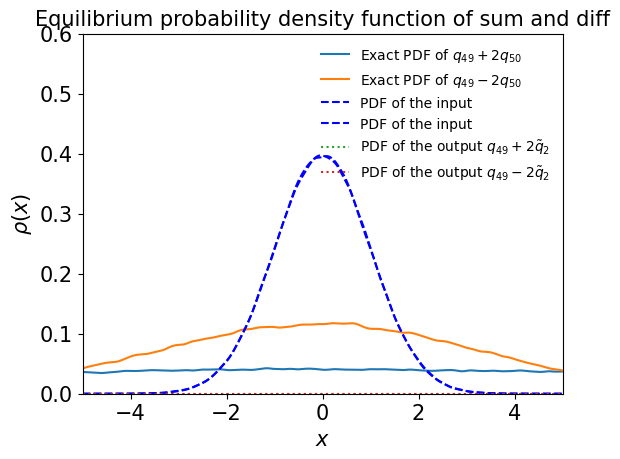

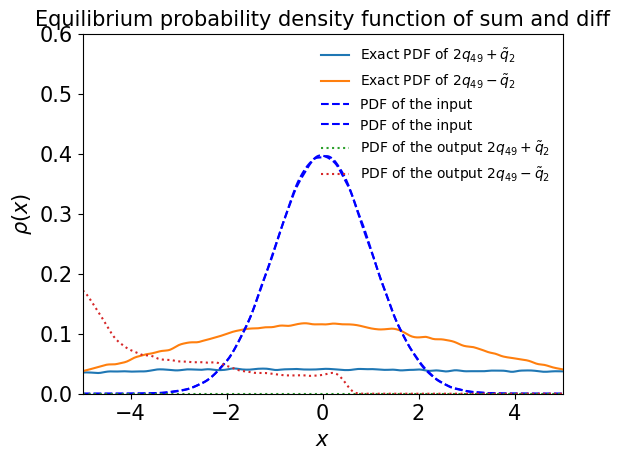

In [137]:
test3(model9)

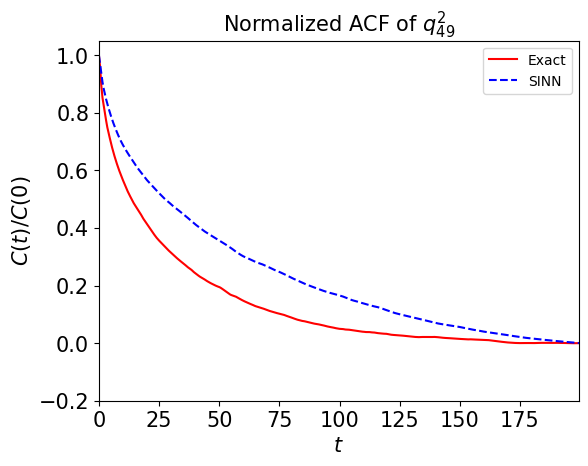

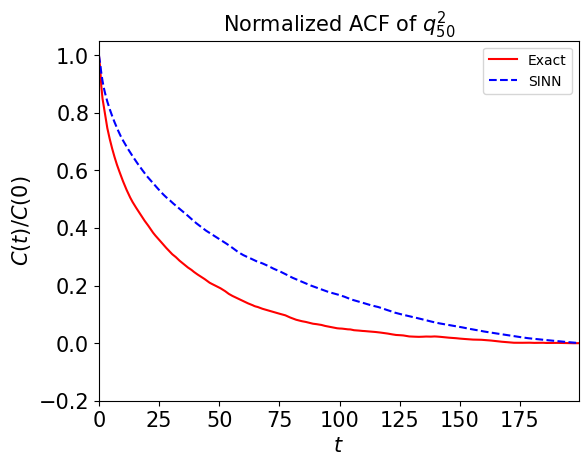

In [138]:
test4(model9)

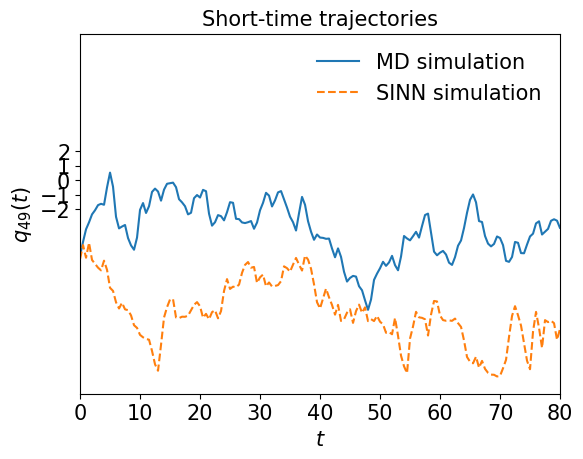

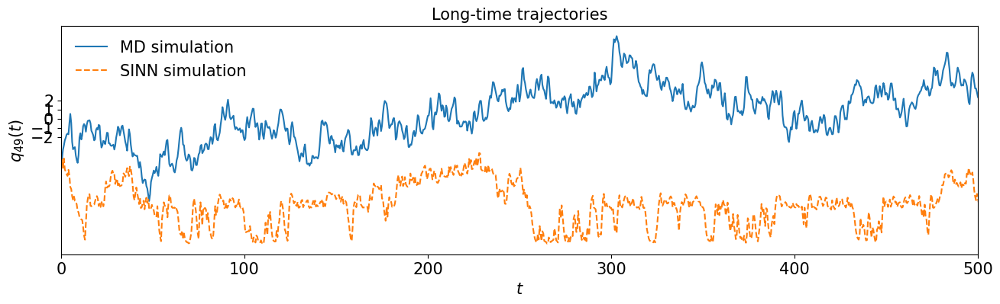

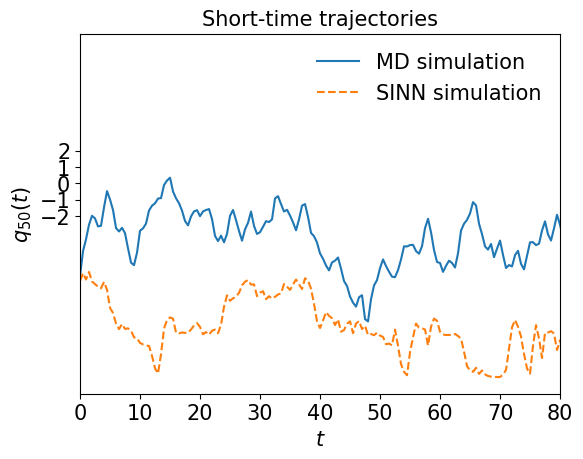

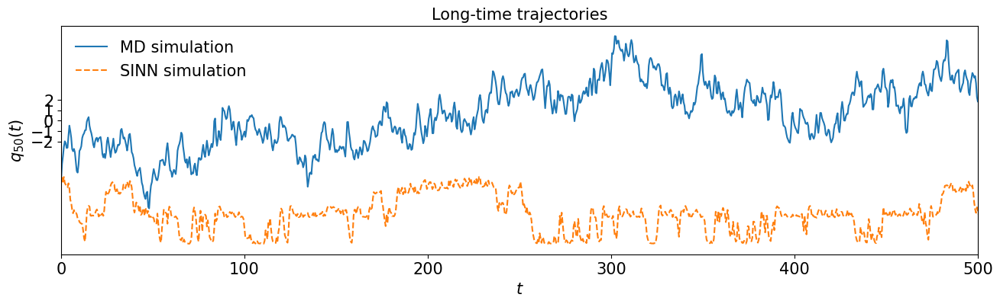

In [139]:
test5(model9)

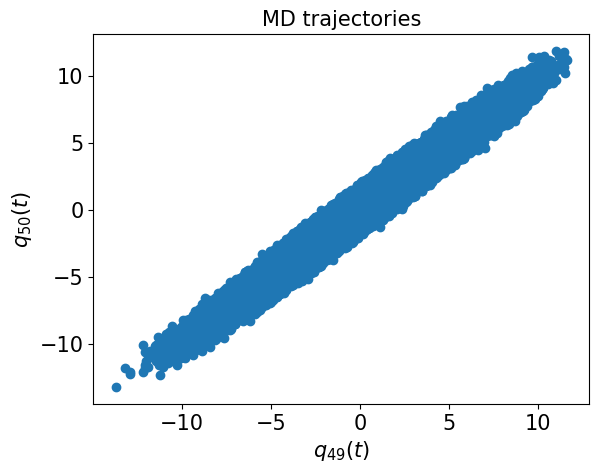

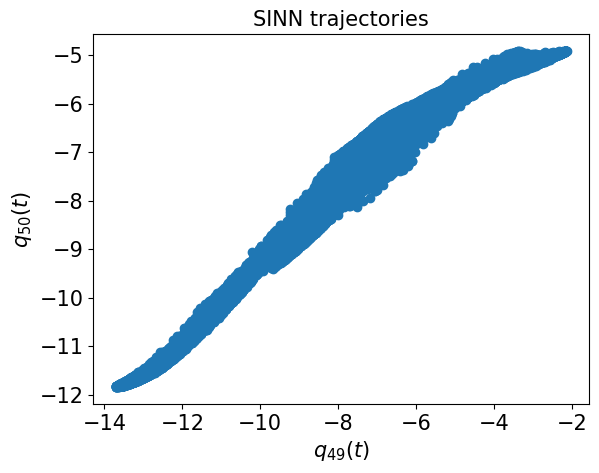

In [140]:
test6(model9)

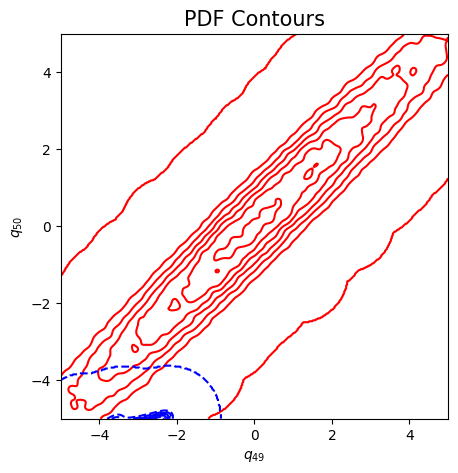

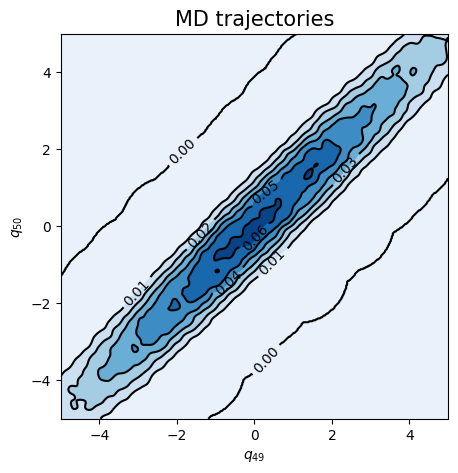

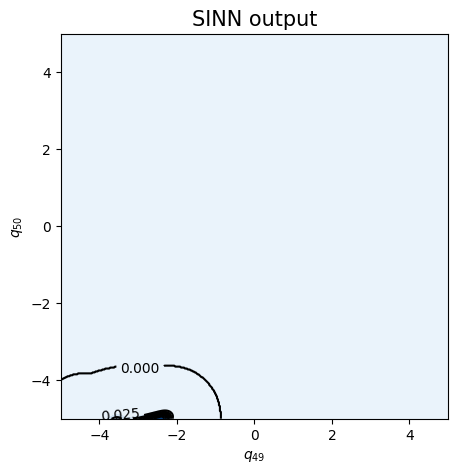

In [141]:
test7(model9)